In [1]:
from platon.combined_retriever import CombinedRetriever
from platon.constants import R_sun,R_jup,M_jup,AU,M_earth
import numpy as np
import matplotlib.pyplot as plt

In [8]:
import numpy as np
wave,wave_err,Rad,Rad_err=np.loadtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_spectra_emcee_new.txt',skiprows=0,unpack=True)

#print (wave,wave_err)
import numpy as np
w_spit,w_err_spit,rp_spit,rp_err_spit= np.loadtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/spitzer_rprs.txt',usecols=(0,1,2,3),unpack=True)
'''
for i in range(2):
    wave=np.append(wave,w_spit[i])
    wave_err=np.append(wave_err,w_err_spit[i])
    Rad=np.append(Rad,rp_spit[i]**2)
    Rad_err=np.append(Rad_err,2*rp_spit[i]*rp_err_spit[i])
kepler=[0.66,0.23,0.0713**2,2*0.0713*0.0021]

wave=np.insert(wave,0,kepler[0])
wave_err=np.insert(wave_err,0,kepler[1])
Rad=np.insert(Rad,0,kepler[2])
Rad_err=np.insert(Rad_err,0,kepler[3])
print (Rad)
print (Rad_err)
print (kepler)

'''

'\nfor i in range(2):\n    wave=np.append(wave,w_spit[i])\n    wave_err=np.append(wave_err,w_err_spit[i])\n    Rad=np.append(Rad,rp_spit[i]**2)\n    Rad_err=np.append(Rad_err,2*rp_spit[i]*rp_err_spit[i])\nkepler=[0.66,0.23,0.0713**2,2*0.0713*0.0021]\n\nwave=np.insert(wave,0,kepler[0])\nwave_err=np.insert(wave_err,0,kepler[1])\nRad=np.insert(Rad,0,kepler[2])\nRad_err=np.insert(Rad_err,0,kepler[3])\nprint (Rad)\nprint (Rad_err)\nprint (kepler)\n\n'

<ErrorbarContainer object of 3 artists>

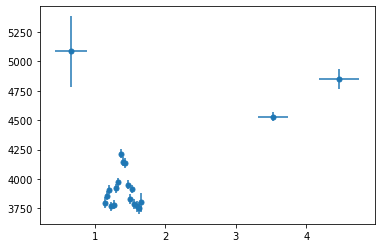

In [3]:
plt.errorbar(wave,(Rad)*1e6,yerr=(Rad_err)*1e6,xerr=wave_err,ls='none',marker='.',ms=10)

In [4]:
wavebins=np.zeros([len(wave),2])
#dw=(1.65-1.12)/17
dw=0.013969530897124827
for i in range(len(wave)):
    wavebins[i,0]=(wave[i]-wave_err[i])*1e-6
    wavebins[i,1]=(wave[i]+wave_err[i])*1e-6
print (wavebins,wave,Rad,Rad_err)

[[4.30000000e-07 8.90000000e-07]
 [1.12550243e-06 1.14412834e-06]
 [1.15809818e-06 1.17672516e-06]
 [1.19069577e-06 1.20932373e-06]
 [1.22329504e-06 1.24192389e-06]
 [1.25589584e-06 1.27452549e-06]
 [1.28849801e-06 1.30712839e-06]
 [1.32110142e-06 1.33973242e-06]
 [1.35370589e-06 1.37233744e-06]
 [1.38631129e-06 1.40494330e-06]
 [1.41891745e-06 1.43754983e-06]
 [1.45152423e-06 1.47015690e-06]
 [1.48413148e-06 1.50276434e-06]
 [1.51673903e-06 1.53537200e-06]
 [1.54934675e-06 1.56797974e-06]
 [1.58195447e-06 1.60058740e-06]
 [1.61456205e-06 1.63319482e-06]
 [1.64336596e-06 1.65097269e-06]
 [3.31702974e-06 3.74569746e-06]
 [4.18558903e-06 4.75260478e-06]] [0.66       1.13481538 1.16741167 1.20000975 1.23260946 1.26521066
 1.2978132  1.33041692 1.36302167 1.39562729 1.42823364 1.46084057
 1.49344791 1.52605552 1.55866325 1.59127094 1.62387844 1.64716932
 3.5313636  4.46909691] [0.00508369 0.00379928 0.00385735 0.00390708 0.00376746 0.00378207
 0.00391894 0.00397141 0.00421263 0.00414561 0.

In [5]:
retriever=CombinedRetriever()
R_guess=0.8*R_jup
T_star=4962
fit_info=retriever.get_default_fit_info(Rs=1.31*R_sun,Rp=R_guess,logZ=0.13,CO_ratio=0.53,T=668,Mp=25*M_earth,profile_type='isothermal',wfc3_offset_transit=-0.0001,log_scatt_factor=0.0,log_cloudtop_P=3)
fit_info.add_uniform_fit_param("logZ",0.0,2.5)
fit_info.add_uniform_fit_param("CO_ratio",0.2,2.0)
fit_info.add_uniform_fit_param("T",400,1500)
fit_info.add_uniform_fit_param("Mp",0.001*M_jup,1.0*M_jup)
fit_info.add_uniform_fit_param("Rp",0.5*R_jup,1.5*R_jup)

fit_info.add_uniform_fit_param("wfc3_offset_transit",-0.002,0.0)

fit_info.add_uniform_fit_param("log_scatt_factor",0.0,4.0)

fit_info.add_uniform_fit_param("log_cloudtop_P",0.0,5.0)




In [6]:
result=retriever.run_emcee(wavebins,Rad,Rad_err,None,None,None,fit_info,nwalkers=20,nsteps=20000,rad_method='ktables',include_condensation=True)




/Users/s.baratuva.nl/opt/anaconda3/lib/python3.8/site-packages/emcee-3.0.2-py3.8.egg/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


Step 10: ln_prob=-3.93e+03	logZ=0.97 	CO_ratio=1.20 	T= 853 K	Mp=0.48 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-734.70 ppm	log_scatt_factor=2.45 	log_cloudtop_P=2.55 	
Step 20: ln_prob=-7.37e+02	logZ=1.13 	CO_ratio=1.09 	T= 801 K	Mp=0.56 M_jup	Rp=0.90 R_jup	wfc3_offset_transit=-895.75 ppm	log_scatt_factor=2.05 	log_cloudtop_P=2.47 	
Step 30: ln_prob=-2.99e+02	logZ=0.85 	CO_ratio=0.91 	T= 771 K	Mp=0.61 M_jup	Rp=0.88 R_jup	wfc3_offset_transit=-796.96 ppm	log_scatt_factor=2.38 	log_cloudtop_P=1.98 	
Step 40: ln_prob=3.89e+01	logZ=1.12 	CO_ratio=1.29 	T= 911 K	Mp=0.49 M_jup	Rp=0.86 R_jup	wfc3_offset_transit=-821.41 ppm	log_scatt_factor=2.31 	log_cloudtop_P=1.94 	
Step 50: ln_prob=6.99e+01	logZ=1.24 	CO_ratio=1.38 	T=1047 K	Mp=0.46 M_jup	Rp=0.85 R_jup	wfc3_offset_transit=-727.98 ppm	log_scatt_factor=2.22 	log_cloudtop_P=1.82 	
Step 60: ln_prob=6.77e+01	logZ=1.92 	CO_ratio=1.92 	T=1326 K	Mp=0.37 M_jup	Rp=0.85 R_jup	wfc3_offset_transit=-765.74 ppm	log_scatt_factor=3.23 	log_cloudtop_P=1.99 	
S

Step 500: ln_prob=8.68e+01	logZ=0.54 	CO_ratio=1.39 	T= 738 K	Mp=0.25 M_jup	Rp=0.84 R_jup	wfc3_offset_transit=-679.03 ppm	log_scatt_factor=0.17 	log_cloudtop_P=3.54 	
Step 510: ln_prob=8.67e+01	logZ=0.42 	CO_ratio=0.23 	T=1215 K	Mp=0.21 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-644.29 ppm	log_scatt_factor=0.51 	log_cloudtop_P=3.55 	
Step 520: ln_prob=5.52e+01	logZ=0.54 	CO_ratio=1.07 	T= 847 K	Mp=0.37 M_jup	Rp=0.84 R_jup	wfc3_offset_transit=-663.19 ppm	log_scatt_factor=0.29 	log_cloudtop_P=3.46 	
Step 530: ln_prob=8.85e+01	logZ=0.80 	CO_ratio=0.74 	T=1056 K	Mp=0.27 M_jup	Rp=0.83 R_jup	wfc3_offset_transit=-667.12 ppm	log_scatt_factor=0.90 	log_cloudtop_P=3.59 	
Step 540: ln_prob=1.19e+02	logZ=0.38 	CO_ratio=0.50 	T=1024 K	Mp=0.18 M_jup	Rp=0.83 R_jup	wfc3_offset_transit=-751.48 ppm	log_scatt_factor=0.67 	log_cloudtop_P=3.49 	
Step 550: ln_prob=8.72e+01	logZ=0.55 	CO_ratio=1.36 	T= 739 K	Mp=0.27 M_jup	Rp=0.84 R_jup	wfc3_offset_transit=-687.37 ppm	log_scatt_factor=0.24 	log_cloudtop_P=3.56 

Step 990: ln_prob=8.57e+01	logZ=1.88 	CO_ratio=0.32 	T= 779 K	Mp=0.14 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-661.61 ppm	log_scatt_factor=3.42 	log_cloudtop_P=4.16 	
Step 1000: ln_prob=1.49e+02	logZ=2.01 	CO_ratio=0.24 	T= 776 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-618.98 ppm	log_scatt_factor=1.86 	log_cloudtop_P=2.20 	
Step 1010: ln_prob=1.39e+02	logZ=1.90 	CO_ratio=0.29 	T= 786 K	Mp=0.09 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-625.26 ppm	log_scatt_factor=1.85 	log_cloudtop_P=2.51 	
Step 1020: ln_prob=8.27e+01	logZ=1.30 	CO_ratio=0.78 	T= 775 K	Mp=0.15 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-683.69 ppm	log_scatt_factor=1.01 	log_cloudtop_P=3.29 	
Step 1030: ln_prob=6.67e+01	logZ=0.67 	CO_ratio=1.41 	T= 662 K	Mp=0.36 M_jup	Rp=0.84 R_jup	wfc3_offset_transit=-664.19 ppm	log_scatt_factor=0.33 	log_cloudtop_P=3.50 	
Step 1040: ln_prob=1.46e+02	logZ=1.25 	CO_ratio=0.41 	T= 892 K	Mp=0.15 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-662.49 ppm	log_scatt_factor=1.88 	log_cloudtop_P=

Step 1480: ln_prob=1.41e+02	logZ=2.04 	CO_ratio=0.37 	T= 959 K	Mp=0.12 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-749.51 ppm	log_scatt_factor=3.37 	log_cloudtop_P=2.56 	
Atmosphere unbound: height > hill radius
Step 1490: ln_prob=9.50e+01	logZ=1.54 	CO_ratio=1.15 	T= 634 K	Mp=0.09 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-636.95 ppm	log_scatt_factor=1.78 	log_cloudtop_P=3.22 	
Step 1500: ln_prob=1.48e+02	logZ=1.82 	CO_ratio=0.32 	T= 879 K	Mp=0.10 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-737.86 ppm	log_scatt_factor=2.63 	log_cloudtop_P=2.03 	
Step 1510: ln_prob=9.25e+01	logZ=1.56 	CO_ratio=0.95 	T= 685 K	Mp=0.10 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-638.49 ppm	log_scatt_factor=2.09 	log_cloudtop_P=3.28 	
Step 1520: ln_prob=1.02e+02	logZ=1.83 	CO_ratio=1.64 	T= 516 K	Mp=0.10 M_jup	Rp=0.83 R_jup	wfc3_offset_transit=-638.72 ppm	log_scatt_factor=1.34 	log_cloudtop_P=3.61 	
Step 1530: ln_prob=1.26e+02	logZ=1.45 	CO_ratio=0.41 	T= 965 K	Mp=0.12 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-749.98 

Step 1940: ln_prob=1.57e+02	logZ=0.80 	CO_ratio=0.39 	T= 807 K	Mp=0.06 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-693.83 ppm	log_scatt_factor=2.48 	log_cloudtop_P=2.03 	
Atmosphere unbound: height > hill radius
Step 1950: ln_prob=1.55e+02	logZ=1.02 	CO_ratio=0.29 	T= 720 K	Mp=0.05 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-687.12 ppm	log_scatt_factor=2.30 	log_cloudtop_P=1.79 	
Step 1960: ln_prob=1.49e+02	logZ=1.21 	CO_ratio=0.29 	T= 881 K	Mp=0.09 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-686.26 ppm	log_scatt_factor=3.14 	log_cloudtop_P=2.07 	
Step 1970: ln_prob=-2.52e+03	logZ=0.38 	CO_ratio=0.38 	T= 670 K	Mp=0.04 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-681.74 ppm	log_scatt_factor=1.99 	log_cloudtop_P=1.17 	
Atmosphere unbound: height > hill radius
Step 1980: ln_prob=1.54e+02	logZ=0.81 	CO_ratio=0.35 	T= 748 K	Mp=0.06 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-694.29 ppm	log_scatt_factor=2.40 	log_cloudtop_P=1.92 	
Step 1990: ln_prob=1.39e+02	logZ=0.51 	CO_ratio=0.42 	T= 955 K	Mp=0.08 M_jup	

Atmosphere unbound: height > hill radius
Step 2350: ln_prob=1.52e+02	logZ=0.33 	CO_ratio=0.45 	T= 875 K	Mp=0.06 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-790.46 ppm	log_scatt_factor=0.90 	log_cloudtop_P=2.11 	
Step 2360: ln_prob=1.26e+02	logZ=1.14 	CO_ratio=0.31 	T= 889 K	Mp=0.08 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-704.71 ppm	log_scatt_factor=2.50 	log_cloudtop_P=2.61 	
Step 2370: ln_prob=-2.36e+03	logZ=0.56 	CO_ratio=0.34 	T= 924 K	Mp=0.05 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-829.11 ppm	log_scatt_factor=0.56 	log_cloudtop_P=0.95 	
Step 2380: ln_prob=1.44e+02	logZ=0.35 	CO_ratio=0.51 	T=1007 K	Mp=0.07 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-765.24 ppm	log_scatt_factor=0.45 	log_cloudtop_P=1.97 	
Step 2390: ln_prob=1.35e+02	logZ=0.19 	CO_ratio=0.42 	T=1056 K	Mp=0.07 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-866.92 ppm	log_scatt_factor=0.40 	log_cloudtop_P=1.62 	
Step 2400: ln_prob=1.07e+01	logZ=0.25 	CO_ratio=0.71 	T= 954 K	Mp=0.06 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-714.12

Step 2720: ln_prob=7.63e+01	logZ=2.20 	CO_ratio=1.28 	T= 604 K	Mp=0.04 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-643.14 ppm	log_scatt_factor=3.15 	log_cloudtop_P=3.24 	
Step 2730: ln_prob=1.50e+02	logZ=0.43 	CO_ratio=0.53 	T= 923 K	Mp=0.06 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-769.34 ppm	log_scatt_factor=2.33 	log_cloudtop_P=2.16 	
Step 2740: ln_prob=1.53e+02	logZ=0.92 	CO_ratio=0.41 	T= 980 K	Mp=0.07 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-701.36 ppm	log_scatt_factor=2.59 	log_cloudtop_P=1.64 	
Atmosphere unbound: height > hill radius
Step 2750: ln_prob=1.57e+02	logZ=1.01 	CO_ratio=0.21 	T= 970 K	Mp=0.07 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-755.28 ppm	log_scatt_factor=3.27 	log_cloudtop_P=1.33 	
Atmosphere unbound: height > hill radius
Step 2760: ln_prob=1.13e+02	logZ=2.38 	CO_ratio=1.35 	T= 572 K	Mp=0.04 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-662.04 ppm	log_scatt_factor=3.24 	log_cloudtop_P=3.27 	
Step 2770: ln_prob=1.58e+02	logZ=0.41 	CO_ratio=0.54 	T= 935 K	Mp=0.06 M_jup	R

Step 3120: ln_prob=-1.09e+03	logZ=1.60 	CO_ratio=0.35 	T=1080 K	Mp=0.11 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-749.10 ppm	log_scatt_factor=3.54 	log_cloudtop_P=2.81 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3130: ln_prob=1.50e+02	logZ=1.48 	CO_ratio=0.49 	T= 962 K	Mp=0.08 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-677.91 ppm	log_scatt_factor=3.17 	log_cloudtop_P=2.06 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3140: ln_prob=1.52e+02	logZ=0.40 	CO_ratio=0.44 	T=1061 K	Mp=0.06 M_jup	Rp=0.70 R_jup	wfc3_offset_transit=-755.39 ppm	log_scatt_factor=2.61 	log_cloudtop_P=1.90 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atm

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3470: ln_prob=1.58e+02	logZ=0.05 	CO_ratio=0.36 	T= 930 K	Mp=0.05 M_jup	Rp=0.68 R_jup	wfc3_offset_transit=-734.14 ppm	log_scatt_factor=2.56 	log_cloudtop_P=1.84 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3480: ln_prob=1.51e+02	logZ=0.93 	CO_ratio=0.35 	T= 776 K	Mp=0.05 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-716.86 ppm	log_scatt_factor=2.64 	log_cloudtop_P=1.48 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3490: ln_prob=1.41e+02	logZ=1.49 	CO_ratio=0.48 	T= 833 K	Mp=0.08 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-702.05 ppm	log_scatt_factor=2.90 	log_cloudtop_P=3.01 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3500: ln_prob=1.53e+02	logZ=0.85 	CO_ratio=0.35 	T= 818 K	Mp=0.06 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-679.73 ppm	log_

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3790: ln_prob=1.52e+02	logZ=0.76 	CO_ratio=0.71 	T= 954 K	Mp=0.06 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-713.20 ppm	log_scatt_factor=2.44 	log_cloudtop_P=2.29 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3800: ln_prob=1.12e+02	logZ=0.85 	CO_ratio=0.47 	T= 893 K	Mp=0.06 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-725.86 ppm	log_scatt_factor=2.54 	log_cloudtop_P=2.41 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3810: ln_prob=1.30e+02	logZ=0.73 	CO_ratio=0.49 	T= 840 K	Mp=0.07 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-645.62 ppm	log_scat

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4030: ln_prob=1.58e+02	logZ=0.44 	CO_ratio=0.56 	T= 993 K	Mp=0.06 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-663.77 ppm	log_scatt_factor=2.38 	log_cloudtop_P=2.13 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4040: ln_prob=3.39e+01	logZ=2.10 	CO_ratio=1.30 	T= 578 K	Mp=0.05 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-650.22 ppm	log_scatt_factor=2.48 	log_cloudtop_P=3.06 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4050: ln_prob=2.84e+01	logZ=1.99 	CO_ratio=1.16 	T= 649 K	Mp=0.05 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-661.08 ppm	log_scatt_factor=2.53 	log_cloudtop_P=3.02 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmo

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4260: ln_prob=1.42e+02	logZ=0.45 	CO_ratio=0.28 	T= 914 K	Mp=0.06 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-800.19 ppm	log_scatt_factor=3.38 	log_cloudtop_P=1.63 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4270: ln_prob=9.50e+01	logZ=1.96 	CO_ratio=1.09 	T= 700 K	Mp=0.06 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-618.87 ppm	log_scatt_factor=1.78 	log_cloudtop_P=2.98 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4280: ln_prob=1.57e+02	logZ=0.17 	CO_ratio=0.34 	T= 850 K	Mp=0.05 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-669.72 ppm	log_scatt_factor=0.83 	log_cloudtop_P=1.79 	
Atmosphere unbound: height > hill radius
Atmo

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4480: ln_prob=1.22e+02	logZ=0.16 	CO_ratio=0.59 	T= 922 K	Mp=0.04 M_jup	Rp=0.68 R_jup	wfc3_offset_transit=-701.37 ppm	log_scatt_factor=2.37 	log_cloudtop_P=2.14 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4490: ln_prob=6.99e+00	logZ=1.55 	CO_ratio=0.87 	T= 799 K	Mp=0.05 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-652.03 ppm	log_scatt_factor=2.51 	log_cloudtop_P=2.38 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 450

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4690: ln_prob=1.60e+02	logZ=0.14 	CO_ratio=0.56 	T= 908 K	Mp=0.04 M_jup	Rp=0.68 R_jup	wfc3_offset_transit=-728.57 ppm	log_scatt_factor=2.46 	log_cloudtop_P=2.07 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4700: ln_prob=9.85e+01	logZ=2.40 	CO_ratio=1.27 	T= 609 K	Mp=0.05 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-624.04 ppm	log_scatt_factor=1.95 	log_cloudtop_P=3.25 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4860: ln_prob=1.55e+02	logZ=0.49 	CO_ratio=0.48 	T=1228 K	Mp=0.07 M_jup	Rp=0.70 R_jup	wfc3_offset_transit=-690.85 ppm	log_scatt_factor=2.77 	log_cloudtop_P=1.69 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4870: ln_prob=1.58e+02	logZ=0.28 	CO_ratio=0.57 	T=1150 K	Mp=0.05 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-681.93 ppm	log_scatt_factor=2.20 	log_cloudtop_P=1.52 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5030: ln_prob=1.60e+02	logZ=0.44 	CO_ratio=0.47 	T= 885 K	Mp=0.04 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-702.68 ppm	log_scatt_factor=2.08 	log_cloudtop_P=1.52 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5040: ln_prob=1.20e+02	logZ=0.85 	CO_ratio=0.45 	T= 610 K	Mp=0.04 M_jup	Rp=0.68 R_jup	wfc3_offset_transit=-457.09 ppm	log_scatt_factor=2.29 	log_cloudtop_P=1.66 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Step 5180: ln_prob=-5.17e+00	logZ=0.65 	CO_ratio=0.48 	T= 848 K	Mp=0.05 M_jup	Rp=0.68 R_jup	wfc3_offset_transit=-736.18 ppm	log_scatt_factor=2.40 	log_cloudtop_P=1.61 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5190: ln_prob=1.10e+02	logZ=2.03 	CO_ratio=1.09 	T= 648 K	Mp=0.07 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-579.39 ppm	log_scatt_factor=1.29 	log_cloudtop_P=3.59 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosph

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5330: ln_prob=9.13e+01	logZ=2.17 	CO_ratio=1.30 	T= 614 K	Mp=0.05 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-602.25 ppm	log_scatt_factor=1.40 	log_cloudtop_P=2.94 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5340: ln_prob=1.37e+02	logZ=0.49 	CO_ratio=0.49 	T=1480 K	Mp=0.07 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-736.39 ppm	log_scatt_factor=3.13 	log_cloudtop_P=1.35 	
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5490: ln_prob=1.65e+01	logZ=1.21 	CO_ratio=0.88 	T= 721 K	Mp=0.04 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-650.24 ppm	log_scatt_factor=1.94 	log_cloudtop_P=2.10 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5500: ln_prob=1.53e+02	logZ=0.62 	CO_ratio=0.41 	T= 864 K	Mp=0.04 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-698.19 ppm	log_scatt_factor=2.00 	log_cloudtop_P=1.33 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5670: ln_prob=-4.05e+02	logZ=1.00 	CO_ratio=0.47 	T=1005 K	Mp=0.07 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-684.36 ppm	log_scatt_factor=0.06 	log_cloudtop_P=1.70 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5680: ln_prob=1.58e+02	logZ=0.86 	CO_ratio=0.49 	T= 963 K	Mp=0.06 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-668.32 ppm	log_scatt_factor=0.28 	log_cloudtop_P=1.46 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5690: ln_prob=1.57e+02	logZ=0.81 	CO_ratio=0.47 	T=1046 K	Mp=0.06 M_jup	Rp=0.67 R_ju

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5850: ln_prob=2.39e+01	logZ=1.06 	CO_ratio=0.66 	T=1275 K	Mp=0.06 M_jup	Rp=0.68 R_jup	wfc3_offset_transit=-753.09 ppm	log_scatt_factor=0.03 	log_cloudtop_P=1.51 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5860: ln_prob=1.58e+02	logZ=0.62 	CO_ratio=0.53 	T=1019 K	Mp=0.05 M_jup	Rp=0.65 R_jup	wfc3_offset_transit=-702.83 ppm	log_scatt_factor=0.88 	log_cloudtop_P=1.48 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5990: ln_prob=-9.95e+01	logZ=1.41 	CO_ratio=1.03 	T= 816 K	Mp=0.07 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-666.15 ppm	log_scatt_factor=1.45 	log_cloudtop_P=2.91 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6000: ln_prob=3.83e+01	logZ=0.49 	CO_ratio=0.72 	T=1112 K	Mp=0.05 M_jup	Rp=0.65 R_jup	wfc3_offset_transit=-690.12 ppm	log_scatt_factor=1.79 	log_cloudtop_P=1.81 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosph

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6100: ln_prob=-2.73e+01	logZ=0.63 	CO_ratio=0.59 	T= 885 K	Mp=0.05 M_jup	Rp=0.67 R_jup	wfc3_offset_transit=-631.25 ppm	log_scatt_factor=1.84 	log_cloudtop_P=1.61 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6200: ln_prob=1.60e+02	logZ=0.46 	CO_ratio=0.69 	T=1049 K	Mp=0.04 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-675.68 ppm	log_scatt_factor=2.14 	log_cloudtop_P=1.70 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6340: ln_prob=1.56e+02	logZ=0.56 	CO_ratio=0.48 	T= 908 K	Mp=0.04 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-671.47 ppm	log_scatt_factor=2.41 	log_cloudtop_P=1.69 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6350: ln_prob=7.67e+01	logZ=0.65 	CO_ratio=0.32 	T= 744 K	Mp=0.03 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-739.10 ppm	log_scatt_factor=0.85 	log_cloudtop_P=1.09 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6510: ln_prob=1.52e+02	logZ=1.63 	CO_ratio=0.35 	T= 789 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-649.70 ppm	log_scatt_factor=2.88 	log_cloudtop_P=3.57 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6520: ln_prob=7.58e+01	logZ=1.35 	CO_ratio=0.32 	T= 758 K	Mp=0.06 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-631.88 ppm	log_scatt_fa

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6640: ln_prob=1.52e+02	logZ=1.63 	CO_ratio=0.36 	T= 791 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-651.97 ppm	log_scatt_factor=2.85 	log_cloudtop_P=3.62 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6740: ln_prob=1.58e+02	logZ=0.44 	CO_ratio=0.40 	T= 777 K	Mp=0.03 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-711.72 ppm	log_scatt_factor=1.39 	log_cloudtop_P=1.21 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6750: ln_prob=-5.20e+02	logZ=1.78 	CO_ratio=1.15 	T= 623 K	Mp=0.04 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-618.89 ppm	log_scatt_factor=1.79 	log_cloudtop_P=2.66 	
Atmosph

Atmosphere unbound: height > hill radius
Step 6870: ln_prob=1.55e+02	logZ=0.59 	CO_ratio=0.69 	T= 888 K	Mp=0.04 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-618.62 ppm	log_scatt_factor=2.40 	log_cloudtop_P=1.52 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7010: ln_prob=1.52e+02	logZ=0.47 	CO_ratio=0.38 	T= 645 K	Mp=0.03 M_jup	Rp=0.61 R_jup	wfc3_offset_transit=-683.88 ppm	log_scatt_factor=3.13 	log_cloudtop_P=1.19 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7120: ln_prob=1.59e+02	logZ=0.61 	CO_ratio=0.65 	T= 800 K	Mp=0.04 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-646.12 ppm	log_scatt_factor=2.44 	log_cloudtop_P=1.69 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7130: ln_prob=1.60e+02	logZ=0.53 	CO_ratio=0.33 	T= 676 K	Mp=0.03 M_jup	Rp=0.60 R_jup	wfc3_offset_transit=-621.88 ppm	log_scatt_factor=2.76 	log_cloudtop_P=1.01 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7250: ln_prob=1.57e+02	logZ=0.81 	CO_ratio=0.36 	T= 843 K	Mp=0.03 M_jup	Rp=0.56 R_jup	wfc3_offset_transit=-671.31 ppm	log_scatt_factor=3.07 	log_cloudtop_P=0.45 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7260: l

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7410: ln_prob=-6.91e+02	logZ=0.64 	CO_ratio=0.70 	T= 473 K	Mp=0.03 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-683.03 ppm	log_scatt_factor=3.66 	log_cloudtop_P=2.16 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7420: ln_prob=-1.73e+01	logZ=0.57 	CO_ratio=0.64 	T= 844 K	Mp=0.04 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-674.65 ppm	log_scatt_factor=2.05 	log_cloudtop_P=1.77 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Step 7580: ln_prob=9.03e+01	logZ=0.64 	CO_ratio=0.43 	T= 988 K	Mp=0.04 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-905.61 ppm	log_scatt_factor=2.58 	log_cloudtop_P=1.21 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7590: ln_prob=1.54e+02	logZ=0.12 	CO_ratio=0.41 	T=1121 K	Mp=0.07 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-695.11 ppm	log_scatt_factor=1.65 	log_cloudtop_P=2.03 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7600: ln_prob=1.38e+02	logZ=0.28 	CO_ratio=0.56 	T= 850 K	Mp=0.04 M_jup	Rp=0.68 R_jup

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7770: ln_prob=1.55e+02	logZ=0.87 	CO_ratio=0.43 	T= 784 K	Mp=0.03 M_jup	Rp=0.60 R_jup	wfc3_offset_transit=-686.96 ppm	log_scatt_factor=2.99 	log_cloudtop_P=0.84 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7900: ln_prob=1.61e+02	logZ=0.96 	CO_ratio=0.23 	T= 840 K	Mp=0.03 M_jup	Rp=0.56 R_jup	wfc3_offset_transit=-705.91 ppm	log_scatt_factor=3.41 	log_cloudtop_P=0.23 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7910: l

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8020: ln_prob=1.62e+02	logZ=0.66 	CO_ratio=0.40 	T= 952 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-701.34 ppm	log_scatt_factor=2.58 	log_cloudtop_P=0.94 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8030: l

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8140: ln_prob=4.73e+01	logZ=2.20 	CO_ratio=0.38 	T= 741 K	Mp=0.08 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-659.24 ppm	log_scatt_factor=3.82 	log_cloudtop_P=4.03 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8280: ln_prob=1.62e+02	logZ=0.75 	CO_ratio=0.30 	T= 887 K	Mp=0.03 M_jup	Rp=0.57 R_jup	wfc3_offset_transit=-705.88 ppm	log_scatt_factor=2.89 	log_cloudtop_P=0.58 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8290: ln_prob=-1.41e+03	logZ=1.91 	CO_ratio=1.17 	T= 704 K	Mp=0.06 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-560.70 ppm	log_scatt_factor=1.07 	log_cloudtop_P=2.85 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8300: ln_prob=1.63e+02	logZ=0.62 	CO_ratio=0.38 	T= 980 K	Mp=0.03 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-655.22 ppm	log_scatt_factor=2.48 	log_cloudtop_P=0.86 	
Atm

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8460: ln_prob=-1.58e+01	logZ=1.34 	CO_ratio=0.30 	T= 819 K	Mp=0.07 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-678.91 ppm	log_scatt_factor=3.00 	log_cloudtop_P=3.03 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8470: ln_prob=1.60e+02	logZ=0.45 	CO_ratio=0.41 	T= 851 K	Mp=0.03 M_jup	Rp=0.61 R_jup	wf

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8620: ln_prob=-1.65e+03	logZ=1.29 	CO_ratio=0.90 	T= 808 K	Mp=0.05 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-608.48 ppm	log_scatt_factor=1.73 	log_cloudtop_P=2.22 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8630: ln_prob=1.55e+02	logZ=0.97 	CO_ratio=0.69 	T= 895 K	Mp=0.04 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-644.32 ppm	log_scatt_f

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8800: ln_prob=1.63e+02	logZ=0.75 	CO_ratio=0.25 	T=1001 K	Mp=0.03 M_jup	Rp=0.55 R_jup	wfc3_offset_transit=-665.52 ppm	log_scatt_factor=2.43 	log_cloudtop_P=0.45 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8940: ln_prob=1.58e+02	logZ=0.52 	CO_ratio=0.31 	T=1043 K	Mp=0.04 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-691.01 ppm	log_scatt_factor=2.65 	log_cloudtop_P=0.83 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8950: ln_prob=1.56e+02	logZ=0.41 	CO_ratio=0.39 

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9100: ln_prob=1.31e+02	logZ=0.18 	CO_ratio=0.65 	T=1248 K	Mp=0.05 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-725.35 ppm	log_scatt_factor=3.01 	log_cloudtop_P=1.72 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9110: ln_prob=-3.03e+02	logZ=1.64 	CO_ratio=1.30 	T= 714 K	Mp=0.04 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-614.82 ppm	log_scatt_factor=1.45 	log_cloudtop_P=2.74 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosph

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9260: ln_prob=1.17e+02	logZ=2.46 	CO_ratio=1.66 	T= 555 K	Mp=0.04 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-577.77 ppm	log_scatt_factor=1.23 	log_cloudtop_P=3.03 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9270: ln_prob=1.63e+02	logZ=0.73 	CO_ratio=0.37 	T= 961 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-679.28 ppm	log_scatt_factor=2.99 	log_cloudtop_P=0.87 	
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9410: ln_prob=9.79e+01	logZ=2.27 	CO_ratio=1.25 	T= 618 K	Mp=0.05 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-597.39 ppm	log_scatt_factor=1.76 	log_cloudtop_P=3.21 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9420: ln_prob=1.14e+02	logZ=2.43 	CO_ratio=1.59 	T= 565 K	Mp=0.04 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-581.08 ppm	log_scatt_factor=1.32 	log_cloudtop_P=3.06 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphe

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9590: ln_prob=1.58e+02	logZ=0.65 	CO_ratio=0.33 	T= 988 K	Mp=0.04 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-655.55 ppm	log_scatt_factor=3.00 	log_cloudtop_P=0.83 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9600: ln_prob=-2.03e+02	logZ=0.69 	CO_ratio=0.43 	T=1022 K	Mp=0.05 M_jup	Rp=0.65 R_jup	wfc3_offset_transit=-680.06 ppm	log_scatt_f

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9750: ln_prob=-3.81e+01	logZ=2.01 	CO_ratio=1.25 	T= 611 K	Mp=0.04 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-615.02 ppm	log_scatt_factor=1.66 	log_cloudtop_P=2.49 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9760: ln_prob=1.63e+02	logZ=0.75 	CO_ratio=0.33 	T=1020 K	Mp=0.04 M_jup	Rp=0.58 R_jup	wf

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9910: ln_prob=1.09e+02	logZ=2.24 	CO_ratio=1.48 	T= 604 K	Mp=0.05 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-597.74 ppm	log_scatt_factor=1.34 	log_cloudtop_P=2.97 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere u

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10040: ln_prob=-8.17e+03	logZ=0.67 	CO_ratio=0.64 	T=1210 K	Mp=0.09 M_jup	Rp=0.83 R_jup	wfc3_offset_transit=-611.37 ppm	log_scatt_factor=1.23 	log_cloudtop_P=2.73 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10160: ln_prob=1.40e+02	logZ=0.41 	CO_ratio=0.26 	T=1028 K	Mp=0.04 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-705.58 ppm	log_scatt_factor=3.09 	log_cloudtop_P=1.13 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10170: ln_prob=1.57e+02	logZ=0.70 	CO_ratio=0.29 	T=1131 K	Mp=0.05 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-716.54 ppm	log_scatt_factor=3.67 	log_cloudtop_P=1.00 	
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10290: ln_prob=-1.38e+01	logZ=0.77 	CO_ratio=0.41 	T= 943 K	Mp=0.07 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-688.01 ppm	log_scatt_factor=1.93 	log_cloudtop_P=1.84 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10300: ln_prob=7.15e+01	logZ=2.11 	CO_ratio=1.36 	T= 658 K	Mp=0.05 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-609.46 ppm	log_scatt_factor=1.71 	log_cloudtop_P=2.73 	
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10400: ln_prob=-1.51e+03	logZ=1.43 	CO_ratio=0.73 	T= 774 K	Mp=0.05 M_jup	Rp=0.69 R_jup	wfc3_

Atmosphere unbound: height > hill radius
Step 10510: ln_prob=1.63e+02	logZ=0.59 	CO_ratio=0.31 	T= 916 K	Mp=0.03 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-702.78 ppm	log_scatt_factor=2.61 	log_cloudtop_P=0.78 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10520: ln_prob=1.27e+02	logZ=0.44 	CO_ratio=0.58 	T= 929 K	Mp=0.03 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-674.90 ppm	log_scatt_factor=2.32 	log_cloudtop_P=1.32 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10640: ln_prob=1.04e+02	logZ=2.32 	CO_ratio=1.35 	T= 608 K	Mp=0.05 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-580.57 ppm	log_scatt_factor=1.42 	log_cloudtop_P=3.30 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10740: ln_prob=1.58e+02	logZ=0.69 	CO_ratio=0.49 	T= 995 K	Mp=0.04 M_jup	Rp=0.60 R_jup	wfc3_offset_transit=-676.53 ppm	log_scatt_factor=2.38 	log_cloudtop_P=1.07 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10840: ln_prob=1.63e+02	logZ=0.65 	CO_ratio=0.36 	T= 937 K	Mp=0.03 M_jup	Rp=0.57 R_jup	wfc3_offset_transit=-662.62 ppm	log_scatt_factor=2.91 	log_cloudtop_P=0.74 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10960: ln_prob=1.16e+02	logZ=1.66 	CO_ratio=0.22 	T= 845 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-630.71 ppm	log_scatt_factor=2.90 	log_cloudtop_P=3.57 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10970: ln_prob=-6.12e+02	logZ=1.75 	CO_ratio=1.02 	T= 748 K	Mp=0.04 M_jup	Rp=0.70 R_jup	wfc3_offset_transit=-608.52 ppm	log_scatt

Step 11080: ln_prob=1.55e+02	logZ=0.73 	CO_ratio=0.40 	T= 818 K	Mp=0.03 M_jup	Rp=0.57 R_jup	wfc3_offset_transit=-682.80 ppm	log_scatt_factor=2.50 	log_cloudtop_P=0.80 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11090: ln_prob=-3.78e+02	logZ=0.08 	CO_ratio=0.66 	T=1158 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-626.19 ppm	log_scatt_factor=1.25 	log_cloudtop_P=2.94 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11100: ln_prob=-2.17e+03	logZ=0.94 	CO_ra

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11210: ln_prob=1.63e+02	logZ=0.68 	CO_ratio=0.50 	T=1036 K	Mp=0.04 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-649.82 ppm	log_scatt_factor=2.87 	log_cloudtop_P=0.92 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Step 11330: ln_prob=1.59e+02	logZ=1.06 	CO_ratio=0.38 	T=1284 K	Mp=0.05 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-635.01 ppm	log_scatt_factor=3.75 	log_cloudtop_P=0.56 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11340: ln_prob=-3.05e+01	logZ=1.64 	CO_ratio=1.12 	T= 691 K	Mp=0.04 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-622.43 ppm	log_scatt_factor=1.88 	log_cloudtop_P=2.47 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11490: ln_prob=2.71e+01	logZ=0.50 	CO_ratio=0.59 	T= 983 K	Mp=0.06 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-635.78 ppm	log_scatt_factor=2.35 	log_cloudtop_P=1.99 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11500: ln_prob=1.50e+02	logZ=1.89 	CO_ratio=0.29 	T= 790 K	Mp=0.09 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-616.11 ppm	log_scatt_factor=2.80 	log_cloudtop_P=3.99 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11630: ln_prob=1.15e+02	logZ=0.32 	CO_ratio=0.43 	T=1130 K	Mp=0.05 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-601.91 ppm	log_scatt_factor=2.27 	log_cloudtop_P=1.47 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11640: ln_prob=-1.52e+02	logZ=0.87 	CO_ratio=0.45 	T=1015 K	Mp=0.06 M_jup	Rp=0.70 R_jup	wfc3_offset_transit=-630.37 ppm	log_scatt_factor=2.38 	log_cloudtop_P=2.52 	
Atmos

Step 11780: ln_prob=1.54e+02	logZ=0.41 	CO_ratio=0.47 	T=1146 K	Mp=0.04 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-620.58 ppm	log_scatt_factor=2.41 	log_cloudtop_P=1.33 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11790: ln_prob=4.91e+01	logZ=1.88 	CO_ratio=1.17 	T= 687 K	Mp=0.04 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-663.60 ppm	log_scatt_factor=2.24 	log_cloudtop_P=2.19 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11800: ln_prob=1.12e+02	logZ=2.32 	CO_rati

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11970: ln_prob=5.22e+01	logZ=1.40 	CO_ratio=0.28 	T= 830 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-614.56 ppm	log_scatt_factor=2.12 	log_cloudtop_P=3.77 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11980: ln_prob=1.61e+02	logZ=0.28 	CO_ratio=0.23 	T=1002 K	Mp=0.04 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-712.16 ppm	log_scatt_factor=2.47 	log_cloudtop_P=1.24 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 11990: ln_prob=1.61e+02	logZ=0.75 	CO_rati

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12160: ln_prob=1.38e+02	logZ=0.35 	CO_ratio=0.25 	T= 989 K	Mp=0.04 M_jup	Rp=0.60 R_jup	wfc3_offset_transit=-676.52 ppm	log_scatt_factor=2.43 	log_cloudtop_P=1.16 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12170: ln_prob=1.59e+02	logZ=0.82 	CO_ratio=0.30 	T=1066 K	Mp=0.03 M_jup	Rp=0.55 R_jup	wfc3_offset_transit=-619.02 ppm	log_scatt_factor=3.08 	log_cloudtop_P=0.47 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12380: ln_prob=1.62e+02	logZ=0.94 	CO_ratio=0.35 	T= 914 K	Mp=0.04 M_jup	Rp=0.60 R_jup	wfc3_offset_transit=-656.82 ppm	log_scatt_factor=2.73 	log_cloudtop_P=0.74 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12390: ln_prob=-2.92e+02	logZ=1.37 	CO_ratio=0.44 	T= 901 K	Mp=0.05 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-637.78 ppm	log_scatt_factor=3.19 	log_cloudtop_P=1.76 	
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12550: ln_prob=1.20e+02	logZ=2.30 	CO_ratio=0.48 	T= 702 K	Mp=0.09 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-638.18 ppm	log_scatt_factor=3.17 	log_cloudtop_P=4.36 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12680: ln_prob=-2.34e+03	logZ=0.92 	CO_ratio=0.66 	T= 958 K	Mp=0.08 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-556.45 ppm	log_scatt_factor=2.30 	log_cloudtop_P=2.53 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12830: ln_prob=1.40e+02	logZ=0.46 	CO_ratio=0.21 	T=1060 K	Mp=0.04 M_jup	Rp=0.61 R_jup	wfc3_offset_transit=-661.04 ppm	log_scatt_factor=3.44 	log_cloudtop_P=1.16 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12840: ln_prob=6.94e+01	logZ=0.60 	CO_ratio=0.3

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 12990: ln_prob=1.59e+02	logZ=0.59 	CO_ratio=0.46 	T= 965 K	Mp=0.05 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-671.50 ppm	log_scatt_factor=1.44 	log_cloudtop_P=1.48 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13000: ln_prob=-8.87e+02	logZ=1.73 	CO_ratio=1.00 	T= 751 K	Mp=0.04 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-628.68 ppm	log_scatt

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13150: ln_prob=-1.05e+03	logZ=1.89 	CO_ratio=1.05 	T= 758 K	Mp=0.04 M_jup	Rp=0.70 R_jup	wfc3_offset_transit=-633.43 ppm	log_scatt_factor=2.51 	log_cloudtop_P=1.84 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13160: ln_prob=-2.33e+04	logZ=0.98 	CO_ratio=0.37 	T=1027 K	Mp=0.09 M_jup	Rp=0.56 R_jup	wfc3_offset_transit=-723.52 ppm	log_scatt_factor=2.74 	log_cloudtop_P=0.20 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmo

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13330: ln_prob=1.27e+02	logZ=0.59 	CO_ratio=0.46 	T= 954 K	Mp=0.06 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-665.38 ppm	log_scatt_factor=2.38 	log_cloudtop_P=1.67 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13340: ln_prob=-5.70e+01	logZ=0.99 	CO_ratio=0.46 	T= 876 K	Mp=0.06 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-676.02 ppm	log_scatt_factor=2.83 	log_cloudtop_P=2.43 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13500: ln_prob=1.61e+02	logZ=0.78 	CO_ratio=0.29 	T= 962 K	Mp=0.04 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-650.79 ppm	log_scatt_factor=2.64 	log_cloudtop_P=1.00 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13510: ln_prob=4.60e+01	logZ=0.93 	CO_ratio=0.43 	T= 995 K	Mp=0.07 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-642.41 ppm	log_scatt_factor=2.93 	log_cloudtop_P=2.36 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13670: ln_prob=5.60e+01	logZ=1.84 	CO_ratio=1.29 	T= 715 K	Mp=0.04 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-643.96 ppm	log_scatt_factor=1.92 	log_cloudtop_P=2.36 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13680: ln_prob=-1.74e+02	logZ=1.03 	CO_ratio=0.

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13860: ln_prob=1.50e+02	logZ=1.78 	CO_ratio=0.34 	T= 812 K	Mp=0.09 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-621.80 ppm	log_scatt_factor=2.84 	log_cloudtop_P=3.81 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13870: ln_prob=1.56e+02	logZ=0.64 	CO_ratio=0.25 	T= 788 K	Mp=0.03 M_jup	Rp=0.61 R_jup	wfc3_offset_transit=-661.42 ppm	log_scatt_factor=0.03 	log_cloudtop_P=1.00 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 13880: ln_prob=1.41e+02	logZ=0.94 	CO_ratio=0.66 	T=1030 K	Mp=0.06 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-698.78 ppm	log_scatt_factor=2.71 	log_cloudtop_P=1.60 	
Atmosphere unbound: height > hill radius
A

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14060: ln_prob=1.47e+02	logZ=0.21 	CO_ratio=0.30 	T=1071 K	Mp=0.04 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-649.05 ppm	log_scatt_factor=3.22 	log_cloudtop_P=1.38 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14070: ln_prob=1.60e+02	logZ=0.73 	CO_ratio=0.25 	T= 898 K	Mp=0.03 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-658.92 ppm	log_scatt_factor=0.92 	log_cloudtop_P=0.63 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14230: ln_prob=-1.06e+03	logZ=1.53 	CO_ratio=0.26 	T= 835 K	Mp=0.08 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-599.48 ppm	log_scatt_factor=1.42 	log_cloudtop_P=3.00 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14240: ln_prob=1.61e+02	logZ=0.34 	CO_ratio=0.26 	T= 810 K	Mp=0.03 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-673.42 ppm	log_scatt_factor=2.35 	log_cloudtop_P=1.28 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14250: ln_prob=1.28e+02	logZ=0.66 	CO_rat

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14380: ln_prob=2.76e+00	logZ=2.01 	CO_ratio=1.31 	T= 658 K	Mp=0.04 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-616.16 ppm	log_scatt_factor=1.57 	log_cloudtop_P=2.33 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14390: ln_prob=1.49e+02	logZ=0.64 	CO_ratio=0.39 	T=1079 K	Mp=0.04 M_jup	Rp=0.62 R_jup	w

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14520: ln_prob=-1.65e+02	logZ=2.00 	CO_ratio=1.19 	T= 745 K	Mp=0.04 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-622.89 ppm	log_scatt_factor=2.33 	log_cloudtop_P=2.12 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14530: ln_prob=8.54e+01	logZ=2.18 	CO_ratio=0.95 	T= 692 K	Mp=0.07 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-594.86 ppm	log_scatt_factor=1.86 	log_cloudtop_P=3.61 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14540: ln_prob=1.46e+02	logZ=0.66 	CO_ratio=0.24 	T= 744 K	Mp=0.03 M_jup	Rp=0.59 R

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14680: ln_prob=1.42e+02	logZ=1.14 	CO_ratio=0.36 	T=1237 K	Mp=0.05 M_jup	Rp=0.60 R_jup	wfc3_offset_transit=-563.55 ppm	log_scatt_factor=3.71 	log_cloudtop_P=0.60 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14690: ln_prob=8.09e+01	logZ=0.70 	CO_ratio=0.75 	T= 920 K	Mp=0.04 M_jup	Rp=0.67 R_jup	wfc3_offset_transit=-607.57 ppm	log_scatt_factor=2.86 	log_cloudtop_P=1.68 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14820: ln_prob=8.65e+01	logZ=2.42 	CO_ratio=1.64 	T= 615 K	Mp=0.04 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-602.52 ppm	log_scatt_factor=1.63 	log_cloudtop_P=2.66 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14960: ln_prob=1.49e+02	logZ=0.71 	CO_ratio=0.33 	T=1034 K	Mp=0.05 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-653.04 ppm	log_scatt_factor=3.13 	log_cloudtop_P=1.06 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 14970:

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15100: ln_prob=1.61e+02	logZ=0.65 	CO_ratio=0.38 	T= 890 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-673.29 ppm	log_scatt_factor=1.97 	log_cloudtop_P=0.85 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15110: ln_prob=1.32e+02	logZ=0.57 	CO_ratio=0.39 	T=1103 K	Mp=0.05 M_jup	Rp=0.65 R_jup	wfc3_offset_transit=-657.14 ppm	log_scatt_factor=2.56 	log_cloudtop_P=1.25 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15120: ln_prob=1.62e+02	logZ=0.36 	CO_ratio=0.47 	T= 823 K	Mp=0.03 M_jup	Rp=0.64 R_jup	wfc3_offset_transit=-666.69 ppm	log_scatt_factor=2.54 	log_cloudtop_P=1.56 	
A

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15310: ln_prob=-4.11e+01	logZ=2.20 	CO_ratio=1.31 	T= 652 K	Mp=0.05 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-609.65 ppm	log_scatt_factor=1.93 	log_cloudtop_P=2.78 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15320: ln_prob=-2.38e+02	logZ=1.45 	CO_ratio=0.58 	T= 841 K	Mp=0.06 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-644.91 ppm	log_scatt_factor=2.59 	log_cloudtop_P=2.47 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15540: ln_prob=1.58e+02	logZ=1.00 	CO_ratio=0.44 	T=1286 K	Mp=0.06 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-624.65 ppm	log_scatt_factor=3.57 	log_cloudtop_P=0.94 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15550: ln_prob=1.60e+02	logZ=0.47 	CO_ratio=0.24 	T= 859 K	Mp=0.03 M_jup	Rp=0.62 R_jup	wfc3_offset_transit=-708.03 ppm	log_scatt_factor=2.73 	log_cloudtop_P=1.09 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15560: ln_prob=-2.60e+03	logZ=1.23 	CO_ratio=0.32 	T= 863 K	Mp=0.04 M_jup	Rp=0.61 R_jup	wfc3_offset_transit=-658.92 ppm	log_scatt_factor=1.52 	log_cloudtop_P=1.06 	


Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15740: ln_prob=1.02e+02	logZ=2.02 	CO_ratio=1.05 	T= 720 K	Mp=0.06 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-622.32 ppm	log_scatt_factor=2.38 	log_cloudtop_P=3.06 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15750: ln_prob=1.45e+02	logZ=0.41 	CO_ratio=0.43 	T=1080 K	Mp=0.05 M_jup	Rp=0.67 R_jup	wfc3_offset_transit=-707.74 ppm	log_scatt_factor=3.18 	log_cloudtop_P=1.72 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15760: ln_prob=8.23e+01	logZ=0.59 	CO_rati

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15960: ln_prob=-2.30e+01	logZ=1.16 	CO_ratio=0.88 	T= 683 K	Mp=0.03 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-660.87 ppm	log_scatt_factor=1.82 	log_cloudtop_P=1.87 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 15970: ln_prob=-3.01e+03	logZ=0.30 	CO_ratio=0.41 	T=1313 K	Mp=0.08 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-709.41 ppm	log_scatt_factor=3.40 	log_cloudtop_P=2.38 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmo

Step 16160: ln_prob=1.55e+02	logZ=0.02 	CO_ratio=0.43 	T= 827 K	Mp=0.04 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-706.41 ppm	log_scatt_factor=0.17 	log_cloudtop_P=1.88 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16170: ln_prob=1.35e+02	logZ=1.00 	CO_ratio=0.32 	T= 957 K	Mp=0.03 M_jup	Rp=0.57 R_jup	wfc3_offset_transit=-653.93 ppm	log_scatt_factor=1.82 	log_cloudtop_P=0.45 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16180: ln_prob=-1.12e+03	logZ=0.22 	CO_ratio=0.44 	T= 978 K	Mp=0.06 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-705.96 ppm	log_scatt_factor=3.14 	log_cloudtop_P=2.31 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius


Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16360: ln_prob=-8.32e+01	logZ=1.31 	CO_ratio=0.39 	T= 916 K	Mp=0.07 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-655.77 ppm	log_scatt_factor=3.28 	log_cloudtop_P=2.14 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16370: ln_prob=1.21e+02	logZ=2.40 	CO_ratio=0.29 	T= 747 K	Mp=0.11 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-559.99 ppm	log_scatt_factor=2.00 	log_cloudtop_P=4.84 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16380: ln_prob=-8.69e+02	logZ=1.98 	CO_ra

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16550: ln_prob=1.61e+02	logZ=0.47 	CO_ratio=0.43 	T=1085 K	Mp=0.05 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-710.97 ppm	log_scatt_factor=2.98 	log_cloudtop_P=1.47 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere 

Atmosphere unbound: height > hill radius
Step 16680: ln_prob=-3.48e+02	logZ=1.65 	CO_ratio=1.02 	T= 822 K	Mp=0.05 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-635.77 ppm	log_scatt_factor=1.89 	log_cloudtop_P=2.33 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16690: ln_prob=1.29e+01	logZ=2.04 	CO_ratio=1.18 	T= 681 K	Mp=0.05 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-618.32 ppm	log_scatt_factor=1.72 	log_cloudtop_P=2.72 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16820: ln_prob=-1.34e+03	logZ=1.47 	CO_ratio=0.41 	T= 953 K	Mp=0.06 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-649.72 ppm	log_scatt_factor=3.22 	log_cloudtop_P=2.26 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16830: ln_prob=-1.04e+03	logZ=1.62 	CO_ratio=0.89 	T= 875 K	Mp=0.04 M_jup	Rp=0.69 R_jup	wfc3_offset_transit=-678.33 ppm	log_scatt_factor=2.69 	log_cloudtop_P=1.90 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmo

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16980: ln_prob=-2.71e+01	logZ=0.49 	CO_ratio=0.46 	T=1149 K	Mp=0.06 M_jup	Rp=0.68 R_jup	wfc3_offset_transit=-703.32 ppm	log_scatt_factor=3.47 	log_cloudtop_P=1.65 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 16990: ln_prob=1.39e+02	logZ=0.36 	CO_ratio=0.57 	T=1195 K	Mp=0.06 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-697.56 ppm	log_scatt

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17130: ln_prob=-1.61e+03	logZ=0.92 	CO_ratio=0.39 	T=1009 K	Mp=0.04 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-754.28 ppm	log_scatt_factor=2.92 	log_cloudtop_P=0.85 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17140: ln_prob=1.59e+02	logZ=0.53 	CO_ratio=0.44 	T=1088 K	Mp=0.05 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-715.48 ppm	log_scatt_factor=3.07 	log_cloudtop_P=1.46 	
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17270: ln_prob=-2.17e+02	logZ=1.68 	CO_ratio=1.00 	T= 723 K	Mp=0.04 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-602.21 ppm	log_scatt_factor=2.23 	log_cloudtop_P=2.30 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17280: ln_prob=1.63e+02	logZ=0.80 	CO_ratio=0.50 	T= 941 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-704.39 ppm	log_scatt

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17430: ln_prob=1.62e+02	logZ=0.37 	CO_ratio=0.26 	T= 717 K	Mp=0.03 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-705.85 ppm	log_scatt_factor=2.50 	log_cloudtop_P=1.31 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17440: ln_prob=-4.59e-01	logZ=0.75 	CO_ratio=0.27 	T=1259 K	Mp=0.04 M_jup	Rp=0.55 R_jup	wfc3_offset_transit=-756.00 ppm	log_scatt_factor=3.82 	log_cloudtop_P=0.37 	
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17620: ln_prob=-3.32e+02	logZ=1.83 	CO_ratio=0.30 	T= 623 K	Mp=0.09 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-632.06 ppm	log_scatt_factor=2.97 	log_cloudtop_P=3.98 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17630: ln_prob=-1.32e+01	logZ=1.29 	CO_ratio=0.51 	T= 980 K	Mp=0.07 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-629.26 ppm	log_scatt_factor=3.15 	log_cloudtop_P=2.60 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmo

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17790: ln_prob=1.58e+02	logZ=0.72 	CO_ratio=0.33 	T=1212 K	Mp=0.04 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-707.21 ppm	log_scatt_factor=3.41 	log_cloudtop_P=0.79 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17800: ln_prob=1.44e+02	logZ=0.77 	CO_ratio=0.31 	T= 978 K	Mp=0.04 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-696.13 ppm	log_scatt_factor=3.08 	log_cloudtop_P=0.82 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17940: ln_prob=1.51e+02	logZ=0.97 	CO_ratio=0.36 	T=1088 K	Mp=0.04 M_jup	Rp=0.57 R_jup	wfc3_offset_transit=-612.91 ppm	log_scatt_factor=2.30 	log_cloudtop_P=0.48 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 17950: ln_prob=-6.03e+02	logZ=1.88 	CO_ratio=1.04 	T= 849 K	Mp=0.05 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-591.22 ppm	log_scatt_factor=1.44 	log_cloudtop_P=2.27 	
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Step 18090: ln_prob=-1.19e+04	logZ=0.66 	CO_ratio=0.55 	T= 989 K	Mp=0.11 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-661.31 ppm	log_scatt_factor=1.55 	log_cloudtop_P=1.17 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18100: ln_prob=1.61e+02	logZ=0.79 	CO_ratio=0.34 	T=1026 K	Mp=0.04 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-684.66 ppm	log_scatt_factor=2.44 	log_cloudtop_P=0.77 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18260: ln_prob=4.86e+01	logZ=1.94 	CO_ratio=1.20 	T= 713 K	Mp=0.05 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-603.07 ppm	log_scatt_factor=1.87 	log_cloudtop_P=2.78 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18270: ln_prob=1.61e+02	logZ=0.93 	CO_ratio=0.23 	T= 997 K	Mp=0.04 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-711.17 ppm	log_scatt_factor=2.37 	log_cloudtop_P=0.53 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18280: ln_prob=-6.00e+02	logZ=0.77 	CO_ratio=0.22 	T= 845 K	Mp=0.03 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-751.75 ppm	log_

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18470: ln_prob=1.59e+02	logZ=0.75 	CO_ratio=0.33 	T= 899 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-681.52 ppm	log_scatt_factor=2.95 	log_cloudtop_P=0.72 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18480: ln_prob=9.73e+01	logZ=2.32 	CO_ratio=1.26 	T= 621 K	Mp=0.05 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-602.14 ppm	log_scatt_factor=1.76 	log_cloudtop_P=3.17 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18620: ln_prob=-1.45e+03	logZ=1.81 	CO_ratio=0.85 	T= 795 K	Mp=0.05 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-596.25 ppm	log_scatt_factor=1.05 	log_cloudtop_P=1.99 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18630: ln_prob=1.58e+02	logZ=0.59 	CO_ratio=0.44 	T=1040 K	Mp=0.04 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-728.15 ppm	log_scatt_factor=2.75 	log_cloudtop_P=1.15 	
Atmosphere unbound: height > hill radius
Atmos

Step 18760: ln_prob=-1.80e+02	logZ=1.91 	CO_ratio=0.45 	T= 704 K	Mp=0.08 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-595.47 ppm	log_scatt_factor=3.31 	log_cloudtop_P=3.87 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18770: ln_prob=1.58e+02	logZ=1.06 	CO_ratio=0.26 	T= 816 K	Mp=0.03 M_jup	Rp=0.58 R_jup	wfc3_offset_transit=-717.55 ppm	log_scatt_factor=3.65 	log_cloudtop_P=0.45 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmos

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18900: ln_prob=1.42e+02	logZ=1.49 	CO_ratio=0.41 	T= 746 K	Mp=0.07 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-636.05 ppm	log_scatt_factor=3.12 	log_cloudtop_P=3.07 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 18910: ln_prob=1.22e+02	logZ=1.33 	CO_ratio=0.45 	T= 809 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-644.83 ppm	log_scatt_

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19050: ln_prob=1.60e+02	logZ=0.44 	CO_ratio=0.24 	T= 921 K	Mp=0.04 M_jup	Rp=0.63 R_jup	wfc3_offset_transit=-744.98 ppm	log_scatt_factor=3.05 	log_cloudtop_P=1.15 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19060: ln_prob=1.56e+02	logZ=1.16 	CO_ratio=0.48 	T= 869 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-611.19 ppm	log_scatt_factor=3.06 	log_cloudtop_P=0.52 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19220: ln_prob=1.15e+02	logZ=2.36 	CO_ratio=1.32 	T= 630 K	Mp=0.05 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-595.97 ppm	log_scatt_factor=2.00 	log_cloudtop_P=3.17 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19230: ln_prob=-7.85e+01	logZ=1.30 	CO_ratio=0.39 	T= 751 K	Mp=0.06 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-661.99 ppm	log_scatt

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19370: ln_prob=1.14e+02	logZ=2.34 	CO_ratio=1.35 	T= 628 K	Mp=0.05 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-594.00 ppm	log_scatt_factor=1.92 	log_cloudtop_P=3.12 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19380: ln_prob=1.53e+02	logZ=1.09 	CO_ratio=0.48 	T= 767 K	Mp=0.04 M_jup	Rp=0.66 R_jup	wfc3_offset_transit=-618.03 ppm	log_scatt_factor=0.55 	log_cloudtop_P=1.21 	
Atmosphere unbound: height > hill radius
Atmosp

Step 19510: ln_prob=1.63e+02	logZ=0.87 	CO_ratio=0.41 	T= 831 K	Mp=0.03 M_jup	Rp=0.60 R_jup	wfc3_offset_transit=-683.48 ppm	log_scatt_factor=3.20 	log_cloudtop_P=0.78 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19520: ln_prob=1.63e+02	logZ=0.85 	CO_ratio=0.41 	T= 841 K	Mp=0.03 M_jup	Rp=0.59 R_jup	wfc3_offset_transit=-682.97 ppm	log_scatt_factor=3.10 	log_cloudtop_P=0.79 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosp

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19660: ln_prob=1.41e+02	logZ=1.56 	CO_ratio=0.50 	T= 724 K	Mp=0.06 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-649.62 ppm	log_scatt_factor=3.23 	log_cloudtop_P=2.66 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19670: ln_prob=-2.57e+02	logZ=1.51 	CO_ratio=0.95 	T= 841 K	Mp=0.04 M_jup	Rp=0.71 R_jup	wfc3_offset_transit=-623.98 ppm	log_scatt

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19800: ln_prob=1.17e+02	logZ=2.47 	CO_ratio=1.52 	T= 609 K	Mp=0.04 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-585.43 ppm	log_scatt_factor=1.71 	log_cloudtop_P=3.28 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19810: ln_prob=-3.09e+03	logZ=1.50 	CO_ratio=0.33 	T= 823 K	Mp=0.06 M_jup	Rp=0.68 R_jup	

Atmosphere unbound: height > hill radius
Step 19950: ln_prob=-2.43e+03	logZ=1.52 	CO_ratio=0.54 	T= 634 K	Mp=0.07 M_jup	Rp=0.83 R_jup	wfc3_offset_transit=-666.13 ppm	log_scatt_factor=3.64 	log_cloudtop_P=3.45 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19960: ln_prob=1.10e+02	logZ=2.25 	CO_ratio=1.37 	T= 638 K	Mp=0.05 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-589.97 ppm	log_scatt_factor=1.76 	log_cloudtop_P=3.16 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 19970: ln_prob=-3.18e+01	logZ=2.06 	CO_ratio=1.25 	T= 677 K	Mp=0.04 M_jup	Rp=0.77 

<Figure size 432x288 with 0 Axes>

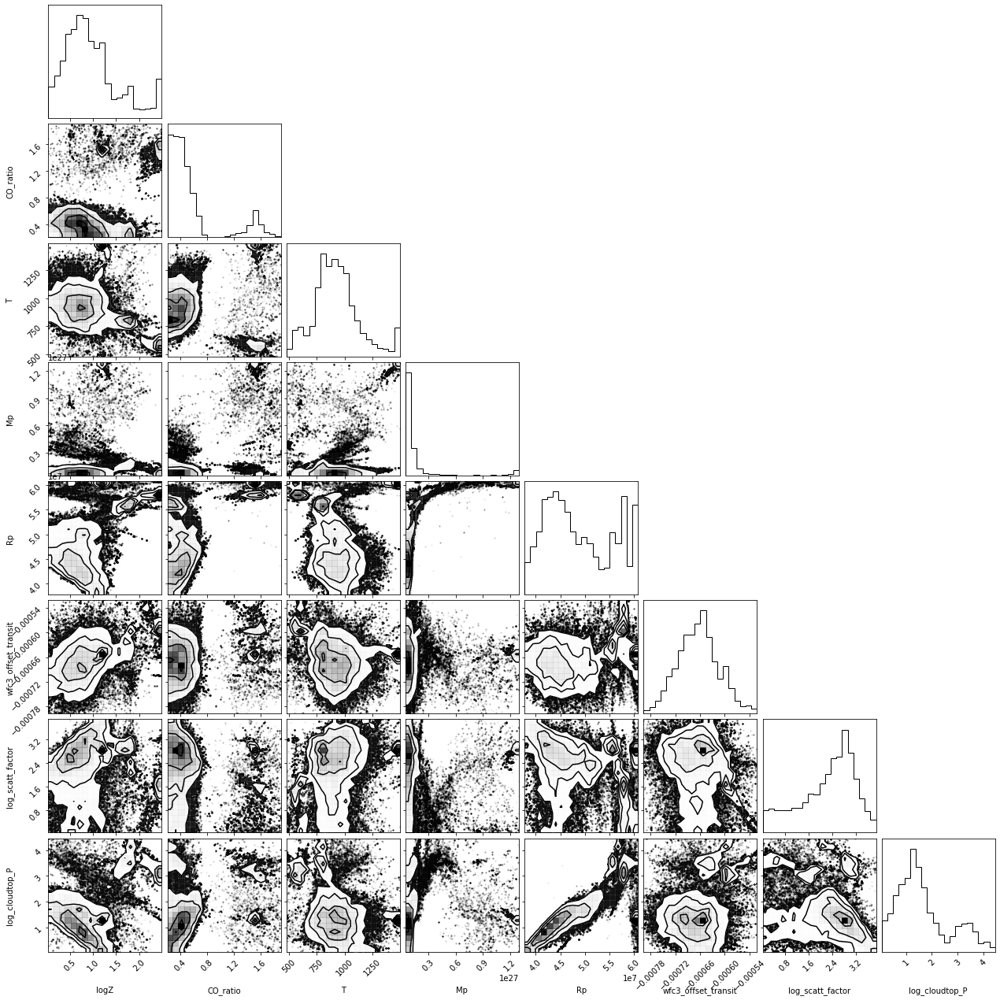

In [7]:
result.plot_corner()

In [2]:
import numpy as np
theta=[np.median(samples[:,0]),np.median(samples[:,1]),np.median(samples[:,2]),np.median(samples[:,3])/M_earth,np.median(samples[:,4])/R_jup,np.median(samples[:,5]),np.median(samples[:,6])]
error=[np.median(samples[:,0]),np.median(samples[:,1]),np.median(samples[:,2]),np.median(samples[:,3])/M_earth,np.median(samples[:,4])/R_jup,np.median(samples[:,5]),np.median(samples[:,6])]
print (theta)
import scipy.stats
import statistics
for i in range (8):
    print("mode = "+str(statistics.mode(samples[:,i])))


NameError: name 'samples' is not defined

In [78]:
from platon.transit_depth_calculator import TransitDepthCalculator
from platon.constants import M_jup, R_jup, R_sun

# All inputs and outputs for PLATON are in SI

Rs = 1.29 * R_sun
Mp = 0.14*M_jup#theta[3]
Rp =  0.8*R_jup#theta[4]
T = 1500#theta[2]
z=-1.0#theta[0]
c_o=0.05#theta[1]

# The initializer loads all data files.  Create a TransitDepthCalculator
# object and hold on to it
calculator = TransitDepthCalculator(method="xsec") #"ktables" for correlated k

# compute_depths is fast once data files are loaded
#wave_sample=np.linspace(1e-6,1.8e-6,1e-8)
#wavebins=np.zeros([len(wave_sample),2])

wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=z, CO_ratio=c_o, full_output=True)
#print (Mp/M_earth)

(1.1, 1.7)

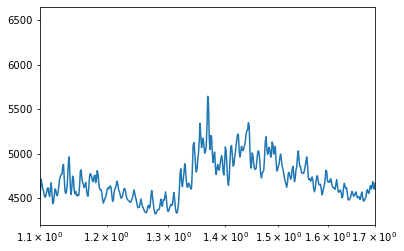

In [79]:
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
plt.semilogx(wavelengths*1e6,gaussian_filter(depths*1e6,1))
plt.xlim(1.1,1.7)
#plt.errorbar(wave,Rad*1e6,Rad_err*1e6,ls='none',marker='.',ms=10)
#plt.ylim(3600,4300)

In [8]:
#print (result)
samples=result.flatchain


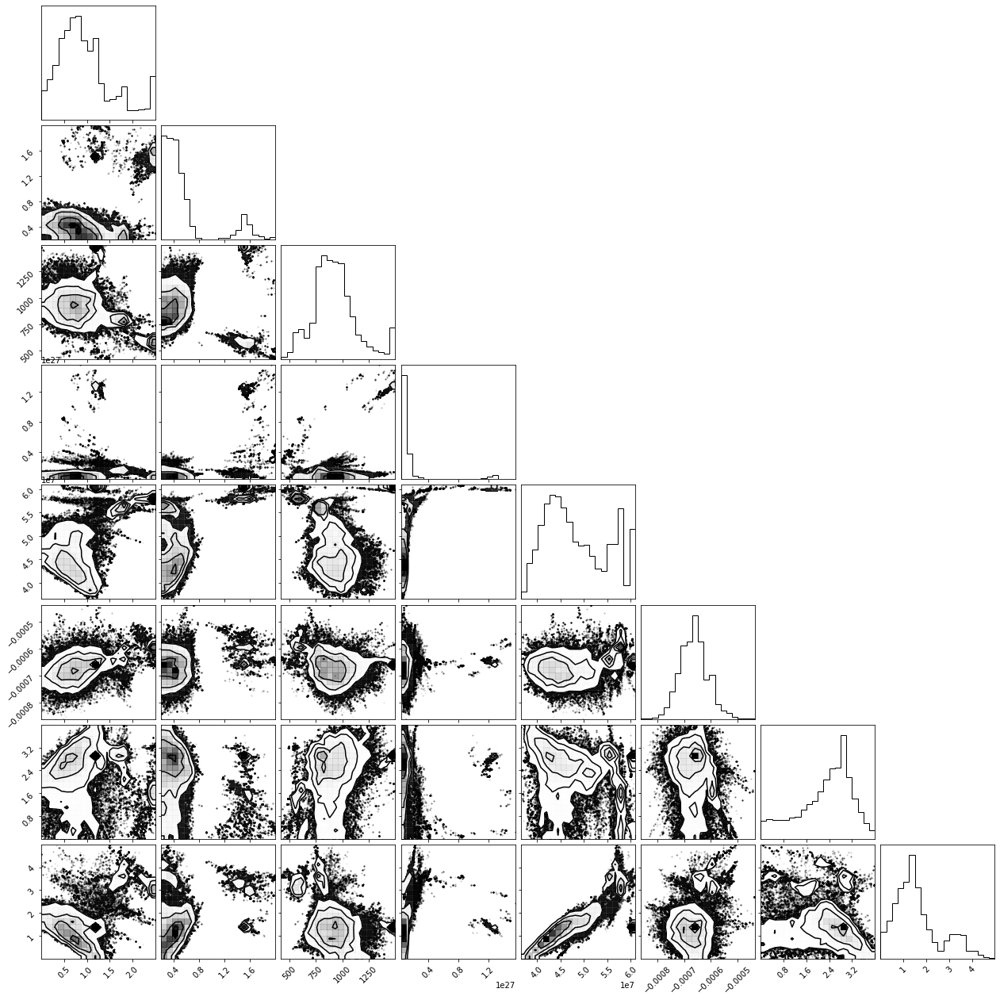

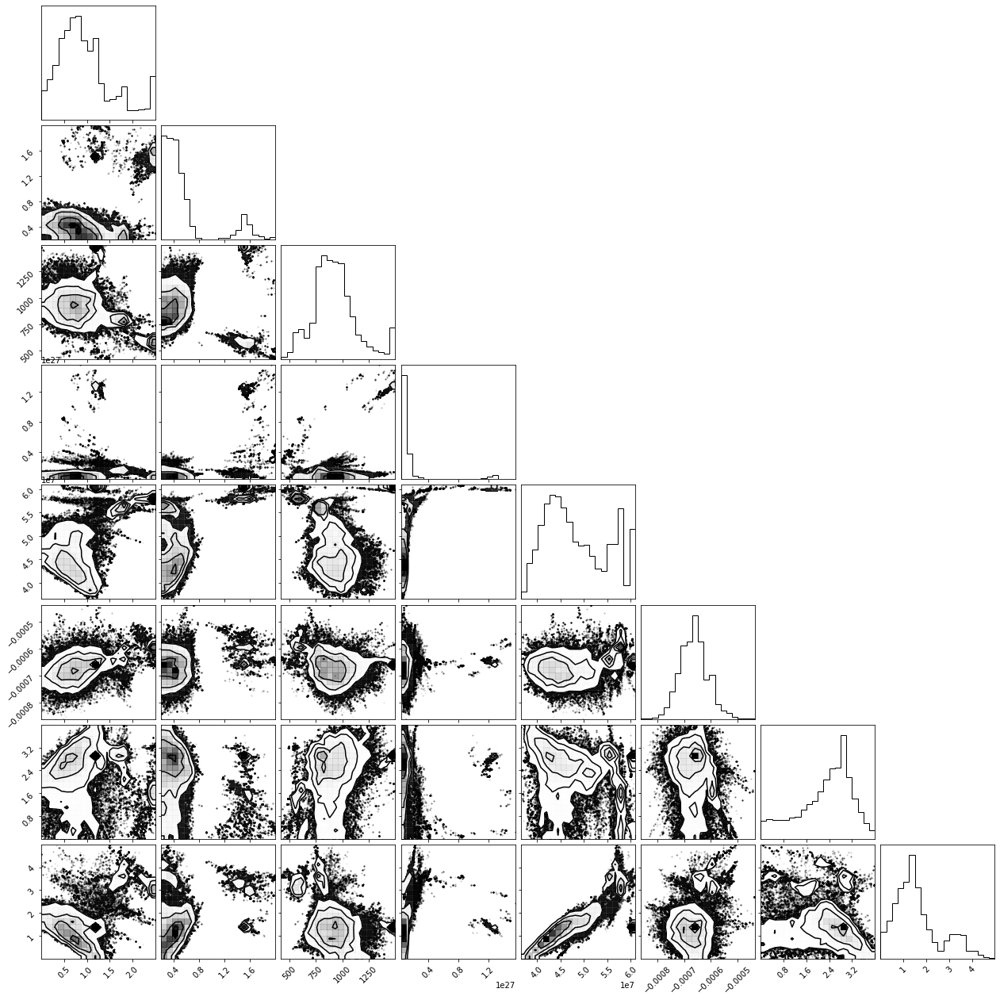

In [10]:
import corner
corner.corner(samples[15000:])

In [88]:
print (len(x),len(x[5000:]))

10000 5000


In [36]:
samples=result.flatchain
samples1=samples[15000:]
for i in range(8):
    q=np.quantile(samples1[:,i],[0.16,0.5,0.84])
    print (q[1],q[0],q[2])
import pickle 
#with open("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_b_platon_retrieval_result.pkl", "wb") as f:
#    pickle.dump(result, f)

0.8367091857134256 0.42586208308034007 1.5531238562537963
0.41434033627605793 0.26758259207462 0.6594097549162177
904.7201058916937 753.1002509622795 1091.6199119986159
8.27118365563566e+25 6.0996057186332225e+25 1.5039682534424332e+26
46776525.098242775 41713698.43426911 56876659.8891054
-0.000662836723616201 -0.0007141611172416405 -0.0006129191625482979
2.470668855252213 1.2285558644338093 3.1043619623859176
1.3751685326020564 0.6770115747504886 2.89917676928575


In [20]:
from platon.constants import M_jup, R_jup, R_sun, M_earth
print (55224208.35264674/R_jup,5617201.13524276/R_jup, 2781395.69655519/R_jup)

0.7724529786919758 0.07857104480561126 0.03890499211877119


In [39]:
q=np.quantile(samples1[:,3],[0.16,0.5,0.84])
print (q[1]/M_earth,(q[0])/M_earth,(q[2])/M_earth)

q=np.quantile(samples1[:,4],[0.16,0.5,0.84])
print (q[1]/R_jup,(q[0])/R_jup,(q[2])/R_jup)

13.849104299867491 10.213057683450467 25.182143297497692
0.6542903415521005 0.5834736534754813 0.7955667751511414


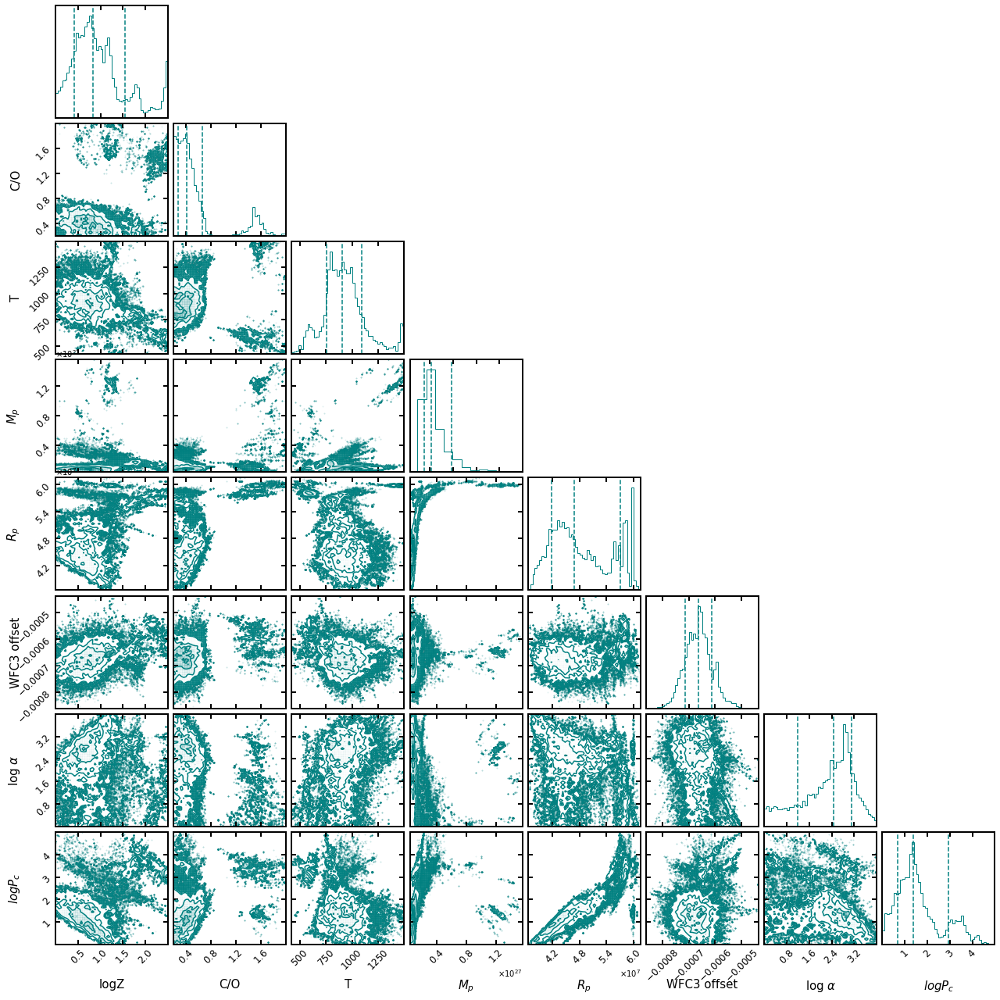

In [30]:
import corner
lab=['logZ','C/O','T',r'$M_{p}$',r'$R_{p}$','WFC3 offset',r'log $\alpha$',r'$logP_{c}$']
figure=corner.corner(samples1,bins=50,use_math_text=True,labels=lab,quantiles=[0.16,0.5,0.84],show_titles=False,title_kwargs={"fontsize": 15},label_kwargs={"fontsize": 15},color='teal')
ndim=8
axes = np.array(figure.axes).reshape((ndim, ndim))
#axes.subplots_adjust(wspace=0.0,hspace=0.0)
#figure.show()
for i in range(ndim):
    for j in range (i+1):
        ax=axes[i,j]
        ax.tick_params(which='major',direction='in',labelsize=12,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(2.0)
axes[3,3].set_xlim(0.1e26,4e26)
plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_corner.pdf',format='pdf')

In [1]:
from platon.abundance_getter import AbundanceGetter
getter = AbundanceGetter()
abundances = getter.get(0.0, 0.53)

ImportError: No module named platon.abundance_getter

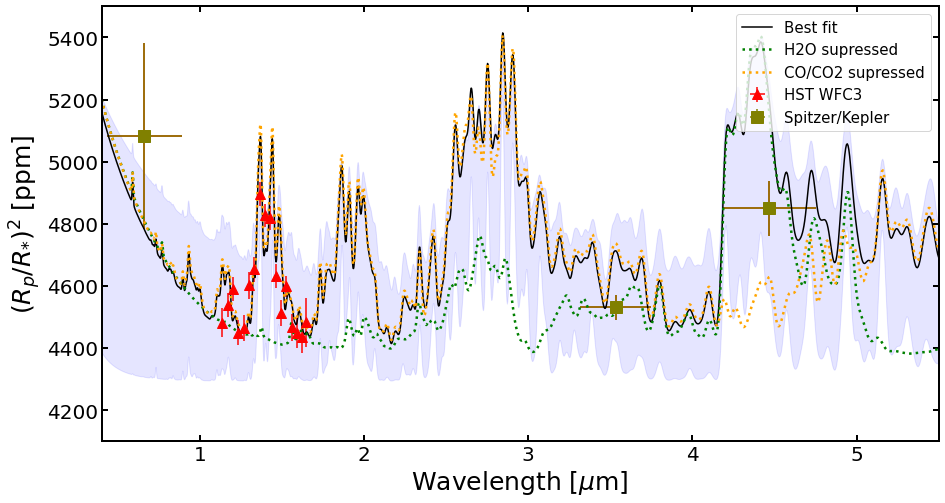

In [123]:
from platon.transit_depth_calculator import TransitDepthCalculator
from platon.constants import M_jup, R_jup, R_sun, M_earth
import matplotlib.pyplot as plt
# All inputs and outputs for PLATON are in SI
import numpy as np
Rs = 1.31 * R_sun
Mp = np.quantile(samples[3000:][:,3],0.5) #* M_earth
Rp = np.quantile(samples[3000:][:,4],0.5)#0.76 * R_jup
T = 915
#z,mp,rp,
# The initializer loads all data files.  Create a TransitDepthCalculator
# object and hold on to it
calculator = TransitDepthCalculator(method="xsec") #"ktables" for correlated k

# compute_depths is fast once data files are loaded
wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=0.814, CO_ratio=0.413,scattering_factor=10**2.24,cloudtop_pressure=10**2.8, full_output=True)
from scipy.ndimage import gaussian_filter
fig,ax=plt.subplots(1,1,figsize=(15,8))
#plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,4),label='logZ=0.0, C/O=0.53')

#wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=-1.0, CO_ratio=0.53, full_output=True)
from scipy.ndimage import gaussian_filter
#fig,ax=plt.subplots(1,1)
plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,5),label='Best fit',color='black',ls='-')


from platon.abundance_getter import AbundanceGetter
getter = AbundanceGetter()
abundances = getter.get(0.814, 0.413)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["H2O"] *= 0
#abundances["NH3"]*=0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,scattering_factor=10**2.24,cloudtop_pressure=10**2.8)
plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,5),label='H2O supressed',ls='dotted',color='green',lw=2.5)

abundances = getter.get(0.814, 0.413)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["CO"] *= 0
abundances["CO2"] *= 0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,scattering_factor=10**2.24,cloudtop_pressure=10**2.8)
plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,5),label='CO/CO2 supressed',ls='dotted',color='orange',lw=2.5)
#abundances["CO"]=*0
ax.set_xlim(0.4,5.5)

wfc3_offset=np.ones_like(wave)
wfc3=682.80
wfc3_offset=wfc3_offset*wfc3
wfc3_offset[0]=0.0
wfc3_offset[-1]=0
wfc3_offset[-2]=0.0
plt.errorbar(wave,(Rad)*1e6+wfc3_offset,yerr=(Rad_err)*1e6,xerr=wave_err,ls='none',marker='^',color='red',ms=10,label='HST WFC3')


Mp = np.quantile(samples[3000:][:,3],0.84) #* M_earth
Rp = np.quantile(samples[3000:][:,4],0.84)#0.76 * R_jup
T = 1060
wavelengths, depths1, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=1.4, CO_ratio=0.62,scattering_factor=10**2.95,cloudtop_pressure=10**3.38, full_output=True)
#plt.semilogx(wavelengths*1e6,gaussian_filter(depths1*1e6,5),ls='--',color='black')

Mp = np.quantile(samples[3000:][:,3],0.16) #* M_earth
Rp = np.quantile(samples[3000:][:,4],0.16)#0.76 * R_jup
T = 780

wavelengths, depths2, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=0.35, CO_ratio=0.25,scattering_factor=10**1.12,cloudtop_pressure=10**1.65, full_output=True)
#plt.semilogx(wavelengths*1e6,gaussian_filter(depths2*1e6,5),ls='--',color='black')
ax.fill_between(wavelengths*1e6,y1=gaussian_filter(depths2*1e6,4),y2=gaussian_filter(depths1*1e6,4),color='blue',alpha=0.1)
ax.set_ylim(4100,5500)
ax.tick_params(which='major',direction='in',labelsize=20,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2.0)
ax.set_ylabel(r'$(R_{p}/R_{*})^{2}$ [ppm]',fontsize=25)
ax.set_xlabel(r'Wavelength [$\mu$m]',fontsize=25)


#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model.pdf',format='pdf')

plt.errorbar(w_spit,(rp_spit**2)*1e6,xerr=w_err_spit,yerr=2*rp_spit*rp_err_spit*1e6,ls='none',marker='s',ms=12,color='olive',label='Spitzer/Kepler')
plt.errorbar(kepler[0],kepler[2]*1e6,xerr=kepler[1],yerr=kepler[3]*1e6,ls='none',marker='s',ms=12,color='olive')
ax.legend(loc='upper right',fontsize=15)

plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model.pdf',format='pdf')

In [96]:
for i in range(3):
    for j in range(i+1):
        print (j,i)

0 0
0 1
1 1
0 2
1 2
2 2


In [5]:
# cloud free retrival

retriever=CombinedRetriever()
R_guess=0.8*R_jup
T_star=4962
fit_info=retriever.get_default_fit_info(Rs=1.31*R_sun,Rp=R_guess,logZ=0.13,CO_ratio=0.53,T=668,Mp=25*M_earth,profile_type='isothermal',wfc3_offset_transit=-0.0001,log_scatt_factor=0.0,log_cloudtop_P=np.inf)
fit_info.add_uniform_fit_param("logZ",0.0,2.5)
fit_info.add_uniform_fit_param("CO_ratio",0.2,2.0)
fit_info.add_uniform_fit_param("T",400,1500)
fit_info.add_uniform_fit_param("Mp",0.001*M_jup,1.0*M_jup)
fit_info.add_uniform_fit_param("Rp",0.5*R_jup,1.5*R_jup)

fit_info.add_uniform_fit_param("wfc3_offset_transit",-0.002,0.0)

fit_info.add_uniform_fit_param("log_scatt_factor",0.0,4.0)

#fit_info.add_uniform_fit_param("log_cloudtop_P",0.0,5.0)




In [6]:
result_cloud_free=retriever.run_emcee(wavebins,Rad,Rad_err,None,None,None,fit_info,nwalkers=20,nsteps=10000,rad_method='ktables',include_condensation=True)

Atmosphere unbound: height > hill radius


/Users/s.baratuva.nl/opt/anaconda3/lib/python3.8/site-packages/emcee-3.0.2-py3.8.egg/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 10: ln_prob=-4.56e+02	logZ=1.23 	CO_ratio=0.82 	T= 944 K	Mp=0.61 M_jup	Rp=0.85 R_jup	wfc3_offset_transit=-953.73 ppm	log_scatt_factor=1.11 	
Atmosphere unbound: height > hill radius
Step 20: ln_prob=2.22e+01	logZ=1.37 	CO_ratio=0.68 	T=1050 K	Mp=0.69 M_jup	Rp=0.89 R_jup	wfc3_offset_transit=-1134.19 ppm	log_scatt_factor=1.22 	
Step 30: ln_prob=8.41e+01	logZ=1.24 	CO_ratio=0.72 	T= 787 K	Mp=0.50 M_jup	Rp=0.85 R_jup	wfc3_offset_transit=-683.81 ppm	log_scatt_factor=1.77 	
Step 40: ln_prob=-3.34e+01	logZ=1.19 	CO_ratio=0.64 	T=1071 K	Mp=0.68 M_jup	Rp=0.87 R_jup	wfc3_offset_transit=-997.25 ppm	log_scatt_factor=1.46 	
Step 50: ln_prob=8.82e+01	logZ=1.18 	CO_ratio=0.70 	T=1073 K	Mp=0.54 M_jup	Rp=0.86 R_jup	wfc3_offset_transit=-863.74 ppm	log_scatt_factor=1.47 	
Step 60: ln_prob=1.04e+02	logZ=1.04 	CO_ratio=0.66 	T= 974 K	Mp=0.44 M_jup	Rp=0.85 R_jup	wfc3_offset_transit=-709.12 ppm	log_scatt_factor=1.41 	
Step

Step 570: ln_prob=1.51e+02	logZ=1.16 	CO_ratio=0.30 	T= 814 K	Mp=0.11 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-642.72 ppm	log_scatt_factor=2.62 	
Step 580: ln_prob=1.34e+02	logZ=0.58 	CO_ratio=0.44 	T= 956 K	Mp=0.10 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-667.70 ppm	log_scatt_factor=2.32 	
Step 590: ln_prob=1.47e+02	logZ=1.30 	CO_ratio=0.40 	T= 929 K	Mp=0.14 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-730.60 ppm	log_scatt_factor=2.34 	
Step 600: ln_prob=1.35e+02	logZ=1.03 	CO_ratio=0.21 	T= 760 K	Mp=0.10 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-669.36 ppm	log_scatt_factor=2.72 	
Step 610: ln_prob=4.84e+01	logZ=0.69 	CO_ratio=0.35 	T= 924 K	Mp=0.17 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-823.16 ppm	log_scatt_factor=2.31 	
Step 620: ln_prob=1.50e+02	logZ=0.23 	CO_ratio=0.53 	T=1092 K	Mp=0.11 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-713.63 ppm	log_scatt_factor=2.25 	
Step 630: ln_prob=1.48e+02	logZ=2.00 	CO_ratio=0.49 	T= 814 K	Mp=0.09 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-639.47 ppm	lo

Step 1120: ln_prob=3.74e+01	logZ=1.12 	CO_ratio=0.41 	T= 889 K	Mp=0.09 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-625.91 ppm	log_scatt_factor=2.58 	
Step 1130: ln_prob=1.46e+02	logZ=1.02 	CO_ratio=0.42 	T=1013 K	Mp=0.12 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-750.73 ppm	log_scatt_factor=2.56 	
Step 1140: ln_prob=1.39e+02	logZ=0.92 	CO_ratio=0.46 	T=1061 K	Mp=0.14 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-775.09 ppm	log_scatt_factor=2.20 	
Step 1150: ln_prob=1.45e+02	logZ=0.99 	CO_ratio=0.55 	T= 938 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-752.04 ppm	log_scatt_factor=2.79 	
Step 1160: ln_prob=1.45e+02	logZ=1.48 	CO_ratio=0.46 	T= 696 K	Mp=0.07 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-537.87 ppm	log_scatt_factor=2.92 	
Step 1170: ln_prob=1.44e+02	logZ=1.18 	CO_ratio=0.49 	T= 897 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-757.62 ppm	log_scatt_factor=2.98 	
Atmosphere unbound: height > hill radius
Step 1180: ln_prob=1.51e+02	logZ=1.05 	CO_ratio=0.55 	T= 937 K	Mp=0.09 M_jup	

Atmosphere unbound: height > hill radius
Step 1620: ln_prob=1.49e+02	logZ=1.23 	CO_ratio=0.22 	T=1055 K	Mp=0.14 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-735.59 ppm	log_scatt_factor=3.08 	
Step 1630: ln_prob=1.14e+02	logZ=0.89 	CO_ratio=0.46 	T=1122 K	Mp=0.12 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-659.67 ppm	log_scatt_factor=2.61 	
Atmosphere unbound: height > hill radius
Step 1640: ln_prob=1.47e+02	logZ=0.10 	CO_ratio=0.29 	T=1039 K	Mp=0.12 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-816.05 ppm	log_scatt_factor=2.47 	
Step 1650: ln_prob=1.51e+02	logZ=0.47 	CO_ratio=0.35 	T= 955 K	Mp=0.11 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-732.70 ppm	log_scatt_factor=2.51 	
Atmosphere unbound: height > hill radius
Step 1660: ln_prob=1.47e+02	logZ=0.97 	CO_ratio=0.71 	T= 994 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-582.56 ppm	log_scatt_factor=2.35 	
Step 1670: ln_prob=1.48e+02	logZ=1.05 	CO_ratio=0.56 	T= 923 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-569.27 ppm	log_scatt_factor=2.

Step 2130: ln_prob=1.50e+02	logZ=0.88 	CO_ratio=0.57 	T= 890 K	Mp=0.08 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-573.44 ppm	log_scatt_factor=2.69 	
Atmosphere unbound: height > hill radius
Step 2140: ln_prob=2.32e+00	logZ=1.40 	CO_ratio=0.62 	T= 681 K	Mp=0.06 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-500.30 ppm	log_scatt_factor=2.11 	
Step 2150: ln_prob=9.43e+01	logZ=0.86 	CO_ratio=0.42 	T= 925 K	Mp=0.10 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-918.07 ppm	log_scatt_factor=3.03 	
Step 2160: ln_prob=1.21e+02	logZ=1.12 	CO_ratio=0.49 	T= 913 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-658.96 ppm	log_scatt_factor=2.81 	
Step 2170: ln_prob=1.51e+02	logZ=0.84 	CO_ratio=0.53 	T= 964 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-772.70 ppm	log_scatt_factor=2.78 	
Step 2180: ln_prob=1.46e+02	logZ=0.28 	CO_ratio=0.46 	T= 942 K	Mp=0.11 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-642.45 ppm	log_scatt_factor=2.31 	
Atmosphere unbound: height > hill radius
Step 2190: ln_prob=1.35e+02	logZ=0.4

Step 2640: ln_prob=9.80e+01	logZ=1.42 	CO_ratio=0.23 	T= 750 K	Mp=0.17 M_jup	Rp=0.83 R_jup	wfc3_offset_transit=-842.40 ppm	log_scatt_factor=2.91 	
Step 2650: ln_prob=1.41e+02	logZ=0.36 	CO_ratio=0.48 	T=1040 K	Mp=0.16 M_jup	Rp=0.82 R_jup	wfc3_offset_transit=-772.21 ppm	log_scatt_factor=2.14 	
Step 2660: ln_prob=1.51e+02	logZ=0.68 	CO_ratio=0.58 	T= 959 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-624.99 ppm	log_scatt_factor=2.32 	
Step 2670: ln_prob=1.16e+02	logZ=1.32 	CO_ratio=0.45 	T= 937 K	Mp=0.15 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-627.28 ppm	log_scatt_factor=2.16 	
Atmosphere unbound: height > hill radius
Step 2680: ln_prob=1.17e+02	logZ=1.05 	CO_ratio=0.45 	T= 945 K	Mp=0.16 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-630.96 ppm	log_scatt_factor=2.11 	
Step 2690: ln_prob=1.48e+02	logZ=0.25 	CO_ratio=0.43 	T= 945 K	Mp=0.09 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-676.09 ppm	log_scatt_factor=2.50 	
Step 2700: ln_prob=1.48e+02	logZ=0.71 	CO_ratio=0.62 	T= 993 K	Mp=0.13 M_jup	

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3170: ln_prob=1.50e+02	logZ=1.51 	CO_ratio=0.61 	T= 977 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-695.20 ppm	log_scatt_factor=2.83 	
Atmosphere unbound: height > hill radius
Step 3180: ln_prob=1.50e+02	logZ=1.14 	CO_ratio=0.30 	T= 888 K	Mp=0.12 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-751.48 ppm	log_scatt_factor=2.75 	
Step 3190: ln_prob=1.44e+02	logZ=1.38 	CO_ratio=0.51 	T= 912 K	Mp=0.10 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-855.45 ppm	log_scatt_factor=3.15 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 3200: ln_prob=1.35e+02	logZ=0.91 	CO_ratio=0.64 	T=1049 K	Mp=0.11 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-660.26 ppm	log_scatt_factor=2.57 	
Atmosphere unbound: height > hill radius
Step 3210: ln_prob=1.46e+02	logZ=1.37 	CO_ratio=0.58 	T= 934 K	Mp=0.11 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-648.64 ppm	log_scatt_factor=2.88 	
Step 3220: ln_prob=

Step 3670: ln_prob=1.51e+02	logZ=1.13 	CO_ratio=0.63 	T= 904 K	Mp=0.09 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-686.72 ppm	log_scatt_factor=2.61 	
Step 3680: ln_prob=1.44e+02	logZ=0.87 	CO_ratio=0.47 	T=1053 K	Mp=0.12 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-760.60 ppm	log_scatt_factor=2.79 	
Step 3690: ln_prob=1.40e+02	logZ=0.33 	CO_ratio=0.66 	T=1256 K	Mp=0.11 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-775.30 ppm	log_scatt_factor=2.36 	
Atmosphere unbound: height > hill radius
Step 3700: ln_prob=1.39e+02	logZ=1.31 	CO_ratio=0.30 	T= 859 K	Mp=0.13 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-639.31 ppm	log_scatt_factor=2.09 	
Step 3710: ln_prob=1.23e+02	logZ=0.09 	CO_ratio=0.58 	T=1376 K	Mp=0.13 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-907.33 ppm	log_scatt_factor=2.29 	
Step 3720: ln_prob=3.83e+01	logZ=1.84 	CO_ratio=0.27 	T= 728 K	Mp=0.12 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-813.52 ppm	log_scatt_factor=3.11 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill ra

Step 4180: ln_prob=9.73e+01	logZ=0.38 	CO_ratio=0.40 	T=1078 K	Mp=0.15 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-700.86 ppm	log_scatt_factor=2.55 	
Atmosphere unbound: height > hill radius
Step 4190: ln_prob=1.51e+02	logZ=0.71 	CO_ratio=0.55 	T= 986 K	Mp=0.11 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-619.48 ppm	log_scatt_factor=2.22 	
Step 4200: ln_prob=1.47e+02	logZ=0.58 	CO_ratio=0.78 	T=1251 K	Mp=0.09 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-524.48 ppm	log_scatt_factor=2.06 	
Atmosphere unbound: height > hill radius
Step 4210: ln_prob=1.50e+02	logZ=0.65 	CO_ratio=0.26 	T= 916 K	Mp=0.13 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-658.93 ppm	log_scatt_factor=2.41 	
Atmosphere unbound: height > hill radius
Step 4220: ln_prob=1.47e+02	logZ=0.74 	CO_ratio=0.61 	T=1038 K	Mp=0.14 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-667.79 ppm	log_scatt_factor=2.50 	
Step 4230: ln_prob=1.46e+02	logZ=1.15 	CO_ratio=0.49 	T= 951 K	Mp=0.12 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-683.77 ppm	log_scatt_factor=2.

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4640: ln_prob=-3.37e+02	logZ=1.60 	CO_ratio=0.31 	T= 506 K	Mp=0.06 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-758.07 ppm	log_scatt_factor=3.38 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 4650: ln_prob=1.50e+02	logZ=1.54 	CO_ratio=0.31 	T= 862 K	Mp=0.11 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-715.39 ppm	log_scatt_factor=2.79 	
Step 4660: ln_prob=1.44e+02	logZ=0.99 	CO_ratio=0.54 	T= 849 K	Mp=0.07 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-648.48 ppm	log_scatt_factor=2.72 	
Step 4670: ln_prob=1.50e+02	logZ=1.14 	CO_ratio=0.22 	T= 869 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-716.49 ppm	log_scatt_factor=2.68 	
Atmosphere unbound: height > hill radius
Step 4680: ln_prob=1.37e+02	logZ=0.86 	CO_ratio=0.76 	T=1042 K	Mp=0.06 M_jup	Rp=0.73 R_jup	wfc3_offset_transit=-425.19 ppm	log_scatt_factor=2.04 	
Step 4690: ln_prob=-1.15e+02	logZ=1.24 	CO_ratio=1.08 	T=11

Atmosphere unbound: height > hill radius
Step 5060: ln_prob=1.21e+02	logZ=0.73 	CO_ratio=0.67 	T= 924 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-755.90 ppm	log_scatt_factor=2.70 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5070: ln_prob=-1.22e+02	logZ=1.06 	CO_ratio=0.58 	T= 652 K	Mp=0.05 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-635.51 ppm	log_scatt_factor=2.82 	
Atmosphere unbound: height > hill radius
Step 5080: ln_prob=1.31e+02	logZ=1.00 	CO_ratio=0.55 	T= 798 K	Mp=0.07 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-709.57 ppm	log_scatt_factor=2.80 	
Atmosphere unbound: height > hill radius
Step 5090: ln_prob=1.51e+02	logZ=1.06 	CO_ratio=0.66 	T= 938 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-613.19 ppm	log_scatt_factor=2.43 	
Step 5100: ln_prob=1.45e+02	logZ=0.88 	CO_ratio=0.49 	T= 994 K	Mp=0.10 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-608.89 ppm	log_scatt_factor=2.38 	
Step 5110: ln_prob=1.51e+02	logZ=1.17 	CO_ratio=0.25 	T= 86

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5510: ln_prob=1.51e+02	logZ=1.30 	CO_ratio=0.50 	T= 933 K	Mp=0.11 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-663.83 ppm	log_scatt_factor=2.82 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5520: ln_prob=6.44e+01	logZ=0.88 	CO_ratio=0.68 	T=1036 K	Mp=0.07 M_jup	Rp=0.74 R_jup	wfc3_offset_transit=-486.82 ppm	log_scatt_factor=2.23 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5530: ln_prob=1.33e+02	logZ=0.75 	CO_ratio=0.43 	T= 897 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-705.50 ppm	log_scatt_factor=2.61 	
Atmosphere unbound: height > hill radius
Step 5540: ln_prob=4.18e+01	logZ=0.58 	CO_ratio=1.09 	T= 940 K	Mp=0

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5890: ln_prob=6.44e+01	logZ=1.81 	CO_ratio=0.34 	T= 795 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-606.93 ppm	log_scatt_factor=3.09 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5900: ln_prob=1.52e+02	logZ=1.03 	CO_ratio=0.65 	T= 968 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-609.68 ppm	log_scatt_factor=2.33 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 5910: ln_prob=1.52e+02	logZ=0.99 	CO_ratio=0.48 	T= 878 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-656.46 ppm	log_scatt_factor=2.39 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6230: ln_prob=1.45e+02	logZ=1.50 	CO_ratio=0.59 	T=1009 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-669.16 ppm	log_scatt_factor=2.98 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6240: ln_prob=5.76e+01	logZ=0.87 	CO_ratio=0.80 	T=1271 K	Mp=0.07 M_jup	Rp=0.72 R_jup	wfc3_offset_transit=-298.51 ppm	log_scatt_factor=2.01 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6250: ln_prob=1.50e+02	logZ=1.39 	CO_ratio=0.65 	T=1080 K	Mp=0.10 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-685.04 ppm	log_scatt_factor=2.87 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6260: ln_prob=1.37e+02	logZ=0.51 	CO_ratio=0.43 	T= 871 K	Mp=0.13 M_jup	Rp=0.81 R_jup	wfc3_offset_trans

Step 6590: ln_prob=1.50e+02	logZ=0.69 	CO_ratio=0.64 	T=1054 K	Mp=0.11 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-650.97 ppm	log_scatt_factor=2.20 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6600: ln_prob=1.30e+02	logZ=0.63 	CO_ratio=0.60 	T=1012 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-614.21 ppm	log_scatt_factor=2.43 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 6610: ln_prob=1.52e+02	logZ=0.82 	CO_ratio=0.61 	T= 944 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-657.97 ppm	log_scatt_factor=2.35 	
Atmosphere unbound: height > hill radius
Step 6620: ln_prob=1.51e+02	logZ=0.27 	CO_ratio=0.74 	T=1218 K	Mp=0.10 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-646.24 ppm	log_scatt_factor=2.10 	
Atmosphere unbound: height > hill radius
Step 6630: ln_prob=1.52e+02	logZ=0.51 	CO_ratio=0.52 	T= 969 K	Mp=0.11 M_jup	Rp=0.79

Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 7030: ln_prob=1.50e+02	logZ=0.20 	CO_ratio=0.86 	T=1339 K	Mp=0.08 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-472.83 ppm	log_scatt_factor=1.71 	
Step 7040: ln_prob=1.49e+02	logZ=1.39 	CO_ratio=0.53 	T= 973 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-777.96 ppm	log_scatt_factor=3.23 	
Atmosphere unbound: height > hill radius
Step 7050: ln_prob=1.51e+02	logZ=1.18 	CO_ratio=0.37 	T= 785 K	Mp=0.07 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-575.37 ppm	log_scatt_factor=2.89 	
Step 7060: ln_prob=-1.54e+02	logZ=0.90 	CO_ratio=0.67 	T=1072 K	Mp=0.07 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-536.02 ppm	log_scatt_factor=2.40 	
Atmosphere unbound: height > hill radius
Step 7070: ln_prob=1.45e+02	logZ=0.47 	CO_ratio=0.82 	T=1243 K	Mp=0.08 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-490.37 ppm	log_scatt_factor=1.90 	
Atmosphere unbound: height > hill radius
Step 7080: ln_prob=1.52e+02	logZ=1.15 	CO_ratio=0.50 	T= 86

Step 7490: ln_prob=9.60e+01	logZ=1.96 	CO_ratio=0.28 	T= 718 K	Mp=0.06 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-631.05 ppm	log_scatt_factor=2.82 	
Step 7500: ln_prob=1.50e+02	logZ=0.98 	CO_ratio=0.37 	T= 869 K	Mp=0.09 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-721.53 ppm	log_scatt_factor=2.74 	
Atmosphere unbound: height > hill radius
Step 7510: ln_prob=7.09e+01	logZ=0.99 	CO_ratio=0.80 	T= 936 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-552.40 ppm	log_scatt_factor=2.27 	
Atmosphere unbound: height > hill radius
Step 7520: ln_prob=1.52e+02	logZ=0.08 	CO_ratio=0.78 	T=1258 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-538.33 ppm	log_scatt_factor=1.78 	
Step 7530: ln_prob=1.52e+02	logZ=0.09 	CO_ratio=0.77 	T=1255 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-549.12 ppm	log_scatt_factor=1.79 	
Step 7540: ln_prob=1.49e+02	logZ=0.84 	CO_ratio=0.51 	T= 987 K	Mp=0.11 M_jup	Rp=0.79 R_jup	wfc3_offset_transit=-775.34 ppm	log_scatt_factor=2.67 	
Step 7550: ln_prob=1.49e+02	logZ=0.2

Step 7950: ln_prob=1.48e+02	logZ=1.37 	CO_ratio=0.59 	T= 816 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-695.66 ppm	log_scatt_factor=2.62 	
Atmosphere unbound: height > hill radius
Step 7960: ln_prob=1.51e+02	logZ=1.13 	CO_ratio=0.45 	T= 843 K	Mp=0.09 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-691.27 ppm	log_scatt_factor=2.68 	
Step 7970: ln_prob=1.48e+02	logZ=0.66 	CO_ratio=0.33 	T= 917 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-653.29 ppm	log_scatt_factor=2.41 	
Step 7980: ln_prob=1.52e+02	logZ=0.78 	CO_ratio=0.48 	T= 933 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-695.73 ppm	log_scatt_factor=2.70 	
Step 7990: ln_prob=1.49e+02	logZ=1.38 	CO_ratio=0.41 	T= 860 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-646.06 ppm	log_scatt_factor=3.02 	
Atmosphere unbound: height > hill radius
Step 8000: ln_prob=1.52e+02	logZ=1.20 	CO_ratio=0.53 	T= 895 K	Mp=0.09 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-726.69 ppm	log_scatt_factor=2.84 	
Step 8010: ln_prob=1.51e+02	logZ=1.2

Step 8440: ln_prob=1.49e+02	logZ=0.55 	CO_ratio=0.45 	T= 987 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-735.78 ppm	log_scatt_factor=2.49 	
Step 8450: ln_prob=1.53e+02	logZ=0.63 	CO_ratio=0.58 	T= 957 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-671.21 ppm	log_scatt_factor=2.36 	
Atmosphere unbound: height > hill radius
Step 8460: ln_prob=1.43e+02	logZ=0.81 	CO_ratio=0.21 	T=1031 K	Mp=0.14 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-756.45 ppm	log_scatt_factor=2.72 	
Step 8470: ln_prob=1.51e+02	logZ=0.54 	CO_ratio=0.51 	T= 964 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-685.67 ppm	log_scatt_factor=2.46 	
Step 8480: ln_prob=1.86e+00	logZ=0.11 	CO_ratio=0.80 	T= 810 K	Mp=0.08 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-410.23 ppm	log_scatt_factor=1.78 	
Step 8490: ln_prob=1.52e+02	logZ=0.58 	CO_ratio=0.59 	T= 969 K	Mp=0.09 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-630.26 ppm	log_scatt_factor=2.36 	
Step 8500: ln_prob=1.50e+02	logZ=0.52 	CO_ratio=0.67 	T=1010 K	Mp=0.10 M_jup	

Atmosphere unbound: height > hill radius
Step 8900: ln_prob=1.52e+02	logZ=0.68 	CO_ratio=0.57 	T= 927 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-652.92 ppm	log_scatt_factor=2.34 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8910: ln_prob=1.50e+02	logZ=1.24 	CO_ratio=0.26 	T=1002 K	Mp=0.12 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-703.37 ppm	log_scatt_factor=3.08 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8920: ln_prob=1.51e+02	logZ=1.00 	CO_ratio=0.43 	T= 846 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-648.12 ppm	log_scatt_factor=2.60 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 8930: ln_prob=2.16e+01	logZ=0.60 	CO_ratio=0.78 	T= 952 K	Mp=0.08 M_jup	Rp=0.75 R_jup	wfc3_offset_transit=-576.42 ppm	log_scatt_factor=2.49 	
Atmosphere unbound: height > hill radius
Step 8940: ln_prob=1.53e+02	logZ=0.96 	CO_r

Step 9290: ln_prob=-1.92e+02	logZ=1.40 	CO_ratio=0.26 	T= 512 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-717.96 ppm	log_scatt_factor=3.30 	
Step 9300: ln_prob=1.39e+02	logZ=1.51 	CO_ratio=0.55 	T= 995 K	Mp=0.15 M_jup	Rp=0.81 R_jup	wfc3_offset_transit=-769.75 ppm	log_scatt_factor=2.43 	
Step 9310: ln_prob=1.36e+02	logZ=0.74 	CO_ratio=0.72 	T=1189 K	Mp=0.10 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-620.67 ppm	log_scatt_factor=2.14 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9320: ln_prob=1.38e+02	logZ=0.61 	CO_ratio=0.49 	T= 910 K	Mp=0.08 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-767.59 ppm	log_scatt_factor=2.92 	
Atmosphere unbound: height > hill radius
Step 9330: ln_prob=1.46e+02	logZ=0.73 	CO_ratio=0.58 	T=1089 K	Mp=0.13 M_jup	Rp=0.80 R_jup	wfc3_offset_transit=-724.89 ppm	log_scatt_factor=2.15 	
Atmosphere unbound: height > hill radius
Step 9340: ln_prob=1.49e+02	logZ=0.84 	CO_ratio=0.48 	T= 921 K	Mp=0.11 M_jup	Rp=0.78 R_jup	wfc3_offs

Step 9800: ln_prob=1.52e+02	logZ=1.71 	CO_ratio=0.34 	T= 767 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-648.75 ppm	log_scatt_factor=2.81 	
Atmosphere unbound: height > hill radius
Atmosphere unbound: height > hill radius
Step 9810: ln_prob=1.44e+02	logZ=1.04 	CO_ratio=0.52 	T= 919 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-599.20 ppm	log_scatt_factor=2.46 	
Step 9820: ln_prob=1.50e+02	logZ=0.44 	CO_ratio=0.68 	T=1099 K	Mp=0.10 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-650.91 ppm	log_scatt_factor=2.17 	
Atmosphere unbound: height > hill radius
Step 9830: ln_prob=-2.06e+02	logZ=1.29 	CO_ratio=0.48 	T= 916 K	Mp=0.08 M_jup	Rp=0.77 R_jup	wfc3_offset_transit=-586.81 ppm	log_scatt_factor=2.62 	
Step 9840: ln_prob=6.07e+01	logZ=0.74 	CO_ratio=0.41 	T= 565 K	Mp=0.06 M_jup	Rp=0.76 R_jup	wfc3_offset_transit=-513.28 ppm	log_scatt_factor=2.40 	
Step 9850: ln_prob=1.40e+02	logZ=1.26 	CO_ratio=0.49 	T= 847 K	Mp=0.08 M_jup	Rp=0.78 R_jup	wfc3_offset_transit=-670.56 ppm	log_scatt_factor=2

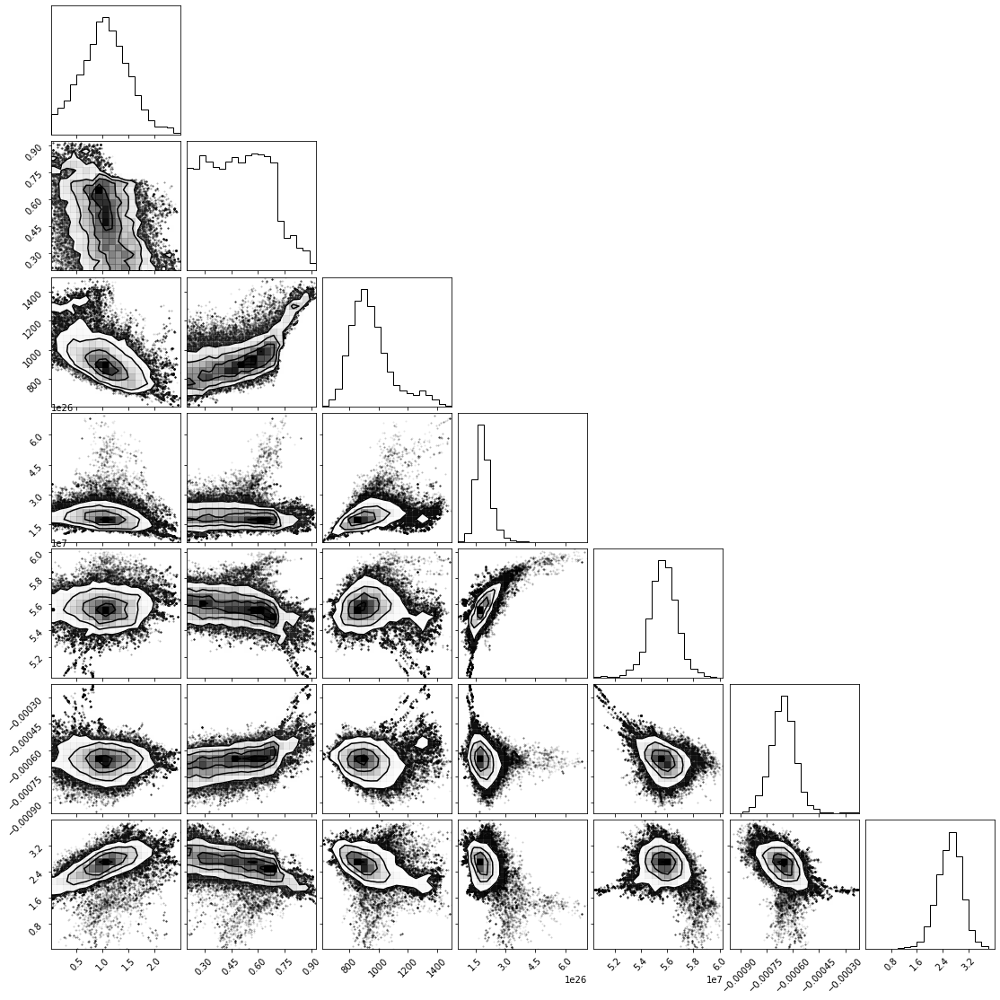

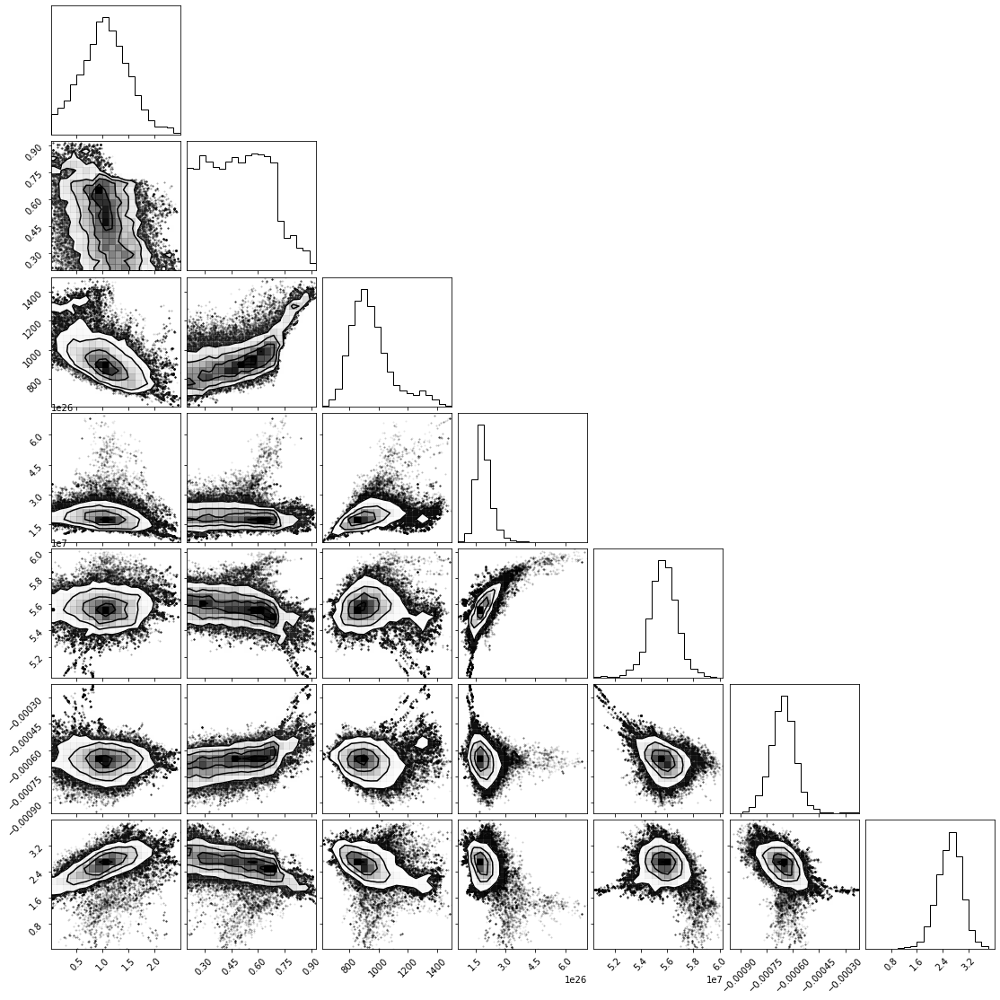

In [12]:
samples=result_cloud_free.flatchain
import corner
corner.corner(samples[2000:])

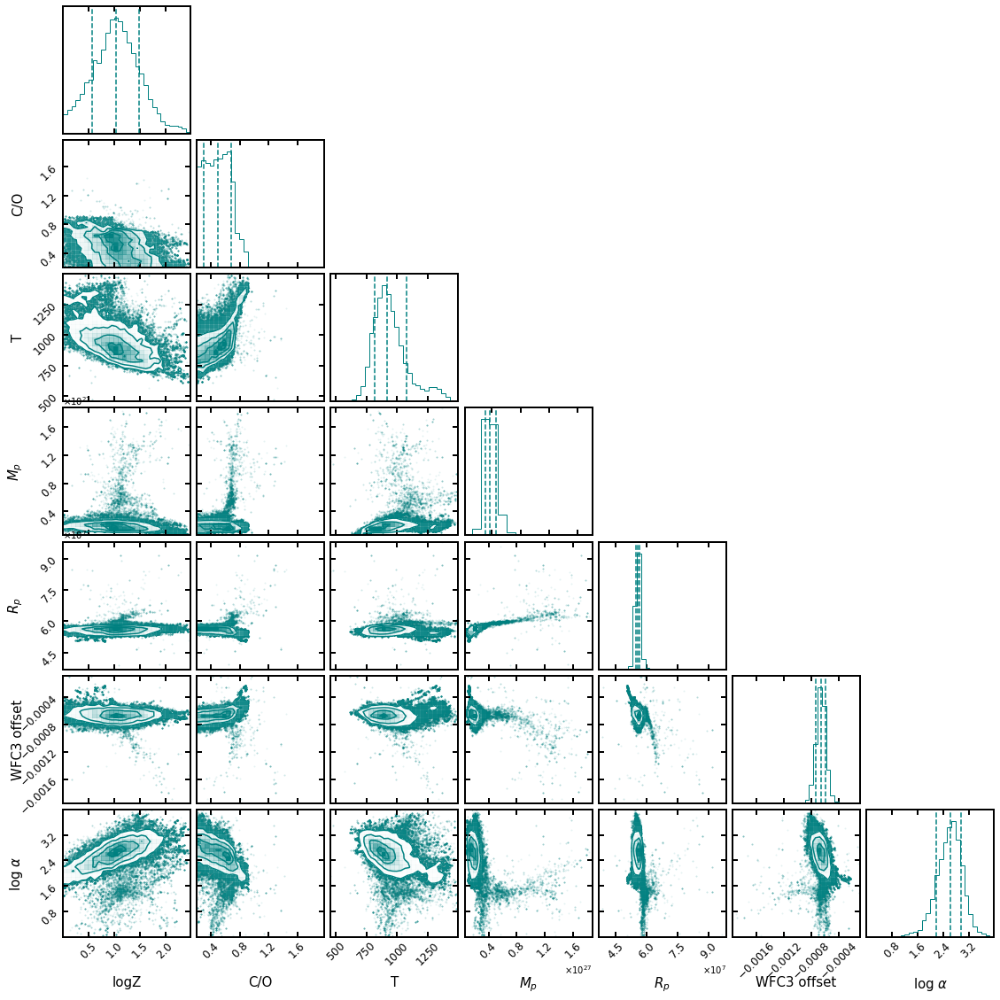

In [22]:
import corner
lab=['logZ','C/O','T',r'$M_{p}$',r'$R_{p}$','WFC3 offset',r'log $\alpha$']
figure=corner.corner(samples,bins=30,use_math_text=True,labels=lab,quantiles=[0.16,0.5,0.84],show_titles=False,title_kwargs={"fontsize": 15},label_kwargs={"fontsize": 15},color='teal')
ndim=7
axes = np.array(figure.axes).reshape((ndim, ndim))
#axes.subplots_adjust(wspace=0.0,hspace=0.0)
#figure.show()
for i in range(ndim):
    for j in range (i+1):
        ax=axes[i,j]
        ax.tick_params(which='major',direction='in',labelsize=12,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(2.0)
axes[3,3].set_xlim(0.1e26,9e26)
plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_corner_cloud_free.pdf',format='pdf')

In [19]:
samples=result_cloud_free.flatchain
samples1=samples[2000:]
for i in range(7):
    q=np.quantile(samples1[:,i],[0.16,0.5,0.84])
    print (q[1],q[0],q[2])
import pickle 
with open("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_b_platon_retrieval_cloud_free_result.pkl", "wb") as f:
    pickle.dump(result_cloud_free, f)

1.0347762803111429 0.5672786526434359 1.4952334068952364
0.48775146338995223 0.2931868021487378 0.6716035168408301
919.5979065623918 814.8729011778555 1070.6252124101434
1.8417090452619654e+26 1.5178107687633783e+26 2.254666693812813e+26
55698357.63517261 54730847.68260498 56674928.38320855
-0.0006558479095306299 -0.0007252642102867025 -0.0005899588494782513
2.622492056600936 2.208759302540787 2.9754127970541817


In [21]:
q=np.quantile(samples1[:,3],[0.16,0.5,0.84])
print (q[1]/M_earth,(q[0])/M_earth,(q[2])/M_earth)

q=np.quantile(samples1[:,4],[0.16,0.5,0.84])
print (q[1]/R_jup,(q[0])/R_jup,(q[2])/R_jup)

30.8372074902043 25.413919602357833 37.751687671419894
0.7790851792532397 0.7655520573295611 0.7927450397696043


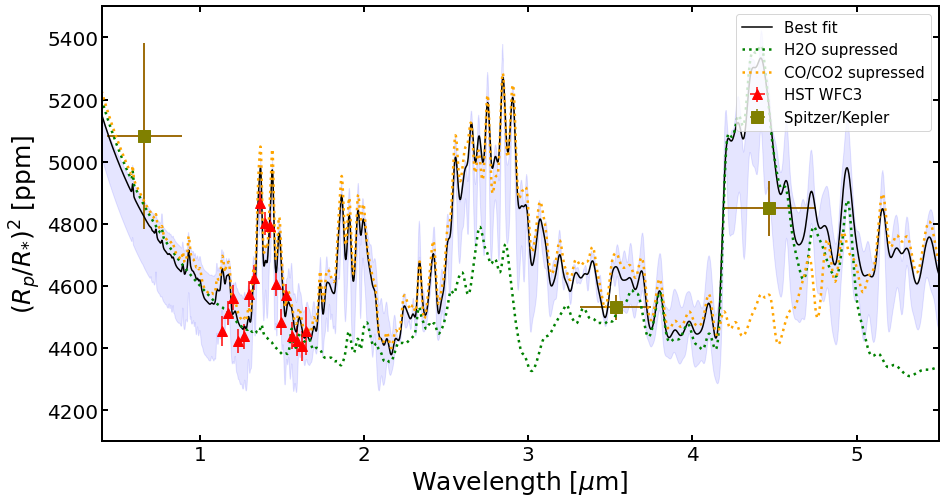

In [31]:
from platon.transit_depth_calculator import TransitDepthCalculator
from platon.constants import M_jup, R_jup, R_sun, M_earth
import matplotlib.pyplot as plt
# All inputs and outputs for PLATON are in SI
import numpy as np
Rs = 1.31 * R_sun
Mp = np.quantile(samples[2000:][:,3],0.5) #* M_earth
Rp = np.quantile(samples[2000:][:,4],0.5)#0.76 * R_jup
T =   np.quantile(samples[2000:][:,2],0.5)
Z= np.quantile(samples[2000:][:,0],0.5)
CO= np.quantile(samples[2000:][:,1],0.5)
alpha= np.quantile(samples[2000:][:,6],0.5)
#z,mp,rp,
# The initializer loads all data files.  Create a TransitDepthCalculator
# object and hold on to it
calculator = TransitDepthCalculator(method="xsec") #"ktables" for correlated k

# compute_depths is fast once data files are loaded
wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=Z, CO_ratio=CO,scattering_factor=10**alpha,cloudtop_pressure=np.inf, full_output=True)
from scipy.ndimage import gaussian_filter
fig,ax=plt.subplots(1,1,figsize=(15,8))
#plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,4),label='logZ=0.0, C/O=0.53')

#wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=-1.0, CO_ratio=0.53, full_output=True)
from scipy.ndimage import gaussian_filter
#fig,ax=plt.subplots(1,1)
plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,5),label='Best fit',color='black',ls='-')


from platon.abundance_getter import AbundanceGetter
getter = AbundanceGetter()
abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["H2O"] *= 0
#abundances["NH3"]*=0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,scattering_factor=10**alpha,cloudtop_pressure=np.inf)
plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,5),label='H2O supressed',ls='dotted',color='green',lw=2.5)

abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["CO"] *= 0
abundances["CO2"] *= 0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,scattering_factor=10**alpha,cloudtop_pressure=np.inf)
plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,5),label='CO/CO2 supressed',ls='dotted',color='orange',lw=2.5)
#abundances["CO"]=*0
ax.set_xlim(0.4,5.5)

wfc3_offset=np.ones_like(wave)
wfc3=655.84
wfc3_offset=wfc3_offset*wfc3
wfc3_offset[0]=0.0
wfc3_offset[-1]=0
wfc3_offset[-2]=0.0
plt.errorbar(wave,(Rad)*1e6+wfc3_offset,yerr=(Rad_err)*1e6,xerr=wave_err,ls='none',marker='^',color='red',ms=10,label='HST WFC3')


Rs = 1.31 * R_sun
Mp = np.quantile(samples[2000:][:,3],0.84) #* M_earth
Rp = np.quantile(samples[2000:][:,4],0.84)#0.76 * R_jup
T =   np.quantile(samples[2000:][:,2],0.84)
Z= np.quantile(samples[2000:][:,0],0.84)
CO= np.quantile(samples[2000:][:,1],0.84)
alpha= np.quantile(samples[2000:][:,6],0.84)
wavelengths, depths1, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=Z, CO_ratio=CO,scattering_factor=10**alpha,cloudtop_pressure=np.inf, full_output=True)
#plt.semilogx(wavelengths*1e6,gaussian_filter(depths1*1e6,5),ls='--',color='black')

Rs = 1.31 * R_sun
Mp = np.quantile(samples[2000:][:,3],0.16) #* M_earth
Rp = np.quantile(samples[2000:][:,4],0.16)#0.76 * R_jup
T =   np.quantile(samples[2000:][:,2],0.16)
Z= np.quantile(samples[2000:][:,0],0.16)
CO= np.quantile(samples[2000:][:,1],0.16)
alpha= np.quantile(samples[2000:][:,6],0.16)
wavelengths, depths2, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=Z, CO_ratio=CO,scattering_factor=10**alpha,cloudtop_pressure=np.inf, full_output=True)
ax.fill_between(wavelengths*1e6,y1=gaussian_filter(depths2*1e6,3),y2=gaussian_filter(depths1*1e6,3),color='blue',alpha=0.1)
ax.set_ylim(4100,5500)
ax.tick_params(which='major',direction='in',labelsize=20,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2.0)
ax.set_ylabel(r'$(R_{p}/R_{*})^{2}$ [ppm]',fontsize=25)
ax.set_xlabel(r'Wavelength [$\mu$m]',fontsize=25)


#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model.pdf',format='pdf')

plt.errorbar(w_spit,(rp_spit**2)*1e6,xerr=w_err_spit,yerr=2*rp_spit*rp_err_spit*1e6,ls='none',marker='s',ms=12,color='olive',label='Spitzer/Kepler')
plt.errorbar(kepler[0],kepler[2]*1e6,xerr=kepler[1],yerr=kepler[3]*1e6,ls='none',marker='s',ms=12,color='olive')
ax.legend(loc='upper right',fontsize=15)

#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model_cloud_free.pdf',format='pdf')

In [1]:
from platon.combined_retriever import CombinedRetriever
from platon.constants import R_sun,R_jup,M_jup,AU,M_earth,R_earth
import numpy as np
import matplotlib.pyplot as plt

In [6]:
import numpy as np
wave,wave_err,Rad,Rad_err=np.loadtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_spectra_emcee_new.txt',skiprows=0,unpack=True)


In [3]:
wavebins=np.zeros([len(wave),2])
#dw=(1.65-1.12)/17
dw=0.013969530897124827
for i in range(len(wave)):
    wavebins[i,0]=(wave[i]-wave_err[i])*1e-6
    wavebins[i,1]=(wave[i]+wave_err[i])*1e-6
print (wavebins,wave,Rad,Rad_err)

[[1.12550243e-06 1.14412834e-06]
 [1.15809818e-06 1.17672516e-06]
 [1.19069577e-06 1.20932373e-06]
 [1.22329504e-06 1.24192389e-06]
 [1.25589584e-06 1.27452549e-06]
 [1.28849801e-06 1.30712839e-06]
 [1.32110142e-06 1.33973242e-06]
 [1.35370589e-06 1.37233744e-06]
 [1.38631129e-06 1.40494330e-06]
 [1.41891745e-06 1.43754983e-06]
 [1.45152423e-06 1.47015690e-06]
 [1.48413148e-06 1.50276434e-06]
 [1.51673903e-06 1.53537200e-06]
 [1.54934675e-06 1.56797974e-06]
 [1.58195447e-06 1.60058740e-06]
 [1.61456205e-06 1.63319482e-06]
 [1.64336596e-06 1.65097269e-06]] [1.13481538 1.16741167 1.20000975 1.23260946 1.26521066 1.2978132
 1.33041692 1.36302167 1.39562729 1.42823364 1.46084057 1.49344791
 1.52605552 1.55866325 1.59127094 1.62387844 1.64716932] [0.00379928 0.00385735 0.00390708 0.00376746 0.00378207 0.00391894
 0.00397141 0.00421263 0.00414561 0.00413582 0.00395006 0.00382897
 0.00391558 0.0037846  0.00376684 0.0037516  0.00379966] [4.70141339e-05 3.88168214e-05 3.93704849e-05 3.86478207e

In [4]:
retriever=CombinedRetriever()
R_guess=0.7529*R_jup
T_star=4962
fit_info=retriever.get_default_fit_info(Rs=1.31*R_sun,Rp=R_guess,logZ=0.16,CO_ratio=0.53,T=768,Mp=40*M_earth,profile_type='isothermal')
fit_info.add_uniform_fit_param("logZ",-1.0,2.0)
fit_info.add_uniform_fit_param("CO_ratio",0.2,1.5)
fit_info.add_uniform_fit_param("T",700,1500)
fit_info.add_uniform_fit_param("Mp",30*M_earth,0.4*M_jup)
#fit_info.add_uniform_fit_param("Rp",0.5*R_jup,1.5*R_jup)

#fit_info.add_uniform_fit_param("wfc3_offset_transit",-0.002,0.0)

#fit_info.add_uniform_fit_param("log_scatt_factor",0.0,4.0)

#fit_info.add_uniform_fit_param("log_cloudtop_P",0.0,5.0)

In [5]:
result=retriever.run_emcee(wavebins,Rad,Rad_err,None,None,None,fit_info,nwalkers=20,nsteps=15000,rad_method='ktables',include_condensation=True)



Step 10: ln_prob=3.09e+01	logZ=0.12 	CO_ratio=1.46 	T= 725 K	Mp=0.14 M_jup	
Step 20: ln_prob=1.01e+02	logZ=1.18 	CO_ratio=0.37 	T=1296 K	Mp=0.25 M_jup	
Step 30: ln_prob=7.17e+01	logZ=0.36 	CO_ratio=1.15 	T= 959 K	Mp=0.14 M_jup	
Step 40: ln_prob=7.31e+01	logZ=0.31 	CO_ratio=0.98 	T=1125 K	Mp=0.14 M_jup	
Step 50: ln_prob=1.20e+02	logZ=0.47 	CO_ratio=0.51 	T= 977 K	Mp=0.14 M_jup	
Step 60: ln_prob=1.20e+02	logZ=0.32 	CO_ratio=0.60 	T=1011 K	Mp=0.13 M_jup	
Step 70: ln_prob=1.19e+02	logZ=0.23 	CO_ratio=0.61 	T=1002 K	Mp=0.13 M_jup	
Step 80: ln_prob=1.14e+02	logZ=0.20 	CO_ratio=0.32 	T= 989 K	Mp=0.13 M_jup	
Step 90: ln_prob=1.21e+02	logZ=0.40 	CO_ratio=0.23 	T= 862 K	Mp=0.13 M_jup	
Step 100: ln_prob=1.21e+02	logZ=0.30 	CO_ratio=0.26 	T= 897 K	Mp=0.13 M_jup	
Step 110: ln_prob=1.19e+02	logZ=0.09 	CO_ratio=0.34 	T= 889 K	Mp=0.12 M_jup	
Step 120: ln_prob=1.07e+02	logZ=0.05 	CO_ratio=0.62 	T= 862 K	Mp=0.11 M_jup	
Step 130: ln_prob=1.21e+02	logZ=0.38 	CO_ratio=0.47 	T= 953 K	Mp=0.13 M_jup	
Step 140

Step 1080: ln_prob=1.13e+02	logZ=0.59 	CO_ratio=0.65 	T=1082 K	Mp=0.15 M_jup	
Step 1090: ln_prob=1.20e+02	logZ=0.33 	CO_ratio=0.32 	T= 995 K	Mp=0.14 M_jup	
Step 1100: ln_prob=1.19e+02	logZ=1.00 	CO_ratio=0.28 	T= 846 K	Mp=0.13 M_jup	
Step 1110: ln_prob=1.21e+02	logZ=0.98 	CO_ratio=0.31 	T= 873 K	Mp=0.14 M_jup	
Step 1120: ln_prob=1.21e+02	logZ=0.78 	CO_ratio=0.31 	T= 880 K	Mp=0.14 M_jup	
Step 1130: ln_prob=1.14e+02	logZ=1.40 	CO_ratio=0.41 	T= 733 K	Mp=0.12 M_jup	
Step 1140: ln_prob=1.20e+02	logZ=0.58 	CO_ratio=0.40 	T= 863 K	Mp=0.13 M_jup	
Step 1150: ln_prob=1.20e+02	logZ=0.79 	CO_ratio=0.38 	T= 965 K	Mp=0.15 M_jup	
Step 1160: ln_prob=1.19e+02	logZ=0.92 	CO_ratio=0.29 	T= 945 K	Mp=0.16 M_jup	
Step 1170: ln_prob=1.19e+02	logZ=0.06 	CO_ratio=0.45 	T=1020 K	Mp=0.13 M_jup	
Step 1180: ln_prob=1.19e+02	logZ=0.62 	CO_ratio=0.44 	T= 892 K	Mp=0.13 M_jup	
Step 1190: ln_prob=1.21e+02	logZ=0.42 	CO_ratio=0.36 	T= 952 K	Mp=0.14 M_jup	
Step 1200: ln_prob=1.20e+02	logZ=1.24 	CO_ratio=0.47 	T= 896 K	M

Step 2130: ln_prob=1.19e+02	logZ=-0.02 	CO_ratio=0.35 	T= 995 K	Mp=0.13 M_jup	
Step 2140: ln_prob=1.21e+02	logZ=0.58 	CO_ratio=0.33 	T= 881 K	Mp=0.13 M_jup	
Step 2150: ln_prob=1.19e+02	logZ=-0.42 	CO_ratio=0.39 	T= 957 K	Mp=0.11 M_jup	
Step 2160: ln_prob=1.21e+02	logZ=0.21 	CO_ratio=0.33 	T= 958 K	Mp=0.13 M_jup	
Step 2170: ln_prob=1.20e+02	logZ=-0.23 	CO_ratio=0.45 	T=1034 K	Mp=0.12 M_jup	
Step 2180: ln_prob=1.21e+02	logZ=1.05 	CO_ratio=0.20 	T= 898 K	Mp=0.15 M_jup	
Step 2190: ln_prob=1.16e+02	logZ=0.52 	CO_ratio=0.40 	T= 976 K	Mp=0.14 M_jup	
Step 2200: ln_prob=1.20e+02	logZ=0.70 	CO_ratio=0.25 	T= 889 K	Mp=0.14 M_jup	
Step 2210: ln_prob=1.20e+02	logZ=0.20 	CO_ratio=0.54 	T=1030 K	Mp=0.13 M_jup	
Step 2220: ln_prob=1.10e+02	logZ=-0.54 	CO_ratio=0.53 	T= 897 K	Mp=0.10 M_jup	
Step 2230: ln_prob=1.19e+02	logZ=-0.04 	CO_ratio=0.26 	T= 920 K	Mp=0.12 M_jup	
Step 2240: ln_prob=1.17e+02	logZ=0.32 	CO_ratio=0.44 	T= 934 K	Mp=0.13 M_jup	
Step 2250: ln_prob=1.17e+02	logZ=0.69 	CO_ratio=0.62 	T= 93

Step 3180: ln_prob=1.20e+02	logZ=-0.04 	CO_ratio=0.41 	T= 973 K	Mp=0.12 M_jup	
Step 3190: ln_prob=7.96e+01	logZ=0.05 	CO_ratio=0.80 	T=1039 K	Mp=0.12 M_jup	
Step 3200: ln_prob=1.21e+02	logZ=0.07 	CO_ratio=0.22 	T= 931 K	Mp=0.12 M_jup	
Step 3210: ln_prob=8.28e+01	logZ=-0.16 	CO_ratio=0.75 	T=1247 K	Mp=0.14 M_jup	
Step 3220: ln_prob=1.19e+02	logZ=-0.12 	CO_ratio=0.46 	T=1031 K	Mp=0.12 M_jup	
Step 3230: ln_prob=1.20e+02	logZ=-0.09 	CO_ratio=0.44 	T= 965 K	Mp=0.12 M_jup	
Step 3240: ln_prob=1.19e+02	logZ=0.01 	CO_ratio=0.64 	T=1062 K	Mp=0.12 M_jup	
Step 3250: ln_prob=1.20e+02	logZ=-0.19 	CO_ratio=0.57 	T=1055 K	Mp=0.12 M_jup	
Step 3260: ln_prob=9.11e+01	logZ=-0.77 	CO_ratio=0.65 	T=1137 K	Mp=0.12 M_jup	
Step 3270: ln_prob=1.20e+02	logZ=-0.06 	CO_ratio=0.58 	T=1064 K	Mp=0.12 M_jup	
Step 3280: ln_prob=6.37e+01	logZ=-0.89 	CO_ratio=0.77 	T=1188 K	Mp=0.12 M_jup	
Step 3290: ln_prob=3.23e+01	logZ=0.77 	CO_ratio=0.43 	T= 950 K	Mp=0.12 M_jup	
Step 3300: ln_prob=1.19e+02	logZ=0.05 	CO_ratio=0.55 	T=

Step 4230: ln_prob=1.15e+02	logZ=0.95 	CO_ratio=0.26 	T=1087 K	Mp=0.18 M_jup	
Step 4240: ln_prob=1.17e+02	logZ=0.76 	CO_ratio=0.39 	T=1066 K	Mp=0.17 M_jup	
Step 4250: ln_prob=1.18e+02	logZ=0.81 	CO_ratio=0.33 	T=1048 K	Mp=0.17 M_jup	
Step 4260: ln_prob=1.21e+02	logZ=0.65 	CO_ratio=0.27 	T= 861 K	Mp=0.13 M_jup	
Step 4270: ln_prob=1.20e+02	logZ=0.68 	CO_ratio=0.39 	T= 991 K	Mp=0.15 M_jup	
Step 4280: ln_prob=1.21e+02	logZ=0.57 	CO_ratio=0.30 	T= 892 K	Mp=0.13 M_jup	
Step 4290: ln_prob=1.20e+02	logZ=0.40 	CO_ratio=0.32 	T= 943 K	Mp=0.14 M_jup	
Step 4300: ln_prob=1.21e+02	logZ=0.21 	CO_ratio=0.35 	T= 974 K	Mp=0.13 M_jup	
Step 4310: ln_prob=1.15e+02	logZ=-0.23 	CO_ratio=0.40 	T= 880 K	Mp=0.11 M_jup	
Step 4320: ln_prob=1.21e+02	logZ=0.35 	CO_ratio=0.38 	T= 911 K	Mp=0.13 M_jup	
Step 4330: ln_prob=1.19e+02	logZ=0.89 	CO_ratio=0.52 	T= 962 K	Mp=0.15 M_jup	
Step 4340: ln_prob=1.19e+02	logZ=1.02 	CO_ratio=0.44 	T= 940 K	Mp=0.15 M_jup	
Step 4350: ln_prob=1.12e+02	logZ=1.33 	CO_ratio=0.54 	T= 894 K	

Step 5280: ln_prob=1.03e+02	logZ=1.36 	CO_ratio=0.26 	T= 880 K	Mp=0.13 M_jup	
Step 5290: ln_prob=1.15e+02	logZ=1.64 	CO_ratio=0.29 	T= 870 K	Mp=0.13 M_jup	
Step 5300: ln_prob=7.47e+01	logZ=1.62 	CO_ratio=0.22 	T= 887 K	Mp=0.12 M_jup	
Step 5310: ln_prob=7.93e+01	logZ=0.88 	CO_ratio=0.75 	T=1165 K	Mp=0.17 M_jup	
Step 5320: ln_prob=1.17e+02	logZ=1.88 	CO_ratio=0.23 	T= 855 K	Mp=0.12 M_jup	
Step 5330: ln_prob=1.18e+02	logZ=-0.22 	CO_ratio=0.53 	T= 983 K	Mp=0.11 M_jup	
Step 5340: ln_prob=1.18e+02	logZ=1.95 	CO_ratio=0.22 	T= 852 K	Mp=0.12 M_jup	
Step 5350: ln_prob=1.18e+02	logZ=-0.77 	CO_ratio=0.56 	T=1058 K	Mp=0.10 M_jup	
Step 5360: ln_prob=1.19e+02	logZ=1.28 	CO_ratio=0.38 	T= 804 K	Mp=0.13 M_jup	
Step 5370: ln_prob=1.10e+02	logZ=-0.24 	CO_ratio=0.43 	T= 934 K	Mp=0.10 M_jup	
Step 5380: ln_prob=1.20e+02	logZ=0.51 	CO_ratio=0.45 	T= 982 K	Mp=0.14 M_jup	
Step 5390: ln_prob=1.19e+02	logZ=-0.13 	CO_ratio=0.32 	T=1075 K	Mp=0.14 M_jup	
Step 5400: ln_prob=1.18e+02	logZ=-0.19 	CO_ratio=0.35 	T=107

Step 6330: ln_prob=1.20e+02	logZ=1.42 	CO_ratio=0.21 	T= 809 K	Mp=0.13 M_jup	
Step 6340: ln_prob=1.18e+02	logZ=0.53 	CO_ratio=0.30 	T= 814 K	Mp=0.12 M_jup	
Step 6350: ln_prob=1.18e+02	logZ=0.83 	CO_ratio=0.65 	T=1020 K	Mp=0.14 M_jup	
Step 6360: ln_prob=1.21e+02	logZ=0.25 	CO_ratio=0.32 	T= 916 K	Mp=0.13 M_jup	
Step 6370: ln_prob=1.20e+02	logZ=0.68 	CO_ratio=0.24 	T= 830 K	Mp=0.13 M_jup	
Step 6380: ln_prob=1.16e+02	logZ=1.60 	CO_ratio=0.27 	T= 877 K	Mp=0.13 M_jup	
Step 6390: ln_prob=1.21e+02	logZ=0.19 	CO_ratio=0.42 	T= 961 K	Mp=0.13 M_jup	
Step 6400: ln_prob=1.20e+02	logZ=0.92 	CO_ratio=0.24 	T= 830 K	Mp=0.13 M_jup	
Step 6410: ln_prob=1.16e+02	logZ=-0.31 	CO_ratio=0.24 	T= 921 K	Mp=0.10 M_jup	
Step 6420: ln_prob=1.03e+02	logZ=1.40 	CO_ratio=0.22 	T= 903 K	Mp=0.14 M_jup	
Step 6430: ln_prob=1.13e+02	logZ=-0.71 	CO_ratio=0.23 	T= 903 K	Mp=0.10 M_jup	
Step 6440: ln_prob=1.20e+02	logZ=0.93 	CO_ratio=0.25 	T= 822 K	Mp=0.13 M_jup	
Step 6450: ln_prob=1.18e+02	logZ=0.49 	CO_ratio=0.24 	T= 798 K

Step 7380: ln_prob=1.20e+02	logZ=0.52 	CO_ratio=0.30 	T= 947 K	Mp=0.14 M_jup	
Step 7390: ln_prob=1.08e+02	logZ=1.19 	CO_ratio=0.50 	T=1257 K	Mp=0.21 M_jup	
Step 7400: ln_prob=1.21e+02	logZ=0.54 	CO_ratio=0.23 	T= 886 K	Mp=0.13 M_jup	
Step 7410: ln_prob=1.16e+02	logZ=-0.45 	CO_ratio=0.28 	T=1075 K	Mp=0.13 M_jup	
Step 7420: ln_prob=1.20e+02	logZ=-0.51 	CO_ratio=0.33 	T=1019 K	Mp=0.11 M_jup	
Step 7430: ln_prob=9.63e+01	logZ=-0.36 	CO_ratio=0.51 	T= 924 K	Mp=0.12 M_jup	
Step 7440: ln_prob=1.21e+02	logZ=0.74 	CO_ratio=0.27 	T= 876 K	Mp=0.13 M_jup	
Step 7450: ln_prob=1.20e+02	logZ=0.34 	CO_ratio=0.36 	T= 916 K	Mp=0.13 M_jup	
Step 7460: ln_prob=1.20e+02	logZ=0.23 	CO_ratio=0.45 	T= 991 K	Mp=0.13 M_jup	
Step 7470: ln_prob=1.19e+02	logZ=0.07 	CO_ratio=0.36 	T= 929 K	Mp=0.13 M_jup	
Step 7480: ln_prob=1.21e+02	logZ=0.55 	CO_ratio=0.23 	T= 941 K	Mp=0.14 M_jup	
Step 7490: ln_prob=1.15e+02	logZ=-0.34 	CO_ratio=0.27 	T= 926 K	Mp=0.11 M_jup	
Step 7500: ln_prob=1.20e+02	logZ=0.02 	CO_ratio=0.33 	T= 934

Step 8430: ln_prob=1.10e+02	logZ=1.44 	CO_ratio=0.54 	T= 889 K	Mp=0.14 M_jup	
Step 8440: ln_prob=1.20e+02	logZ=0.25 	CO_ratio=0.21 	T= 988 K	Mp=0.14 M_jup	
Step 8450: ln_prob=1.21e+02	logZ=0.34 	CO_ratio=0.44 	T= 944 K	Mp=0.13 M_jup	
Step 8460: ln_prob=1.16e+02	logZ=0.68 	CO_ratio=0.29 	T= 783 K	Mp=0.12 M_jup	
Step 8470: ln_prob=1.20e+02	logZ=0.34 	CO_ratio=0.38 	T= 942 K	Mp=0.13 M_jup	
Step 8480: ln_prob=1.05e+02	logZ=-0.93 	CO_ratio=0.37 	T=1234 K	Mp=0.13 M_jup	
Step 8490: ln_prob=1.17e+02	logZ=-0.46 	CO_ratio=0.38 	T= 963 K	Mp=0.11 M_jup	
Step 8500: ln_prob=1.17e+02	logZ=-0.10 	CO_ratio=0.64 	T=1130 K	Mp=0.13 M_jup	
Step 8510: ln_prob=1.18e+02	logZ=0.17 	CO_ratio=0.64 	T=1109 K	Mp=0.14 M_jup	
Step 8520: ln_prob=1.19e+02	logZ=0.23 	CO_ratio=0.55 	T=1058 K	Mp=0.14 M_jup	
Step 8530: ln_prob=1.20e+02	logZ=0.20 	CO_ratio=0.46 	T= 996 K	Mp=0.13 M_jup	
Step 8540: ln_prob=1.20e+02	logZ=0.22 	CO_ratio=0.52 	T=1043 K	Mp=0.14 M_jup	
Step 8550: ln_prob=1.19e+02	logZ=0.56 	CO_ratio=0.30 	T= 837 

Step 9480: ln_prob=1.20e+02	logZ=0.21 	CO_ratio=0.33 	T=1014 K	Mp=0.14 M_jup	
Step 9490: ln_prob=1.20e+02	logZ=-0.28 	CO_ratio=0.32 	T= 972 K	Mp=0.12 M_jup	
Step 9500: ln_prob=1.18e+02	logZ=1.29 	CO_ratio=0.47 	T= 964 K	Mp=0.15 M_jup	
Step 9510: ln_prob=1.14e+02	logZ=1.37 	CO_ratio=0.54 	T= 965 K	Mp=0.16 M_jup	
Step 9520: ln_prob=1.20e+02	logZ=1.33 	CO_ratio=0.38 	T= 894 K	Mp=0.14 M_jup	
Step 9530: ln_prob=1.18e+02	logZ=0.93 	CO_ratio=0.63 	T= 997 K	Mp=0.14 M_jup	
Step 9540: ln_prob=1.18e+02	logZ=-0.09 	CO_ratio=0.54 	T= 937 K	Mp=0.11 M_jup	
Step 9550: ln_prob=1.20e+02	logZ=0.73 	CO_ratio=0.31 	T= 855 K	Mp=0.13 M_jup	
Step 9560: ln_prob=1.21e+02	logZ=0.53 	CO_ratio=0.29 	T= 897 K	Mp=0.13 M_jup	
Step 9570: ln_prob=1.19e+02	logZ=0.86 	CO_ratio=0.49 	T= 948 K	Mp=0.15 M_jup	
Step 9580: ln_prob=1.20e+02	logZ=0.23 	CO_ratio=0.27 	T= 964 K	Mp=0.14 M_jup	
Step 9590: ln_prob=7.07e+01	logZ=1.66 	CO_ratio=0.28 	T= 849 K	Mp=0.16 M_jup	
Step 9600: ln_prob=1.13e+02	logZ=1.28 	CO_ratio=0.30 	T= 769 K

Step 10530: ln_prob=1.20e+02	logZ=-0.01 	CO_ratio=0.28 	T= 925 K	Mp=0.12 M_jup	
Step 10540: ln_prob=1.20e+02	logZ=-0.53 	CO_ratio=0.28 	T= 970 K	Mp=0.11 M_jup	
Step 10550: ln_prob=1.20e+02	logZ=0.61 	CO_ratio=0.36 	T= 935 K	Mp=0.14 M_jup	
Step 10560: ln_prob=1.17e+02	logZ=1.08 	CO_ratio=0.46 	T= 953 K	Mp=0.16 M_jup	
Step 10570: ln_prob=1.20e+02	logZ=0.00 	CO_ratio=0.45 	T= 969 K	Mp=0.12 M_jup	
Step 10580: ln_prob=4.21e+01	logZ=1.81 	CO_ratio=0.56 	T=1063 K	Mp=0.19 M_jup	
Step 10590: ln_prob=1.16e+02	logZ=-0.50 	CO_ratio=0.46 	T= 936 K	Mp=0.10 M_jup	
Step 10600: ln_prob=1.14e+02	logZ=-0.37 	CO_ratio=0.62 	T= 960 K	Mp=0.10 M_jup	
Step 10610: ln_prob=1.19e+02	logZ=-0.51 	CO_ratio=0.38 	T=1039 K	Mp=0.11 M_jup	
Step 10620: ln_prob=1.19e+02	logZ=0.55 	CO_ratio=0.29 	T= 837 K	Mp=0.13 M_jup	
Step 10630: ln_prob=1.20e+02	logZ=0.00 	CO_ratio=0.33 	T= 951 K	Mp=0.12 M_jup	
Step 10640: ln_prob=1.19e+02	logZ=0.93 	CO_ratio=0.33 	T= 829 K	Mp=0.13 M_jup	
Step 10650: ln_prob=1.18e+02	logZ=0.05 	CO_rati

Step 11570: ln_prob=1.19e+02	logZ=0.22 	CO_ratio=0.50 	T= 901 K	Mp=0.12 M_jup	
Step 11580: ln_prob=1.15e+02	logZ=0.16 	CO_ratio=0.56 	T= 880 K	Mp=0.12 M_jup	
Step 11590: ln_prob=1.20e+02	logZ=0.78 	CO_ratio=0.21 	T= 820 K	Mp=0.13 M_jup	
Step 11600: ln_prob=1.21e+02	logZ=-0.08 	CO_ratio=0.42 	T= 999 K	Mp=0.12 M_jup	
Step 11610: ln_prob=1.20e+02	logZ=0.82 	CO_ratio=0.29 	T= 833 K	Mp=0.13 M_jup	
Step 11620: ln_prob=1.20e+02	logZ=-0.11 	CO_ratio=0.40 	T= 971 K	Mp=0.12 M_jup	
Step 11630: ln_prob=1.17e+02	logZ=0.54 	CO_ratio=0.53 	T= 992 K	Mp=0.13 M_jup	
Step 11640: ln_prob=1.21e+02	logZ=0.68 	CO_ratio=0.33 	T= 900 K	Mp=0.13 M_jup	
Step 11650: ln_prob=1.21e+02	logZ=0.41 	CO_ratio=0.37 	T= 914 K	Mp=0.13 M_jup	
Step 11660: ln_prob=1.17e+02	logZ=1.55 	CO_ratio=0.46 	T= 870 K	Mp=0.13 M_jup	
Step 11670: ln_prob=1.21e+02	logZ=0.37 	CO_ratio=0.28 	T= 889 K	Mp=0.13 M_jup	
Step 11680: ln_prob=1.21e+02	logZ=0.30 	CO_ratio=0.36 	T= 934 K	Mp=0.13 M_jup	
Step 11690: ln_prob=1.10e+02	logZ=1.03 	CO_ratio=0

Step 12610: ln_prob=1.17e+02	logZ=0.89 	CO_ratio=0.60 	T=1068 K	Mp=0.16 M_jup	
Step 12620: ln_prob=1.21e+02	logZ=1.01 	CO_ratio=0.24 	T= 845 K	Mp=0.14 M_jup	
Step 12630: ln_prob=1.19e+02	logZ=0.81 	CO_ratio=0.40 	T= 934 K	Mp=0.14 M_jup	
Step 12640: ln_prob=1.17e+02	logZ=1.15 	CO_ratio=0.28 	T= 843 K	Mp=0.13 M_jup	
Step 12650: ln_prob=1.18e+02	logZ=0.50 	CO_ratio=0.60 	T=1052 K	Mp=0.14 M_jup	
Step 12660: ln_prob=1.19e+02	logZ=0.25 	CO_ratio=0.63 	T=1068 K	Mp=0.13 M_jup	
Step 12670: ln_prob=1.14e+02	logZ=0.36 	CO_ratio=0.70 	T=1249 K	Mp=0.16 M_jup	
Step 12680: ln_prob=1.20e+02	logZ=1.30 	CO_ratio=0.44 	T= 890 K	Mp=0.14 M_jup	
Step 12690: ln_prob=1.18e+02	logZ=0.09 	CO_ratio=0.48 	T=1054 K	Mp=0.13 M_jup	
Step 12700: ln_prob=1.09e+02	logZ=0.79 	CO_ratio=0.59 	T=1168 K	Mp=0.17 M_jup	
Step 12710: ln_prob=1.14e+02	logZ=1.08 	CO_ratio=0.44 	T= 950 K	Mp=0.14 M_jup	
Step 12720: ln_prob=6.31e-01	logZ=0.27 	CO_ratio=0.85 	T=1212 K	Mp=0.15 M_jup	
Step 12730: ln_prob=1.12e+02	logZ=0.41 	CO_ratio=0.2

Step 13650: ln_prob=1.16e+02	logZ=0.34 	CO_ratio=0.47 	T= 959 K	Mp=0.12 M_jup	
Step 13660: ln_prob=1.14e+02	logZ=1.79 	CO_ratio=0.22 	T= 910 K	Mp=0.15 M_jup	
Step 13670: ln_prob=1.19e+02	logZ=-0.36 	CO_ratio=0.52 	T= 989 K	Mp=0.11 M_jup	
Step 13680: ln_prob=1.14e+02	logZ=0.36 	CO_ratio=0.37 	T= 946 K	Mp=0.12 M_jup	
Step 13690: ln_prob=1.16e+02	logZ=1.10 	CO_ratio=0.46 	T= 919 K	Mp=0.14 M_jup	
Step 13700: ln_prob=1.20e+02	logZ=0.63 	CO_ratio=0.25 	T= 946 K	Mp=0.14 M_jup	
Step 13710: ln_prob=1.19e+02	logZ=0.83 	CO_ratio=0.22 	T= 908 K	Mp=0.14 M_jup	
Step 13720: ln_prob=1.20e+02	logZ=0.43 	CO_ratio=0.31 	T= 940 K	Mp=0.13 M_jup	
Step 13730: ln_prob=1.20e+02	logZ=0.30 	CO_ratio=0.32 	T= 968 K	Mp=0.13 M_jup	
Step 13740: ln_prob=1.21e+02	logZ=0.36 	CO_ratio=0.33 	T= 930 K	Mp=0.13 M_jup	
Step 13750: ln_prob=1.18e+02	logZ=0.33 	CO_ratio=0.35 	T= 949 K	Mp=0.14 M_jup	
Step 13760: ln_prob=1.21e+02	logZ=0.50 	CO_ratio=0.29 	T= 874 K	Mp=0.13 M_jup	
Step 13770: ln_prob=1.18e+02	logZ=-0.23 	CO_ratio=0

Step 14690: ln_prob=1.21e+02	logZ=0.79 	CO_ratio=0.27 	T= 846 K	Mp=0.13 M_jup	
Step 14700: ln_prob=1.20e+02	logZ=0.23 	CO_ratio=0.42 	T=1024 K	Mp=0.14 M_jup	
Step 14710: ln_prob=1.15e+02	logZ=0.86 	CO_ratio=0.62 	T=1035 K	Mp=0.14 M_jup	
Step 14720: ln_prob=1.19e+02	logZ=0.86 	CO_ratio=0.29 	T=1002 K	Mp=0.16 M_jup	
Step 14730: ln_prob=1.05e+02	logZ=1.45 	CO_ratio=0.22 	T=1104 K	Mp=0.21 M_jup	
Step 14740: ln_prob=1.15e+02	logZ=0.96 	CO_ratio=0.50 	T= 976 K	Mp=0.14 M_jup	
Step 14750: ln_prob=4.57e+00	logZ=0.99 	CO_ratio=0.80 	T=1121 K	Mp=0.17 M_jup	
Step 14760: ln_prob=1.17e+02	logZ=0.98 	CO_ratio=0.56 	T= 948 K	Mp=0.14 M_jup	
Step 14770: ln_prob=1.09e+02	logZ=-0.11 	CO_ratio=0.38 	T=1128 K	Mp=0.13 M_jup	
Step 14780: ln_prob=1.20e+02	logZ=0.07 	CO_ratio=0.47 	T=1015 K	Mp=0.13 M_jup	
Step 14790: ln_prob=1.17e+02	logZ=0.83 	CO_ratio=0.52 	T=1045 K	Mp=0.16 M_jup	
Step 14800: ln_prob=1.19e+02	logZ=1.04 	CO_ratio=0.28 	T= 917 K	Mp=0.15 M_jup	
Step 14810: ln_prob=1.20e+02	logZ=-0.16 	CO_ratio=0

<Figure size 432x288 with 0 Axes>

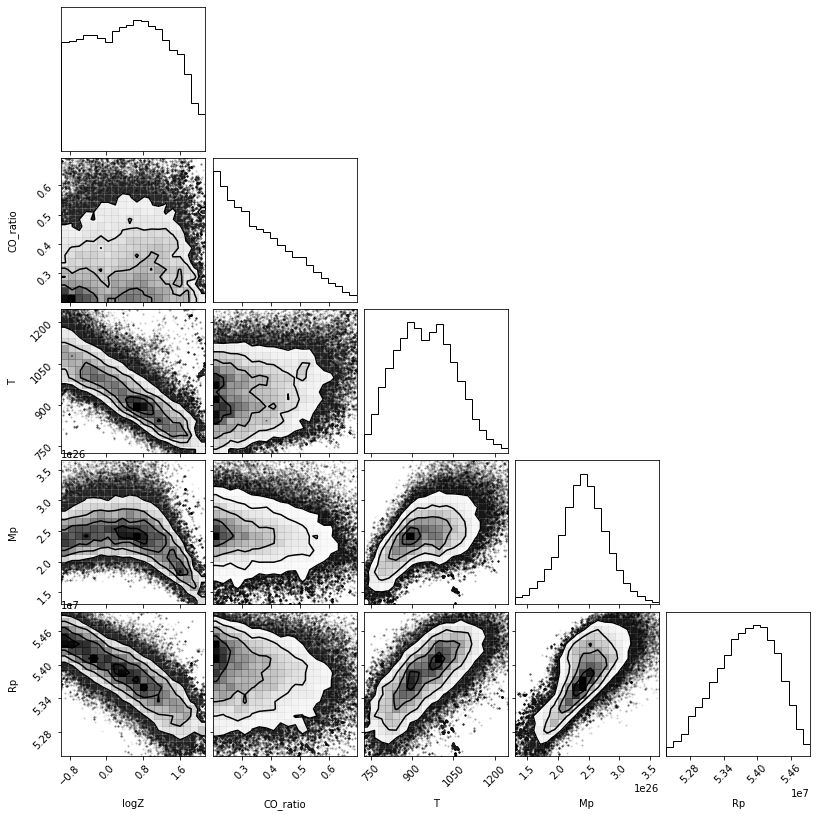

In [49]:
samples=result.flatchain
result.plot_corner()

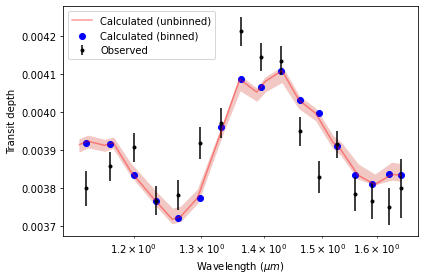

In [36]:
result.plot_spectrum()

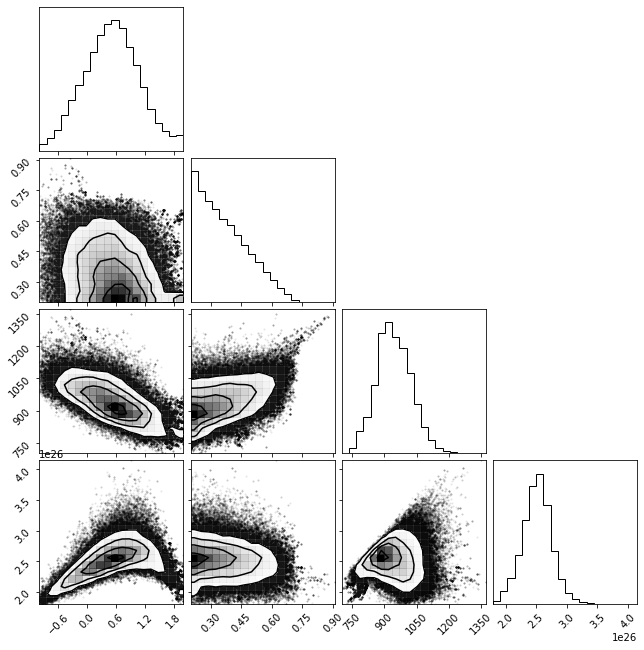

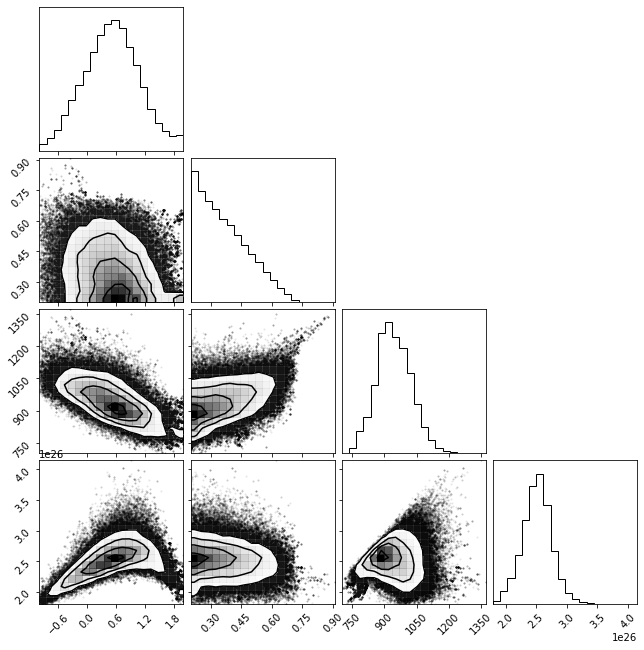

In [8]:
import corner
corner.corner(samples[10000:])

In [9]:
samples=result.flatchain
samples1=samples[5000:]
for i in range(4):
    q=np.quantile(samples1[:,i],[0.16,0.5,0.84])
    print (q[1],q[0],q[2])
import pickle 
#with open("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_b_platon_retrieval_result.pkl", "wb") as f:
#    pickle.dump(result, f)

0.5066466117369067 -0.08637537043831141 1.068580378310214
0.3438260948991133 0.23849586016761867 0.49921837995850354
938.9302184463686 866.9976040233452 1023.7705514216399
2.5160706010755435e+26 2.2784329674458854e+26 2.737264241751998e+26


In [51]:
q=np.quantile(samples1[:,3],[0.16,0.5,0.84])
print (q[1]/M_earth,(q[0])/M_earth,(q[2])/M_earth)

#q=np.quantile(samples1[:,4],[0.16,0.5,0.84])
#print (q[1]/R_jup,(q[0])/R_jup,(q[2])/R_jup)

42.25766063733385 38.45423505196188 45.95953708918988


In [52]:
# prints max and min density from retrieval

samples1=samples[5000:]
vol=4*np.pi*R_earth**3/3.0
print((5.5*10.27**(-3))*min(samples1[:,3])/M_earth,(5.5*10.27**(-3))*max(samples1[:,3]/M_earth))

0.15237396755051777 0.35428687245550244


In [10]:
import pickle 
with open("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_b_platon_retrieval_hst_only_result.pkl", "wb") as f:
    pickle.dump(result, f)

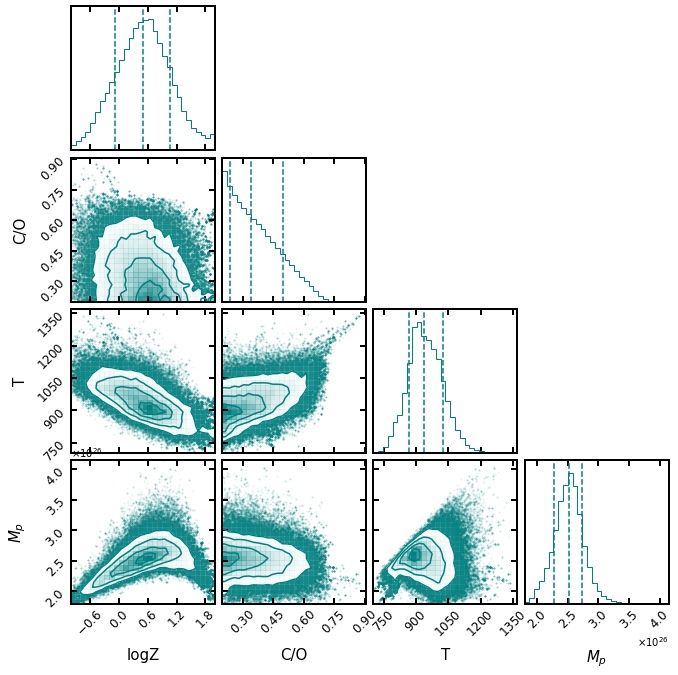

In [12]:
import corner
lab=['logZ','C/O','T',r'$M_{p}$']
figure=corner.corner(samples[5000:],bins=30,use_math_text=True,labels=lab,quantiles=[0.16,0.5,0.84],show_titles=False,title_kwargs={"fontsize": 15},label_kwargs={"fontsize": 15},color='teal')
ndim=4
axes = np.array(figure.axes).reshape((ndim, ndim))
#axes.subplots_adjust(wspace=0.0,hspace=0.0)
#figure.show()
for i in range(ndim):
    for j in range (i+1):
        ax=axes[i,j]
        ax.tick_params(which='major',direction='in',labelsize=12,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(2.0)
#axes[3,3].set_xlim(0.1e26,9e26)
plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_corner_hst_only.pdf',format='pdf')

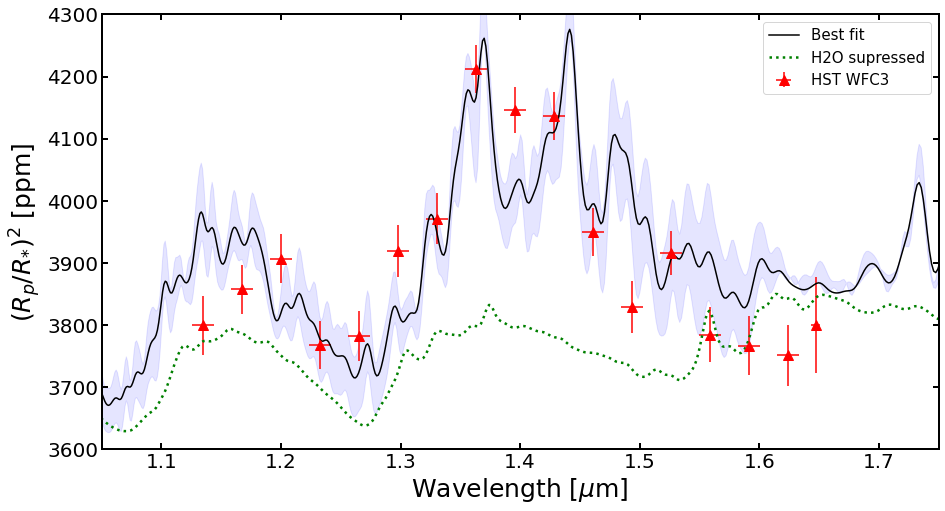

In [35]:
from platon.transit_depth_calculator import TransitDepthCalculator
from platon.constants import M_jup, R_jup, R_sun, M_earth
import matplotlib.pyplot as plt
# All inputs and outputs for PLATON are in SI
import numpy as np
Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.5) #* M_earth
Rp = 0.7529*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.5)
Z= np.quantile(samples[5000:][:,0],0.5)
CO= np.quantile(samples[5000:][:,1],0.5)
#alpha= np.quantile(samples[2000:][:,6],0.5)
#z,mp,rp,
# The initializer loads all data files.  Create a TransitDepthCalculator
# object and hold on to it
calculator = TransitDepthCalculator(method="xsec") #"ktables" for correlated k

# compute_depths is fast once data files are loaded
wavelengths, depths, info_dict_best = calculator.compute_depths(Rs, Mp, Rp, T, logZ=Z, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
from scipy.ndimage import gaussian_filter
fig,ax=plt.subplots(1,1,figsize=(15,8))
#plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,4),label='logZ=0.0, C/O=0.53')

#wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=-1.0, CO_ratio=0.53, full_output=True)
from scipy.ndimage import gaussian_filter
#fig,ax=plt.subplots(1,1)
plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,3),label='Best fit',color='black',ls='-')


from platon.abundance_getter import AbundanceGetter
getter = AbundanceGetter()
abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["H2O"] *= 0
#abundances["NH3"]*=0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,cloudtop_pressure=np.inf)
plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,3),label='H2O supressed',ls='dotted',color='green',lw=2.5)

abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["CO"] *= 0
abundances["CO2"] *= 0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,cloudtop_pressure=np.inf)
#plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,5),label='CH4 supressed',ls='dotted',color='orange',lw=2.5)
#abundances["CO"]=*0
ax.set_xlim(1.05,1.75)

wfc3_offset=np.ones_like(wave)
wfc3=0.0
wfc3_offset=wfc3_offset*wfc3
wfc3_offset[0]=0.0
wfc3_offset[-1]=0
wfc3_offset[-2]=0.0
plt.errorbar(wave,(Rad)*1e6+wfc3_offset,yerr=(Rad_err)*1e6,xerr=wave_err,ls='none',marker='^',color='red',ms=10,label='HST WFC3')


Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.84) #* M_earth
Rp = 0.7529*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.84)
Z= np.quantile(samples[5000:][:,0],0.84)
CO= np.quantile(samples[5000:][:,1],0.84)
#alpha= np.quantile(samples[2000:][:,6],0.84)
wavelengths, depths1, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=Z, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
#plt.semilogx(wavelengths*1e6,gaussian_filter(depths1*1e6,5),ls='--',color='black')

Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.16) #* M_earth
Rp = 0.75298*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.16)
Z= np.quantile(samples[5000:][:,0],0.16)
CO= np.quantile(samples[5000:][:,1],0.16)
#alpha= np.quantile(samples[2000:][:,6],0.16)
wavelengths, depths2, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=Z, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
ax.fill_between(wavelengths*1e6,y1=gaussian_filter(depths2*1e6,2),y2=gaussian_filter(depths1*1e6,2),color='blue',alpha=0.1)
ax.set_ylim(3600,4300)
ax.tick_params(which='major',direction='in',labelsize=20,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2.0)
ax.set_ylabel(r'$(R_{p}/R_{*})^{2}$ [ppm]',fontsize=25)
ax.set_xlabel(r'Wavelength [$\mu$m]',fontsize=25)


#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model.pdf',format='pdf')

#plt.errorbar(w_spit,(rp_spit**2)*1e6,xerr=w_err_spit,yerr=2*rp_spit*rp_err_spit*1e6,ls='none',marker='s',ms=12,color='olive',label='Spitzer/Kepler')
#plt.errorbar(kepler[0],kepler[2]*1e6,xerr=kepler[1],yerr=kepler[3]*1e6,ls='none',marker='s',ms=12,color='olive')
ax.legend(loc='upper right',fontsize=15)

#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model_hst_only.pdf',format='pdf')




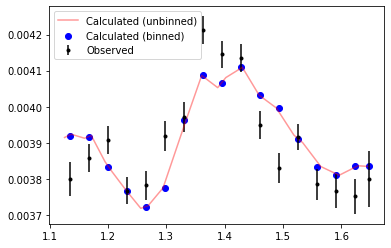

In [25]:
METRES_TO_UM = 1e6
plt.scatter(METRES_TO_UM * result.transit_wavelengths,
            result.best_fit_transit_depths,
            color='b', label="Calculated (binned)")

#Plot the unbinned spectrum
plt.plot(METRES_TO_UM * result.best_fit_transit_dict["unbinned_wavelengths"],
         result.best_fit_transit_dict["unbinned_depths"],
         alpha=0.4, color='r', label="Calculated (unbinned)")

#Plot the observed data points, with error bars
plt.errorbar(METRES_TO_UM * result.transit_wavelengths,
             result.transit_depths,
             yerr = result.transit_errors,
             fmt='.', color='k', label="Observed")

#plt.ylim(0.0238, 0.0245)
plt.legend()

Text(0, 0.5, 'Log10 Pressure(Pa)')

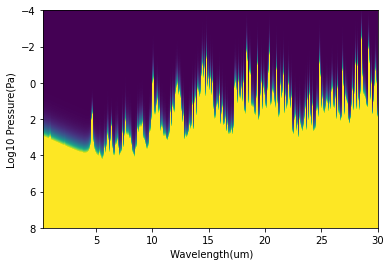

In [33]:
M_TO_UM = 1e6
#log_wavelengths = np.log10(M_TO_UM * info_dict_best["unbinned_wavelengths"])
log_wavelengths = (M_TO_UM * info_dict_best["unbinned_wavelengths"])
log_Ps = np.log10(info_dict_best["P_profile"])

#This plot assumes there are no gaps in the wavelength coverage, which may or may not be true, depending on
#what wavelength bins you specified
plt.imshow(info_dict_best["tau_los"].T, aspect='auto', vmin=0, vmax=1, 
           extent=[min(log_wavelengths), max(log_wavelengths), max(log_Ps), min(log_Ps)])
plt.xlabel(" Wavelength(um)")
plt.ylabel("Log10 Pressure(Pa)")

In [6]:
# fitting with scattering

retriever=CombinedRetriever()
R_guess=0.7529*R_jup
T_star=4962
fit_info=retriever.get_default_fit_info(Rs=1.31*R_sun,Rp=R_guess,logZ=0.13,CO_ratio=0.53,T=768,Mp=40*M_earth,profile_type='isothermal',log_scatt_factor=0.0)
fit_info.add_uniform_fit_param("logZ",-1.0,2.0)
fit_info.add_uniform_fit_param("CO_ratio",0.2,1.5)
fit_info.add_uniform_fit_param("T",700,1500)
fit_info.add_uniform_fit_param("Mp",30*M_earth,0.4*M_jup)

fit_info.add_uniform_fit_param("log_scatt_factor",-1,3)




In [7]:
result=retriever.run_emcee(wavebins,Rad,Rad_err,None,None,None,fit_info,nwalkers=20,nsteps=10000,rad_method='ktables',include_condensation=True)



Step 10: ln_prob=-4.20e+02	logZ=1.39 	CO_ratio=1.23 	T=1178 K	Mp=0.37 M_jup	log_scatt_factor=0.55 	
Step 20: ln_prob=-1.35e+02	logZ=0.59 	CO_ratio=1.36 	T=1203 K	Mp=0.23 M_jup	log_scatt_factor=-0.81 	
Step 30: ln_prob=-5.10e+01	logZ=0.87 	CO_ratio=0.84 	T=1100 K	Mp=0.18 M_jup	log_scatt_factor=0.13 	
Step 40: ln_prob=7.17e+01	logZ=0.46 	CO_ratio=1.19 	T=1082 K	Mp=0.14 M_jup	log_scatt_factor=-0.60 	
Step 50: ln_prob=-1.76e+00	logZ=0.18 	CO_ratio=0.73 	T=1149 K	Mp=0.18 M_jup	log_scatt_factor=0.08 	
Step 60: ln_prob=-4.25e+01	logZ=0.64 	CO_ratio=0.86 	T=1118 K	Mp=0.17 M_jup	log_scatt_factor=-0.12 	
Step 70: ln_prob=1.20e+02	logZ=0.36 	CO_ratio=0.56 	T= 990 K	Mp=0.13 M_jup	log_scatt_factor=-0.16 	
Step 80: ln_prob=1.13e+02	logZ=0.41 	CO_ratio=0.37 	T= 986 K	Mp=0.13 M_jup	log_scatt_factor=-0.23 	
Step 90: ln_prob=1.17e+02	logZ=0.60 	CO_ratio=0.63 	T=1094 K	Mp=0.15 M_jup	log_scatt_factor=0.24 	
Step 100: ln_prob=1.12e+02	logZ=0.21 	CO_ratio=0.52 	T=1107 K	Mp=0.14 M_jup	log_scatt_factor=0.46 	

Step 830: ln_prob=1.24e+02	logZ=-0.52 	CO_ratio=0.27 	T=1038 K	Mp=0.12 M_jup	log_scatt_factor=1.03 	
Step 840: ln_prob=1.23e+02	logZ=-0.62 	CO_ratio=0.59 	T=1208 K	Mp=0.12 M_jup	log_scatt_factor=1.17 	
Step 850: ln_prob=1.23e+02	logZ=0.09 	CO_ratio=0.24 	T=1036 K	Mp=0.15 M_jup	log_scatt_factor=1.56 	
Step 860: ln_prob=1.24e+02	logZ=-0.46 	CO_ratio=0.36 	T=1077 K	Mp=0.12 M_jup	log_scatt_factor=1.38 	
Step 870: ln_prob=1.05e+02	logZ=-0.91 	CO_ratio=0.88 	T=1463 K	Mp=0.13 M_jup	log_scatt_factor=1.38 	
Step 880: ln_prob=1.23e+02	logZ=-0.57 	CO_ratio=0.24 	T= 989 K	Mp=0.12 M_jup	log_scatt_factor=1.59 	
Step 890: ln_prob=1.06e+02	logZ=0.21 	CO_ratio=0.53 	T=1115 K	Mp=0.14 M_jup	log_scatt_factor=1.61 	
Step 900: ln_prob=1.22e+02	logZ=-0.09 	CO_ratio=0.42 	T=1057 K	Mp=0.14 M_jup	log_scatt_factor=1.30 	
Step 910: ln_prob=1.25e+02	logZ=-0.66 	CO_ratio=0.28 	T=1087 K	Mp=0.12 M_jup	log_scatt_factor=1.32 	
Step 920: ln_prob=1.24e+02	logZ=-0.74 	CO_ratio=0.38 	T=1079 K	Mp=0.12 M_jup	log_scatt_factor

Step 1640: ln_prob=1.22e+02	logZ=-0.21 	CO_ratio=0.41 	T=1151 K	Mp=0.14 M_jup	log_scatt_factor=1.30 	
Step 1650: ln_prob=1.20e+02	logZ=0.92 	CO_ratio=0.28 	T= 936 K	Mp=0.15 M_jup	log_scatt_factor=-0.81 	
Step 1660: ln_prob=1.23e+02	logZ=-0.60 	CO_ratio=0.62 	T=1235 K	Mp=0.13 M_jup	log_scatt_factor=1.23 	
Step 1670: ln_prob=9.01e+01	logZ=-0.08 	CO_ratio=0.36 	T=1076 K	Mp=0.12 M_jup	log_scatt_factor=1.40 	
Step 1680: ln_prob=8.89e+01	logZ=-0.90 	CO_ratio=0.91 	T=1450 K	Mp=0.14 M_jup	log_scatt_factor=1.61 	
Step 1690: ln_prob=1.25e+02	logZ=-0.72 	CO_ratio=0.23 	T= 963 K	Mp=0.11 M_jup	log_scatt_factor=1.27 	
Step 1700: ln_prob=1.24e+02	logZ=-0.82 	CO_ratio=0.23 	T= 935 K	Mp=0.10 M_jup	log_scatt_factor=1.27 	
Step 1710: ln_prob=1.21e+02	logZ=-0.91 	CO_ratio=0.75 	T=1243 K	Mp=0.10 M_jup	log_scatt_factor=0.60 	
Step 1720: ln_prob=1.19e+02	logZ=-0.07 	CO_ratio=0.26 	T=1001 K	Mp=0.13 M_jup	log_scatt_factor=0.06 	
Step 1730: ln_prob=1.19e+02	logZ=-0.96 	CO_ratio=0.85 	T=1312 K	Mp=0.10 M_jup	log_

Step 2450: ln_prob=1.23e+02	logZ=-0.20 	CO_ratio=0.40 	T=1078 K	Mp=0.13 M_jup	log_scatt_factor=1.09 	
Step 2460: ln_prob=1.09e+02	logZ=-0.28 	CO_ratio=0.73 	T=1072 K	Mp=0.12 M_jup	log_scatt_factor=0.65 	
Step 2470: ln_prob=1.01e+02	logZ=1.26 	CO_ratio=0.46 	T= 931 K	Mp=0.17 M_jup	log_scatt_factor=1.30 	
Step 2480: ln_prob=1.23e+02	logZ=0.22 	CO_ratio=0.36 	T= 997 K	Mp=0.14 M_jup	log_scatt_factor=1.24 	
Step 2490: ln_prob=1.24e+02	logZ=-0.86 	CO_ratio=0.39 	T=1167 K	Mp=0.12 M_jup	log_scatt_factor=1.10 	
Step 2500: ln_prob=1.25e+02	logZ=-0.54 	CO_ratio=0.31 	T=1028 K	Mp=0.12 M_jup	log_scatt_factor=1.07 	
Step 2510: ln_prob=1.23e+02	logZ=-0.39 	CO_ratio=0.27 	T= 936 K	Mp=0.11 M_jup	log_scatt_factor=1.16 	
Step 2520: ln_prob=1.24e+02	logZ=-0.43 	CO_ratio=0.23 	T= 918 K	Mp=0.11 M_jup	log_scatt_factor=1.08 	
Step 2530: ln_prob=1.02e+02	logZ=-0.99 	CO_ratio=0.45 	T= 955 K	Mp=0.10 M_jup	log_scatt_factor=0.58 	
Step 2540: ln_prob=1.24e+02	logZ=-0.38 	CO_ratio=0.31 	T=1075 K	Mp=0.13 M_jup	log_sc

Step 3260: ln_prob=1.25e+02	logZ=-0.58 	CO_ratio=0.27 	T=1079 K	Mp=0.13 M_jup	log_scatt_factor=1.23 	
Step 3270: ln_prob=1.23e+02	logZ=-0.02 	CO_ratio=0.28 	T=1017 K	Mp=0.14 M_jup	log_scatt_factor=1.39 	
Step 3280: ln_prob=1.26e+02	logZ=-0.77 	CO_ratio=0.21 	T=1084 K	Mp=0.12 M_jup	log_scatt_factor=1.31 	
Step 3290: ln_prob=-3.42e+00	logZ=0.58 	CO_ratio=0.54 	T=1165 K	Mp=0.14 M_jup	log_scatt_factor=1.40 	
Step 3300: ln_prob=1.22e+02	logZ=0.02 	CO_ratio=0.32 	T=1045 K	Mp=0.14 M_jup	log_scatt_factor=1.45 	
Step 3310: ln_prob=1.20e+02	logZ=0.50 	CO_ratio=0.26 	T= 885 K	Mp=0.13 M_jup	log_scatt_factor=0.19 	
Step 3320: ln_prob=1.17e+02	logZ=0.54 	CO_ratio=0.20 	T= 817 K	Mp=0.13 M_jup	log_scatt_factor=0.60 	
Step 3330: ln_prob=1.21e+02	logZ=-0.93 	CO_ratio=0.25 	T= 976 K	Mp=0.11 M_jup	log_scatt_factor=1.07 	
Step 3340: ln_prob=1.23e+02	logZ=-0.24 	CO_ratio=0.44 	T=1048 K	Mp=0.13 M_jup	log_scatt_factor=0.99 	
Step 3350: ln_prob=1.08e+02	logZ=-0.01 	CO_ratio=0.44 	T= 819 K	Mp=0.11 M_jup	log_sca

Step 4070: ln_prob=1.19e+02	logZ=0.04 	CO_ratio=0.26 	T= 937 K	Mp=0.12 M_jup	log_scatt_factor=1.62 	
Step 4080: ln_prob=1.24e+02	logZ=0.05 	CO_ratio=0.21 	T= 982 K	Mp=0.13 M_jup	log_scatt_factor=1.39 	
Step 4090: ln_prob=1.24e+02	logZ=-0.84 	CO_ratio=0.30 	T=1132 K	Mp=0.12 M_jup	log_scatt_factor=1.38 	
Step 4100: ln_prob=1.24e+02	logZ=-0.56 	CO_ratio=0.33 	T=1042 K	Mp=0.12 M_jup	log_scatt_factor=1.34 	
Step 4110: ln_prob=1.15e+02	logZ=-0.25 	CO_ratio=0.46 	T=1187 K	Mp=0.15 M_jup	log_scatt_factor=1.83 	
Step 4120: ln_prob=1.20e+02	logZ=0.00 	CO_ratio=0.25 	T= 974 K	Mp=0.13 M_jup	log_scatt_factor=0.99 	
Step 4130: ln_prob=1.20e+02	logZ=-0.36 	CO_ratio=0.43 	T=1235 K	Mp=0.15 M_jup	log_scatt_factor=1.18 	
Step 4140: ln_prob=1.23e+02	logZ=-0.39 	CO_ratio=0.36 	T=1159 K	Mp=0.14 M_jup	log_scatt_factor=1.28 	
Step 4150: ln_prob=1.14e+02	logZ=-0.64 	CO_ratio=0.51 	T=1392 K	Mp=0.16 M_jup	log_scatt_factor=1.38 	
Step 4160: ln_prob=1.24e+02	logZ=-0.79 	CO_ratio=0.34 	T=1105 K	Mp=0.12 M_jup	log_sca

Step 4880: ln_prob=1.21e+02	logZ=0.36 	CO_ratio=0.21 	T= 889 K	Mp=0.13 M_jup	log_scatt_factor=0.56 	
Step 4890: ln_prob=1.14e+02	logZ=0.72 	CO_ratio=0.22 	T= 879 K	Mp=0.15 M_jup	log_scatt_factor=0.78 	
Step 4900: ln_prob=1.19e+02	logZ=0.07 	CO_ratio=0.23 	T=1033 K	Mp=0.15 M_jup	log_scatt_factor=1.41 	
Step 4910: ln_prob=1.25e+02	logZ=-0.78 	CO_ratio=0.23 	T= 996 K	Mp=0.11 M_jup	log_scatt_factor=0.96 	
Step 4920: ln_prob=1.24e+02	logZ=-0.66 	CO_ratio=0.27 	T=1006 K	Mp=0.11 M_jup	log_scatt_factor=1.02 	
Step 4930: ln_prob=1.00e+02	logZ=0.06 	CO_ratio=0.42 	T=1159 K	Mp=0.14 M_jup	log_scatt_factor=1.67 	
Step 4940: ln_prob=1.25e+02	logZ=-0.72 	CO_ratio=0.25 	T=1057 K	Mp=0.12 M_jup	log_scatt_factor=1.09 	
Step 4950: ln_prob=1.20e+02	logZ=0.40 	CO_ratio=0.37 	T= 976 K	Mp=0.15 M_jup	log_scatt_factor=0.97 	
Step 4960: ln_prob=1.17e+02	logZ=0.47 	CO_ratio=0.33 	T= 975 K	Mp=0.15 M_jup	log_scatt_factor=1.10 	
Step 4970: ln_prob=1.18e+02	logZ=-0.51 	CO_ratio=0.20 	T=1118 K	Mp=0.14 M_jup	log_scatt_

Step 5690: ln_prob=1.24e+02	logZ=-0.70 	CO_ratio=0.31 	T=1142 K	Mp=0.13 M_jup	log_scatt_factor=1.16 	
Step 5700: ln_prob=1.15e+02	logZ=0.12 	CO_ratio=0.69 	T=1020 K	Mp=0.13 M_jup	log_scatt_factor=1.61 	
Step 5710: ln_prob=1.22e+02	logZ=-0.32 	CO_ratio=0.22 	T=1129 K	Mp=0.15 M_jup	log_scatt_factor=1.74 	
Step 5720: ln_prob=1.22e+02	logZ=-0.78 	CO_ratio=0.37 	T=1113 K	Mp=0.11 M_jup	log_scatt_factor=0.72 	
Step 5730: ln_prob=1.25e+02	logZ=-0.85 	CO_ratio=0.35 	T=1124 K	Mp=0.12 M_jup	log_scatt_factor=1.11 	
Step 5740: ln_prob=1.09e+02	logZ=0.75 	CO_ratio=0.69 	T=1180 K	Mp=0.17 M_jup	log_scatt_factor=2.22 	
Step 5750: ln_prob=1.21e+02	logZ=-0.60 	CO_ratio=0.21 	T=1236 K	Mp=0.15 M_jup	log_scatt_factor=1.64 	
Step 5760: ln_prob=9.39e+01	logZ=0.27 	CO_ratio=0.49 	T=1074 K	Mp=0.13 M_jup	log_scatt_factor=1.21 	
Step 5770: ln_prob=1.25e+02	logZ=-0.94 	CO_ratio=0.35 	T=1166 K	Mp=0.12 M_jup	log_scatt_factor=1.14 	
Step 5780: ln_prob=1.24e+02	logZ=-0.49 	CO_ratio=0.28 	T=1069 K	Mp=0.12 M_jup	log_sca

Step 6500: ln_prob=1.24e+02	logZ=-0.50 	CO_ratio=0.21 	T= 965 K	Mp=0.12 M_jup	log_scatt_factor=1.19 	
Step 6510: ln_prob=1.22e+02	logZ=0.35 	CO_ratio=0.51 	T=1011 K	Mp=0.14 M_jup	log_scatt_factor=1.43 	
Step 6520: ln_prob=1.22e+02	logZ=-0.03 	CO_ratio=0.47 	T=1095 K	Mp=0.14 M_jup	log_scatt_factor=1.48 	
Step 6530: ln_prob=1.19e+02	logZ=0.40 	CO_ratio=0.22 	T= 968 K	Mp=0.14 M_jup	log_scatt_factor=1.66 	
Step 6540: ln_prob=1.21e+02	logZ=0.12 	CO_ratio=0.26 	T=1017 K	Mp=0.14 M_jup	log_scatt_factor=1.56 	
Step 6550: ln_prob=1.24e+02	logZ=-0.65 	CO_ratio=0.53 	T=1126 K	Mp=0.12 M_jup	log_scatt_factor=1.00 	
Step 6560: ln_prob=1.23e+02	logZ=-0.62 	CO_ratio=0.45 	T=1051 K	Mp=0.11 M_jup	log_scatt_factor=0.89 	
Step 6570: ln_prob=1.24e+02	logZ=-0.26 	CO_ratio=0.25 	T= 979 K	Mp=0.12 M_jup	log_scatt_factor=1.32 	
Step 6580: ln_prob=1.20e+02	logZ=-0.41 	CO_ratio=0.26 	T=1045 K	Mp=0.12 M_jup	log_scatt_factor=0.90 	
Step 6590: ln_prob=1.24e+02	logZ=0.09 	CO_ratio=0.29 	T= 983 K	Mp=0.13 M_jup	log_scat

Step 7310: ln_prob=1.24e+02	logZ=-0.99 	CO_ratio=0.22 	T= 968 K	Mp=0.09 M_jup	log_scatt_factor=0.72 	
Step 7320: ln_prob=1.20e+02	logZ=-0.57 	CO_ratio=0.34 	T=1079 K	Mp=0.11 M_jup	log_scatt_factor=0.98 	
Step 7330: ln_prob=1.13e+02	logZ=0.25 	CO_ratio=0.38 	T= 975 K	Mp=0.12 M_jup	log_scatt_factor=0.28 	
Step 7340: ln_prob=1.25e+02	logZ=-0.93 	CO_ratio=0.25 	T=1017 K	Mp=0.10 M_jup	log_scatt_factor=0.88 	
Step 7350: ln_prob=5.28e+01	logZ=1.31 	CO_ratio=0.41 	T=1056 K	Mp=0.15 M_jup	log_scatt_factor=2.02 	
Step 7360: ln_prob=1.26e+02	logZ=-0.75 	CO_ratio=0.22 	T=1040 K	Mp=0.11 M_jup	log_scatt_factor=1.06 	
Step 7370: ln_prob=1.23e+02	logZ=-0.28 	CO_ratio=0.41 	T=1114 K	Mp=0.13 M_jup	log_scatt_factor=1.28 	
Step 7380: ln_prob=1.20e+02	logZ=-0.48 	CO_ratio=0.41 	T=1219 K	Mp=0.14 M_jup	log_scatt_factor=1.59 	
Step 7390: ln_prob=1.09e+02	logZ=-0.86 	CO_ratio=0.26 	T=1224 K	Mp=0.13 M_jup	log_scatt_factor=1.71 	
Step 7400: ln_prob=1.25e+02	logZ=-0.42 	CO_ratio=0.28 	T=1013 K	Mp=0.12 M_jup	log_sc

Step 8120: ln_prob=1.25e+02	logZ=-0.89 	CO_ratio=0.22 	T= 986 K	Mp=0.10 M_jup	log_scatt_factor=1.36 	
Step 8130: ln_prob=1.24e+02	logZ=-0.74 	CO_ratio=0.26 	T= 970 K	Mp=0.11 M_jup	log_scatt_factor=1.39 	
Step 8140: ln_prob=1.26e+02	logZ=-0.85 	CO_ratio=0.22 	T=1014 K	Mp=0.11 M_jup	log_scatt_factor=1.22 	
Step 8150: ln_prob=1.23e+02	logZ=-0.51 	CO_ratio=0.37 	T=1080 K	Mp=0.12 M_jup	log_scatt_factor=0.94 	
Step 8160: ln_prob=1.23e+02	logZ=-0.68 	CO_ratio=0.50 	T=1121 K	Mp=0.12 M_jup	log_scatt_factor=0.91 	
Step 8170: ln_prob=1.20e+02	logZ=-0.48 	CO_ratio=0.57 	T=1231 K	Mp=0.14 M_jup	log_scatt_factor=1.00 	
Step 8180: ln_prob=1.25e+02	logZ=-0.55 	CO_ratio=0.28 	T= 981 K	Mp=0.11 M_jup	log_scatt_factor=1.08 	
Step 8190: ln_prob=1.25e+02	logZ=-0.82 	CO_ratio=0.32 	T=1161 K	Mp=0.12 M_jup	log_scatt_factor=1.27 	
Step 8200: ln_prob=1.25e+02	logZ=-0.59 	CO_ratio=0.25 	T= 966 K	Mp=0.11 M_jup	log_scatt_factor=1.22 	
Step 8210: ln_prob=1.25e+02	logZ=-0.69 	CO_ratio=0.25 	T= 984 K	Mp=0.11 M_jup	log_

Step 8930: ln_prob=8.93e+01	logZ=-1.00 	CO_ratio=0.38 	T=1119 K	Mp=0.11 M_jup	log_scatt_factor=1.67 	
Step 8940: ln_prob=1.20e+02	logZ=-0.92 	CO_ratio=0.58 	T=1157 K	Mp=0.12 M_jup	log_scatt_factor=1.36 	
Step 8950: ln_prob=1.24e+02	logZ=-0.94 	CO_ratio=0.44 	T=1165 K	Mp=0.11 M_jup	log_scatt_factor=1.22 	
Step 8960: ln_prob=1.25e+02	logZ=-0.89 	CO_ratio=0.35 	T=1150 K	Mp=0.12 M_jup	log_scatt_factor=1.25 	
Step 8970: ln_prob=1.24e+02	logZ=-0.74 	CO_ratio=0.46 	T=1164 K	Mp=0.12 M_jup	log_scatt_factor=1.11 	
Step 8980: ln_prob=1.23e+02	logZ=-0.91 	CO_ratio=0.36 	T= 977 K	Mp=0.10 M_jup	log_scatt_factor=0.95 	
Step 8990: ln_prob=1.18e+02	logZ=0.76 	CO_ratio=0.23 	T= 853 K	Mp=0.14 M_jup	log_scatt_factor=1.55 	
Step 9000: ln_prob=1.22e+02	logZ=-0.62 	CO_ratio=0.22 	T=1028 K	Mp=0.11 M_jup	log_scatt_factor=1.37 	
Step 9010: ln_prob=1.25e+02	logZ=-0.56 	CO_ratio=0.33 	T=1022 K	Mp=0.12 M_jup	log_scatt_factor=1.15 	
Step 9020: ln_prob=1.22e+02	logZ=0.40 	CO_ratio=0.35 	T= 991 K	Mp=0.15 M_jup	log_sc

Step 9740: ln_prob=1.23e+02	logZ=-0.37 	CO_ratio=0.39 	T=1142 K	Mp=0.14 M_jup	log_scatt_factor=1.37 	
Step 9750: ln_prob=1.20e+02	logZ=0.28 	CO_ratio=0.42 	T= 864 K	Mp=0.12 M_jup	log_scatt_factor=1.55 	
Step 9760: ln_prob=1.24e+02	logZ=-0.69 	CO_ratio=0.35 	T=1103 K	Mp=0.12 M_jup	log_scatt_factor=1.03 	
Step 9770: ln_prob=1.17e+02	logZ=-0.36 	CO_ratio=0.48 	T= 917 K	Mp=0.11 M_jup	log_scatt_factor=1.36 	
Step 9780: ln_prob=1.23e+02	logZ=-0.22 	CO_ratio=0.43 	T= 990 K	Mp=0.12 M_jup	log_scatt_factor=1.32 	
Step 9790: ln_prob=1.22e+02	logZ=0.21 	CO_ratio=0.39 	T= 969 K	Mp=0.14 M_jup	log_scatt_factor=1.32 	
Step 9800: ln_prob=1.24e+02	logZ=-0.71 	CO_ratio=0.31 	T=1153 K	Mp=0.13 M_jup	log_scatt_factor=1.21 	
Step 9810: ln_prob=8.85e+01	logZ=1.01 	CO_ratio=0.69 	T=1246 K	Mp=0.16 M_jup	log_scatt_factor=1.65 	
Step 9820: ln_prob=1.21e+02	logZ=0.72 	CO_ratio=0.33 	T= 907 K	Mp=0.14 M_jup	log_scatt_factor=0.76 	
Step 9830: ln_prob=1.21e+02	logZ=0.79 	CO_ratio=0.33 	T= 894 K	Mp=0.14 M_jup	log_scatt

<Figure size 849.6x849.6 with 0 Axes>

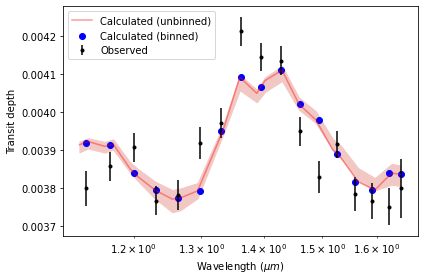

In [10]:
samples=result.flatchain
result.plot_corner()
result.plot_spectrum()

In [12]:
samples=result.flatchain
samples1=samples[5000:]
for i in range(5):
    q=np.quantile(samples1[:,i],[0.16,0.5,0.84])
    print (q[1],q[0],q[2])

-0.5043278180176017 -0.8667735631376882 0.3923938752738547
0.3206335037738576 0.22908829158093424 0.5142032850621314
1045.9549366485764 953.4134259303846 1169.1765038812591
2.3313570221950627e+26 2.0943734522857788e+26 2.663653317161764e+26
1.2058917104054174 0.8989528279248356 1.4896475357219434


<Figure size 432x288 with 0 Axes>

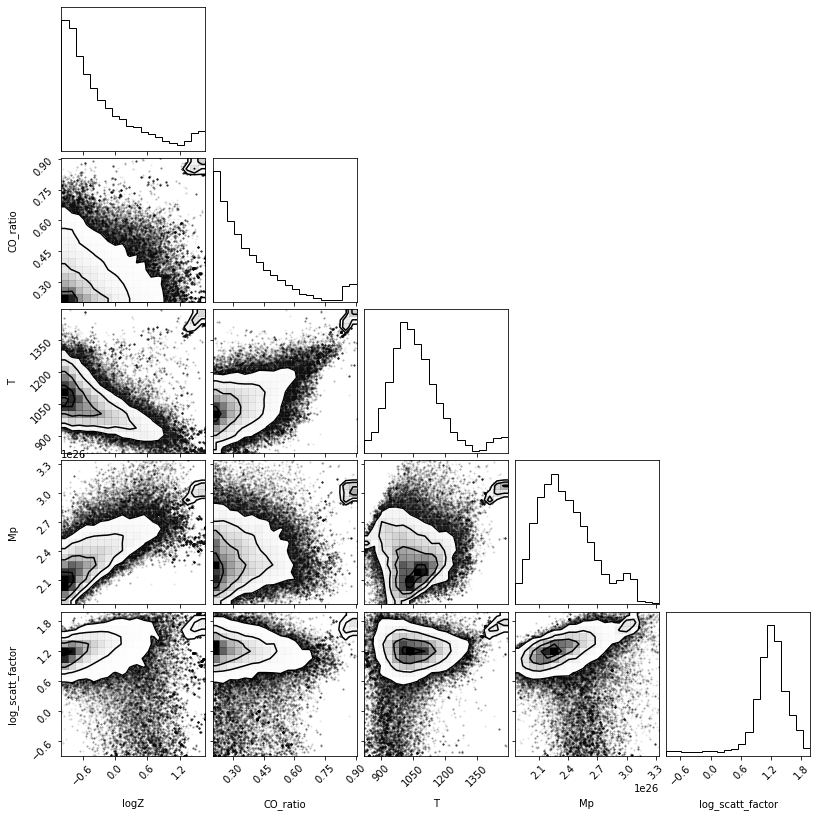

In [13]:
result.plot_corner()

In [20]:
# rstar a free parameter

retriever=CombinedRetriever()
R_guess=0.7529*R_jup
T_star=4962
fit_info=retriever.get_default_fit_info(Rs=1.31*R_sun,Rp=R_guess,logZ=0.16,CO_ratio=0.53,T=768,Mp=40*M_earth,profile_type='isothermal')
fit_info.add_uniform_fit_param("logZ",-1.0,2.5)
fit_info.add_uniform_fit_param("CO_ratio",0.2,1.5)
fit_info.add_uniform_fit_param("T",700,1500)
fit_info.add_uniform_fit_param("Mp",20*M_earth,0.4*M_jup)
#fit_info.add_gaussian_fit_param("Rp",0.1*R_jup)
fit_info.add_uniform_fit_param("Rp",0.5*R_jup,1.5*R_jup)
#fit_info.add_uniform_fit_param("Rs",1.1*R_sun,1.5*R_sun)
#fit_info.add_gaussian_fit_param('Rs', 0.06*R_sun)
#fit_info.add_uniform_fit_param("wfc3_offset_transit",-0.002,0.0)

#fit_info.add_uniform_fit_param("log_scatt_factor",0.0,4.0)

#fit_info.add_uniform_fit_param("log_cloudtop_P",0.0,5.0)

In [21]:
result=retriever.run_emcee(wavebins,Rad,Rad_err,None,None,None,fit_info,nwalkers=20,nsteps=15000,rad_method='ktables',include_condensation=True)

Step 10: ln_prob=-9.37e+03	logZ=1.28 	CO_ratio=0.61 	T=1102 K	Mp=0.27 M_jup	Rp=0.89 R_jup	
Step 20: ln_prob=-9.67e+01	logZ=2.34 	CO_ratio=0.28 	T=1032 K	Mp=0.27 M_jup	Rp=0.76 R_jup	
Step 30: ln_prob=8.69e+01	logZ=2.18 	CO_ratio=0.25 	T=1054 K	Mp=0.28 M_jup	Rp=0.78 R_jup	
Step 40: ln_prob=1.03e+02	logZ=1.14 	CO_ratio=0.35 	T=1086 K	Mp=0.24 M_jup	Rp=0.77 R_jup	
Step 50: ln_prob=1.05e+02	logZ=1.26 	CO_ratio=0.65 	T=1186 K	Mp=0.25 M_jup	Rp=0.77 R_jup	
Step 60: ln_prob=9.43e+01	logZ=-0.02 	CO_ratio=0.44 	T=1166 K	Mp=0.18 M_jup	Rp=0.75 R_jup	
Step 70: ln_prob=1.14e+02	logZ=0.55 	CO_ratio=0.48 	T=1129 K	Mp=0.20 M_jup	Rp=0.76 R_jup	
Step 80: ln_prob=1.13e+02	logZ=0.83 	CO_ratio=0.45 	T=1084 K	Mp=0.22 M_jup	Rp=0.76 R_jup	
Step 90: ln_prob=1.11e+02	logZ=1.07 	CO_ratio=0.35 	T=1067 K	Mp=0.17 M_jup	Rp=0.75 R_jup	
Step 100: ln_prob=1.13e+02	logZ=1.29 	CO_ratio=0.45 	T=1049 K	Mp=0.17 M_jup	Rp=0.75 R_jup	
Step 110: ln_prob=1.19e+02	logZ=0.92 	CO_ratio=0.45 	T= 968 K	Mp=0.15 M_jup	Rp=0.75 R_jup	
Step 

Step 910: ln_prob=1.20e+02	logZ=0.02 	CO_ratio=0.38 	T= 955 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 920: ln_prob=1.17e+02	logZ=0.31 	CO_ratio=0.35 	T= 893 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 930: ln_prob=1.19e+02	logZ=0.97 	CO_ratio=0.43 	T= 851 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 940: ln_prob=1.14e+02	logZ=1.20 	CO_ratio=0.50 	T= 839 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 950: ln_prob=1.04e+02	logZ=0.89 	CO_ratio=0.71 	T= 850 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 960: ln_prob=1.04e+02	logZ=0.92 	CO_ratio=0.62 	T= 779 K	Mp=0.15 M_jup	Rp=0.76 R_jup	
Step 970: ln_prob=9.72e+01	logZ=0.76 	CO_ratio=0.73 	T= 877 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 980: ln_prob=1.21e+02	logZ=0.98 	CO_ratio=0.35 	T= 880 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 990: ln_prob=1.20e+02	logZ=-0.33 	CO_ratio=0.36 	T= 980 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 1000: ln_prob=1.17e+02	logZ=1.39 	CO_ratio=0.48 	T= 865 K	Mp=0.10 M_jup	Rp=0.74 R_jup	
Step 1010: ln_prob=1.19e+02	logZ=0.58 	CO_ratio=0.37 	T= 914 K	Mp=0.12 M_jup	Rp=0.75 R_j

Step 1800: ln_prob=1.21e+02	logZ=-0.46 	CO_ratio=0.34 	T= 995 K	Mp=0.12 M_jup	Rp=0.76 R_jup	
Step 1810: ln_prob=1.15e+02	logZ=-0.65 	CO_ratio=0.37 	T=1031 K	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 1820: ln_prob=9.11e+01	logZ=-0.03 	CO_ratio=0.66 	T= 981 K	Mp=0.08 M_jup	Rp=0.73 R_jup	
Step 1830: ln_prob=1.20e+02	logZ=-0.70 	CO_ratio=0.30 	T=1041 K	Mp=0.12 M_jup	Rp=0.76 R_jup	
Step 1840: ln_prob=1.20e+02	logZ=0.05 	CO_ratio=0.36 	T= 986 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 1850: ln_prob=1.20e+02	logZ=-0.09 	CO_ratio=0.32 	T= 926 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 1860: ln_prob=1.19e+02	logZ=-0.60 	CO_ratio=0.24 	T= 931 K	Mp=0.12 M_jup	Rp=0.76 R_jup	
Step 1870: ln_prob=1.21e+02	logZ=-0.69 	CO_ratio=0.28 	T= 999 K	Mp=0.12 M_jup	Rp=0.76 R_jup	
Step 1880: ln_prob=1.20e+02	logZ=-0.94 	CO_ratio=0.20 	T=1018 K	Mp=0.14 M_jup	Rp=0.77 R_jup	
Step 1890: ln_prob=1.16e+02	logZ=-0.34 	CO_ratio=0.29 	T= 943 K	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 1900: ln_prob=1.19e+02	logZ=-0.66 	CO_ratio=0.25 	T= 958 K	Mp=0.13

Step 2690: ln_prob=1.15e+02	logZ=-0.86 	CO_ratio=0.64 	T=1176 K	Mp=0.14 M_jup	Rp=0.77 R_jup	
Step 2700: ln_prob=1.21e+02	logZ=-0.63 	CO_ratio=0.23 	T=1028 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 2710: ln_prob=1.20e+02	logZ=-0.13 	CO_ratio=0.45 	T=1017 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 2720: ln_prob=1.20e+02	logZ=-0.30 	CO_ratio=0.48 	T=1052 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 2730: ln_prob=1.19e+02	logZ=-0.18 	CO_ratio=0.57 	T=1050 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 2740: ln_prob=1.19e+02	logZ=-0.37 	CO_ratio=0.60 	T=1091 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 2750: ln_prob=1.16e+02	logZ=-0.93 	CO_ratio=0.65 	T=1193 K	Mp=0.14 M_jup	Rp=0.77 R_jup	
Step 2760: ln_prob=1.18e+02	logZ=1.34 	CO_ratio=0.34 	T= 762 K	Mp=0.10 M_jup	Rp=0.74 R_jup	
Step 2770: ln_prob=1.20e+02	logZ=0.01 	CO_ratio=0.32 	T= 924 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 2780: ln_prob=1.19e+02	logZ=-0.83 	CO_ratio=0.31 	T=1022 K	Mp=0.12 M_jup	Rp=0.76 R_jup	
Step 2790: ln_prob=1.20e+02	logZ=1.07 	CO_ratio=0.58 	T= 866 K	Mp=0.11 M

Step 3580: ln_prob=1.19e+02	logZ=0.45 	CO_ratio=0.38 	T=1047 K	Mp=0.15 M_jup	Rp=0.75 R_jup	
Step 3590: ln_prob=1.21e+02	logZ=0.90 	CO_ratio=0.33 	T= 880 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 3600: ln_prob=1.06e+02	logZ=1.87 	CO_ratio=0.48 	T= 867 K	Mp=0.07 M_jup	Rp=0.73 R_jup	
Step 3610: ln_prob=1.18e+02	logZ=0.38 	CO_ratio=0.37 	T=1051 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 3620: ln_prob=1.17e+02	logZ=0.66 	CO_ratio=0.39 	T=1064 K	Mp=0.15 M_jup	Rp=0.75 R_jup	
Step 3630: ln_prob=1.17e+02	logZ=0.58 	CO_ratio=0.40 	T=1026 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 3640: ln_prob=1.20e+02	logZ=0.73 	CO_ratio=0.27 	T= 953 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 3650: ln_prob=1.20e+02	logZ=0.80 	CO_ratio=0.45 	T= 964 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 3660: ln_prob=1.15e+02	logZ=0.22 	CO_ratio=0.48 	T=1010 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 3670: ln_prob=1.20e+02	logZ=0.72 	CO_ratio=0.27 	T= 920 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 3680: ln_prob=1.21e+02	logZ=0.48 	CO_ratio=0.27 	T= 948 K	Mp=0.13 M_jup	Rp=

Step 4470: ln_prob=1.21e+02	logZ=-0.50 	CO_ratio=0.25 	T=1023 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 4480: ln_prob=1.09e+02	logZ=0.94 	CO_ratio=0.33 	T= 846 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 4490: ln_prob=1.15e+02	logZ=-0.32 	CO_ratio=0.27 	T=1048 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 4500: ln_prob=4.83e+01	logZ=1.91 	CO_ratio=0.42 	T= 755 K	Mp=0.08 M_jup	Rp=0.73 R_jup	
Step 4510: ln_prob=1.15e+02	logZ=0.91 	CO_ratio=0.37 	T= 820 K	Mp=0.10 M_jup	Rp=0.74 R_jup	
Step 4520: ln_prob=1.20e+02	logZ=1.08 	CO_ratio=0.32 	T= 826 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 4530: ln_prob=1.20e+02	logZ=-0.51 	CO_ratio=0.27 	T=1081 K	Mp=0.14 M_jup	Rp=0.76 R_jup	
Step 4540: ln_prob=4.42e+01	logZ=1.73 	CO_ratio=0.20 	T= 856 K	Mp=0.13 M_jup	Rp=0.74 R_jup	
Step 4550: ln_prob=1.16e+02	logZ=-0.46 	CO_ratio=0.48 	T= 965 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 4560: ln_prob=1.09e+02	logZ=0.40 	CO_ratio=0.27 	T= 720 K	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 4570: ln_prob=1.21e+02	logZ=-0.10 	CO_ratio=0.26 	T= 966 K	Mp=0.13 M_ju

Step 5360: ln_prob=1.18e+02	logZ=0.34 	CO_ratio=0.32 	T= 895 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 5370: ln_prob=1.21e+02	logZ=1.01 	CO_ratio=0.38 	T= 859 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 5380: ln_prob=1.19e+02	logZ=0.59 	CO_ratio=0.40 	T= 962 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 5390: ln_prob=1.12e+02	logZ=0.53 	CO_ratio=0.23 	T= 869 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 5400: ln_prob=1.18e+02	logZ=1.00 	CO_ratio=0.33 	T= 841 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 5410: ln_prob=1.18e+02	logZ=0.51 	CO_ratio=0.36 	T= 945 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 5420: ln_prob=1.17e+02	logZ=-0.70 	CO_ratio=0.20 	T=1044 K	Mp=0.14 M_jup	Rp=0.76 R_jup	
Step 5430: ln_prob=1.20e+02	logZ=-0.73 	CO_ratio=0.21 	T=1049 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 5440: ln_prob=1.20e+02	logZ=0.80 	CO_ratio=0.26 	T= 938 K	Mp=0.15 M_jup	Rp=0.76 R_jup	
Step 5450: ln_prob=-4.22e+00	logZ=2.00 	CO_ratio=0.50 	T= 760 K	Mp=0.08 M_jup	Rp=0.73 R_jup	
Step 5460: ln_prob=1.17e+02	logZ=0.29 	CO_ratio=0.38 	T= 956 K	Mp=0.13 M_jup	

Step 6250: ln_prob=1.17e+02	logZ=0.46 	CO_ratio=0.41 	T= 911 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 6260: ln_prob=1.19e+02	logZ=0.67 	CO_ratio=0.52 	T= 906 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 6270: ln_prob=1.19e+02	logZ=1.20 	CO_ratio=0.31 	T= 799 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 6280: ln_prob=1.20e+02	logZ=0.34 	CO_ratio=0.37 	T= 892 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 6290: ln_prob=1.14e+02	logZ=0.60 	CO_ratio=0.64 	T= 932 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 6300: ln_prob=1.21e+02	logZ=0.40 	CO_ratio=0.32 	T= 890 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 6310: ln_prob=1.21e+02	logZ=-0.80 	CO_ratio=0.22 	T=1021 K	Mp=0.12 M_jup	Rp=0.76 R_jup	
Step 6320: ln_prob=1.18e+02	logZ=-0.23 	CO_ratio=0.49 	T=1074 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 6330: ln_prob=1.21e+02	logZ=0.51 	CO_ratio=0.28 	T= 907 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 6340: ln_prob=1.20e+02	logZ=0.68 	CO_ratio=0.22 	T= 876 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 6350: ln_prob=1.18e+02	logZ=-0.77 	CO_ratio=0.52 	T=1178 K	Mp=0.13 M_jup	

Step 7140: ln_prob=1.18e+02	logZ=0.23 	CO_ratio=0.36 	T=1032 K	Mp=0.18 M_jup	Rp=0.76 R_jup	
Step 7150: ln_prob=1.15e+02	logZ=-0.33 	CO_ratio=0.41 	T=1100 K	Mp=0.19 M_jup	Rp=0.77 R_jup	
Step 7160: ln_prob=1.20e+02	logZ=-0.59 	CO_ratio=0.36 	T=1013 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 7170: ln_prob=1.16e+02	logZ=1.16 	CO_ratio=0.36 	T= 937 K	Mp=0.18 M_jup	Rp=0.76 R_jup	
Step 7180: ln_prob=1.19e+02	logZ=0.30 	CO_ratio=0.39 	T= 951 K	Mp=0.15 M_jup	Rp=0.76 R_jup	
Step 7190: ln_prob=1.17e+02	logZ=0.45 	CO_ratio=0.53 	T= 954 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 7200: ln_prob=-1.14e+02	logZ=2.04 	CO_ratio=0.29 	T= 823 K	Mp=0.18 M_jup	Rp=0.75 R_jup	
Step 7210: ln_prob=1.19e+02	logZ=-0.20 	CO_ratio=0.42 	T=1069 K	Mp=0.16 M_jup	Rp=0.76 R_jup	
Step 7220: ln_prob=1.20e+02	logZ=0.76 	CO_ratio=0.29 	T= 926 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 7230: ln_prob=1.15e+02	logZ=-0.45 	CO_ratio=0.47 	T=1083 K	Mp=0.16 M_jup	Rp=0.76 R_jup	
Step 7240: ln_prob=1.21e+02	logZ=0.72 	CO_ratio=0.41 	T= 939 K	Mp=0.13 M_ju

Step 8030: ln_prob=1.21e+02	logZ=1.80 	CO_ratio=0.22 	T= 835 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 8040: ln_prob=1.20e+02	logZ=1.76 	CO_ratio=0.22 	T= 840 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 8050: ln_prob=1.20e+02	logZ=1.78 	CO_ratio=0.22 	T= 841 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 8060: ln_prob=9.90e+00	logZ=1.18 	CO_ratio=0.44 	T= 996 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 8070: ln_prob=-3.67e+02	logZ=-0.44 	CO_ratio=1.10 	T=1170 K	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 8080: ln_prob=6.09e+01	logZ=0.54 	CO_ratio=0.99 	T=1299 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 8090: ln_prob=1.20e+02	logZ=0.26 	CO_ratio=0.38 	T= 990 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 8100: ln_prob=1.12e+02	logZ=-0.45 	CO_ratio=0.35 	T=1179 K	Mp=0.19 M_jup	Rp=0.77 R_jup	
Step 8110: ln_prob=1.20e+02	logZ=0.29 	CO_ratio=0.22 	T=1004 K	Mp=0.16 M_jup	Rp=0.76 R_jup	
Step 8120: ln_prob=1.17e+02	logZ=1.28 	CO_ratio=0.56 	T= 840 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 8130: ln_prob=1.20e+02	logZ=0.43 	CO_ratio=0.57 	T= 951 K	Mp=0.12 M_jup	

Step 8920: ln_prob=7.47e+01	logZ=1.85 	CO_ratio=0.38 	T= 772 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 8930: ln_prob=1.19e+02	logZ=0.47 	CO_ratio=0.27 	T= 972 K	Mp=0.15 M_jup	Rp=0.75 R_jup	
Step 8940: ln_prob=1.18e+02	logZ=1.58 	CO_ratio=0.42 	T= 820 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 8950: ln_prob=1.20e+02	logZ=1.36 	CO_ratio=0.40 	T= 850 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 8960: ln_prob=1.20e+02	logZ=1.13 	CO_ratio=0.34 	T= 875 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 8970: ln_prob=1.06e+02	logZ=1.42 	CO_ratio=0.67 	T=1080 K	Mp=0.16 M_jup	Rp=0.75 R_jup	
Step 8980: ln_prob=1.18e+02	logZ=1.57 	CO_ratio=0.30 	T= 725 K	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 8990: ln_prob=1.16e+02	logZ=-0.08 	CO_ratio=0.32 	T= 892 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 9000: ln_prob=1.19e+02	logZ=1.13 	CO_ratio=0.25 	T= 898 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 9010: ln_prob=1.14e+02	logZ=-0.44 	CO_ratio=0.33 	T= 854 K	Mp=0.11 M_jup	Rp=0.76 R_jup	
Step 9020: ln_prob=1.10e+02	logZ=1.14 	CO_ratio=0.39 	T=1060 K	Mp=0.19 M_jup	R

Step 9810: ln_prob=-3.71e+01	logZ=1.41 	CO_ratio=0.92 	T=1091 K	Mp=0.10 M_jup	Rp=0.73 R_jup	
Step 9820: ln_prob=1.01e+02	logZ=0.89 	CO_ratio=0.31 	T= 868 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 9830: ln_prob=1.21e+02	logZ=1.58 	CO_ratio=0.36 	T= 802 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 9840: ln_prob=1.21e+02	logZ=0.61 	CO_ratio=0.21 	T= 867 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 9850: ln_prob=1.20e+02	logZ=-0.19 	CO_ratio=0.32 	T=1022 K	Mp=0.15 M_jup	Rp=0.76 R_jup	
Step 9860: ln_prob=1.17e+02	logZ=1.18 	CO_ratio=0.54 	T= 942 K	Mp=0.12 M_jup	Rp=0.74 R_jup	
Step 9870: ln_prob=1.21e+02	logZ=1.22 	CO_ratio=0.38 	T= 807 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 9880: ln_prob=1.16e+02	logZ=0.82 	CO_ratio=0.30 	T= 915 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 9890: ln_prob=1.13e+02	logZ=-0.66 	CO_ratio=0.52 	T=1274 K	Mp=0.21 M_jup	Rp=0.77 R_jup	
Step 9900: ln_prob=1.17e+02	logZ=1.08 	CO_ratio=0.49 	T=1006 K	Mp=0.16 M_jup	Rp=0.75 R_jup	
Step 9910: ln_prob=1.15e+02	logZ=0.47 	CO_ratio=0.37 	T= 876 K	Mp=0.13 M_jup	

Step 10690: ln_prob=1.20e+02	logZ=1.25 	CO_ratio=0.44 	T= 791 K	Mp=0.10 M_jup	Rp=0.74 R_jup	
Step 10700: ln_prob=1.16e+02	logZ=0.85 	CO_ratio=0.23 	T= 749 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 10710: ln_prob=1.18e+02	logZ=1.30 	CO_ratio=0.27 	T= 775 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 10720: ln_prob=1.18e+02	logZ=1.36 	CO_ratio=0.52 	T= 789 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 10730: ln_prob=1.19e+02	logZ=1.33 	CO_ratio=0.38 	T= 761 K	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 10740: ln_prob=1.21e+02	logZ=0.96 	CO_ratio=0.24 	T= 824 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 10750: ln_prob=1.14e+02	logZ=0.65 	CO_ratio=0.29 	T= 880 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 10760: ln_prob=9.79e+01	logZ=-0.40 	CO_ratio=0.50 	T=1007 K	Mp=0.10 M_jup	Rp=0.74 R_jup	
Step 10770: ln_prob=1.05e+02	logZ=1.68 	CO_ratio=0.32 	T= 795 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 10780: ln_prob=1.19e+02	logZ=1.33 	CO_ratio=0.32 	T= 831 K	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 10790: ln_prob=1.18e+02	logZ=0.18 	CO_ratio=0.36 	T= 934 K	Mp=0.

Step 11570: ln_prob=1.13e+02	logZ=1.67 	CO_ratio=0.41 	T= 831 K	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 11580: ln_prob=1.21e+02	logZ=1.92 	CO_ratio=0.24 	T= 798 K	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 11590: ln_prob=2.15e+01	logZ=0.11 	CO_ratio=0.53 	T=1049 K	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 11600: ln_prob=9.98e+01	logZ=1.59 	CO_ratio=0.25 	T= 844 K	Mp=0.11 M_jup	Rp=0.75 R_jup	
Step 11610: ln_prob=1.17e+02	logZ=0.28 	CO_ratio=0.34 	T= 963 K	Mp=0.14 M_jup	Rp=0.76 R_jup	
Step 11620: ln_prob=1.20e+02	logZ=-0.23 	CO_ratio=0.46 	T=1057 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 11630: ln_prob=1.16e+02	logZ=-0.33 	CO_ratio=0.40 	T=1046 K	Mp=0.15 M_jup	Rp=0.76 R_jup	
Step 11640: ln_prob=1.18e+02	logZ=1.40 	CO_ratio=0.57 	T= 769 K	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 11650: ln_prob=5.81e+01	logZ=0.72 	CO_ratio=0.69 	T= 780 K	Mp=0.10 M_jup	Rp=0.73 R_jup	
Step 11660: ln_prob=1.19e+02	logZ=0.02 	CO_ratio=0.41 	T= 935 K	Mp=0.14 M_jup	Rp=0.76 R_jup	
Step 11670: ln_prob=-9.34e+00	logZ=1.55 	CO_ratio=0.25 	T= 807 K	Mp=

Step 12450: ln_prob=1.15e+02	logZ=0.74 	CO_ratio=0.58 	T=1058 K	Mp=0.13 M_jup	Rp=0.74 R_jup	
Step 12460: ln_prob=1.18e+02	logZ=-0.76 	CO_ratio=0.30 	T=1090 K	Mp=0.15 M_jup	Rp=0.77 R_jup	
Step 12470: ln_prob=1.19e+02	logZ=0.26 	CO_ratio=0.28 	T=1029 K	Mp=0.16 M_jup	Rp=0.76 R_jup	
Step 12480: ln_prob=1.07e+02	logZ=-0.50 	CO_ratio=0.22 	T=1036 K	Mp=0.14 M_jup	Rp=0.76 R_jup	
Step 12490: ln_prob=1.09e+02	logZ=0.83 	CO_ratio=0.32 	T= 780 K	Mp=0.17 M_jup	Rp=0.76 R_jup	
Step 12500: ln_prob=9.44e+01	logZ=-0.79 	CO_ratio=0.66 	T=1292 K	Mp=0.15 M_jup	Rp=0.76 R_jup	
Step 12510: ln_prob=1.18e+02	logZ=0.41 	CO_ratio=0.45 	T=1100 K	Mp=0.16 M_jup	Rp=0.75 R_jup	
Step 12520: ln_prob=1.21e+02	logZ=1.96 	CO_ratio=0.30 	T= 778 K	Mp=0.09 M_jup	Rp=0.75 R_jup	
Step 12530: ln_prob=6.78e+01	logZ=1.33 	CO_ratio=0.38 	T= 742 K	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 12540: ln_prob=1.16e+02	logZ=-0.26 	CO_ratio=0.25 	T=1141 K	Mp=0.19 M_jup	Rp=0.76 R_jup	
Step 12550: ln_prob=1.21e+02	logZ=-0.09 	CO_ratio=0.31 	T=1000 K	M

Step 13330: ln_prob=9.68e+01	logZ=1.47 	CO_ratio=0.28 	T= 798 K	Mp=0.10 M_jup	Rp=0.74 R_jup	
Step 13340: ln_prob=1.21e+02	logZ=1.80 	CO_ratio=0.23 	T= 766 K	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 13350: ln_prob=1.09e+02	logZ=-0.96 	CO_ratio=0.23 	T=1243 K	Mp=0.15 M_jup	Rp=0.77 R_jup	
Step 13360: ln_prob=1.20e+02	logZ=-0.30 	CO_ratio=0.27 	T=1051 K	Mp=0.15 M_jup	Rp=0.76 R_jup	
Step 13370: ln_prob=1.21e+02	logZ=1.90 	CO_ratio=0.23 	T= 757 K	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 13380: ln_prob=8.71e+01	logZ=2.27 	CO_ratio=0.25 	T= 734 K	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 13390: ln_prob=1.15e+02	logZ=1.55 	CO_ratio=0.22 	T= 791 K	Mp=0.12 M_jup	Rp=0.75 R_jup	
Step 13400: ln_prob=1.10e+02	logZ=-0.44 	CO_ratio=0.22 	T=1204 K	Mp=0.18 M_jup	Rp=0.76 R_jup	
Step 13410: ln_prob=8.06e+01	logZ=1.69 	CO_ratio=0.28 	T= 800 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 13420: ln_prob=8.68e+01	logZ=1.06 	CO_ratio=0.81 	T= 837 K	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 13430: ln_prob=1.21e+02	logZ=1.30 	CO_ratio=0.50 	T= 863 K	Mp=

Step 14210: ln_prob=1.21e+02	logZ=-0.59 	CO_ratio=0.22 	T=1050 K	Mp=0.14 M_jup	Rp=0.76 R_jup	
Step 14220: ln_prob=1.03e+02	logZ=2.09 	CO_ratio=0.29 	T= 706 K	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 14230: ln_prob=1.20e+02	logZ=1.92 	CO_ratio=0.28 	T= 712 K	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 14240: ln_prob=-3.96e+01	logZ=1.99 	CO_ratio=0.57 	T= 777 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 14250: ln_prob=-6.15e+02	logZ=2.48 	CO_ratio=0.65 	T= 741 K	Mp=0.10 M_jup	Rp=0.74 R_jup	
Step 14260: ln_prob=1.20e+02	logZ=-0.82 	CO_ratio=0.21 	T=1060 K	Mp=0.13 M_jup	Rp=0.76 R_jup	
Step 14270: ln_prob=1.19e+02	logZ=0.61 	CO_ratio=0.35 	T= 961 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 14280: ln_prob=1.01e+02	logZ=1.71 	CO_ratio=0.67 	T= 878 K	Mp=0.11 M_jup	Rp=0.74 R_jup	
Step 14290: ln_prob=1.20e+02	logZ=1.02 	CO_ratio=0.50 	T= 919 K	Mp=0.14 M_jup	Rp=0.75 R_jup	
Step 14300: ln_prob=1.01e+02	logZ=1.53 	CO_ratio=0.35 	T= 789 K	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 14310: ln_prob=1.19e+02	logZ=1.81 	CO_ratio=0.32 	T= 755 K	Mp

<Figure size 432x288 with 0 Axes>

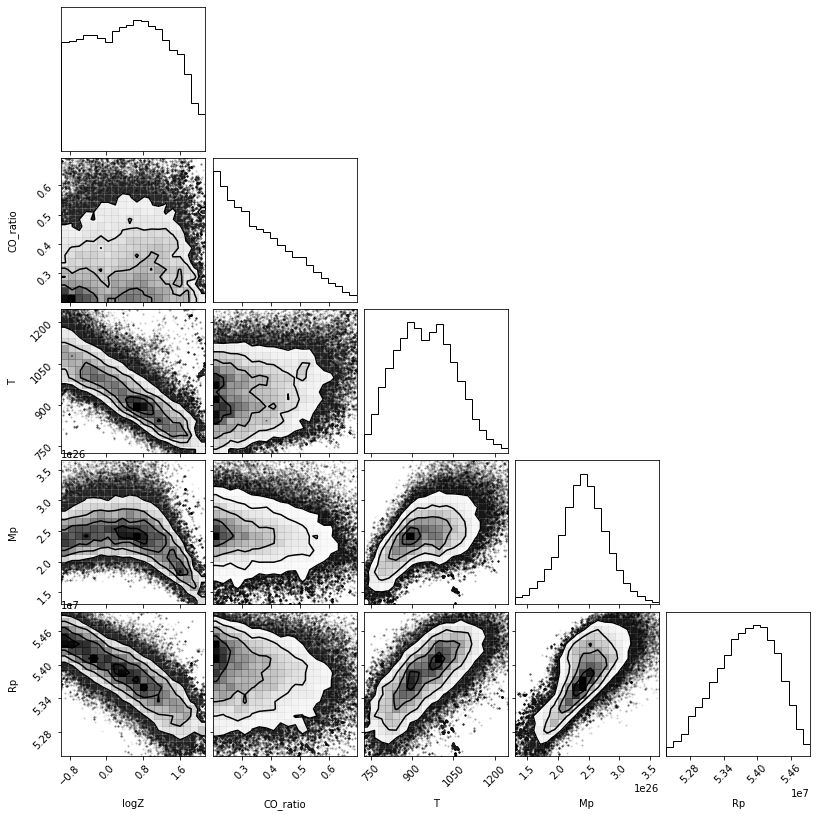

In [22]:
result.plot_corner()
samples=result.flatchain
#samples=result.flat

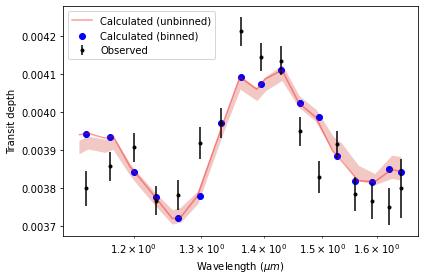

In [40]:
result.plot_spectrum()

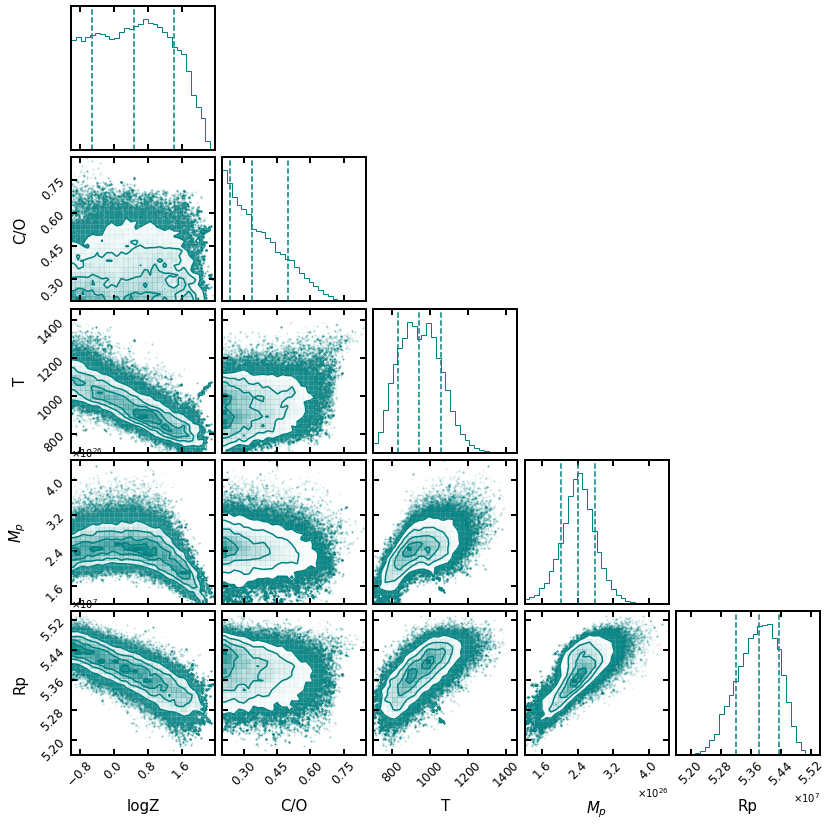

In [34]:
import corner
lab=['logZ','C/O','T',r'$M_{p}$','Rp']
figure=corner.corner(samples[10000:],bins=30,use_math_text=True,labels=lab,quantiles=[0.16,0.5,0.84],show_titles=False,title_kwargs={"fontsize": 15},label_kwargs={"fontsize": 15},color='teal')
ndim=5
axes = np.array(figure.axes).reshape((ndim, ndim))
#axes.subplots_adjust(wspace=0.0,hspace=0.0)
#figure.show()
for i in range(ndim):
    for j in range (i+1):
        ax=axes[i,j]
        ax.tick_params(which='major',direction='in',labelsize=12,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(2.0)
#axes[3,3].set_xlim(0.1e26,9e26)
plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_corner_hst_only_rp_free.pdf',format='pdf')

<Figure size 432x288 with 0 Axes>

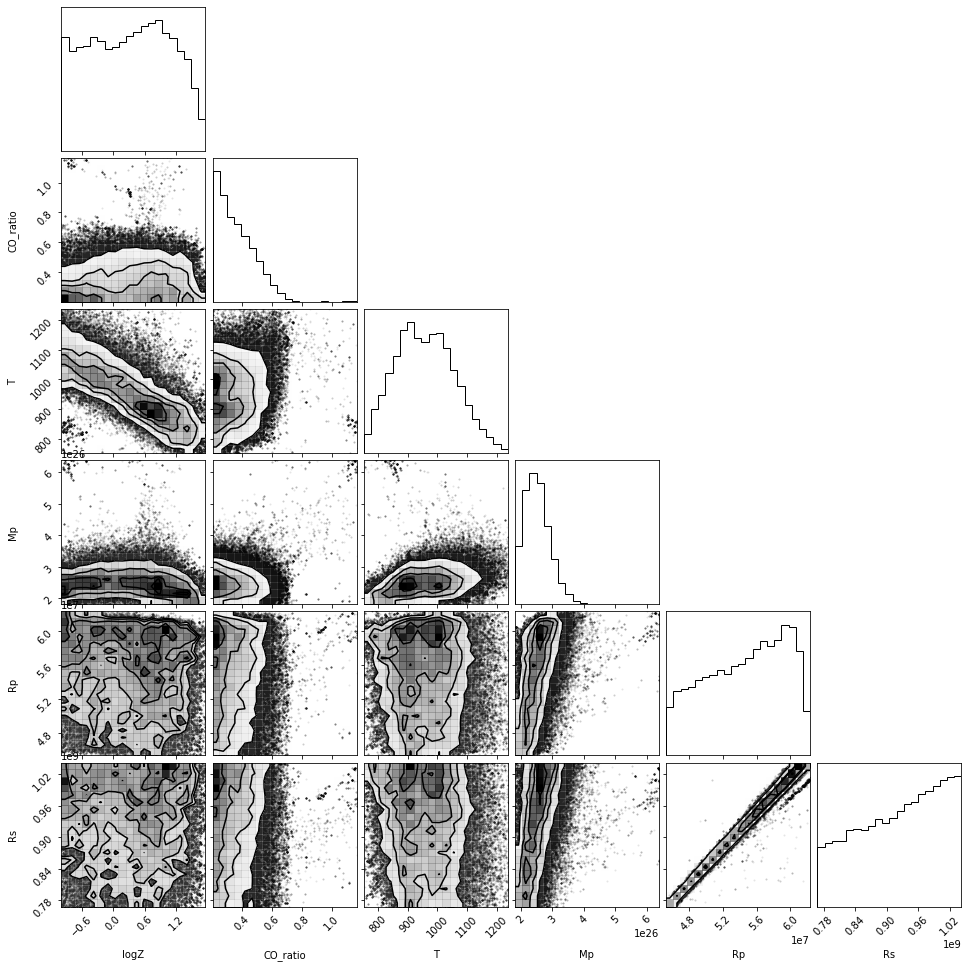

In [16]:
result.plot_corner()

<Figure size 432x288 with 0 Axes>

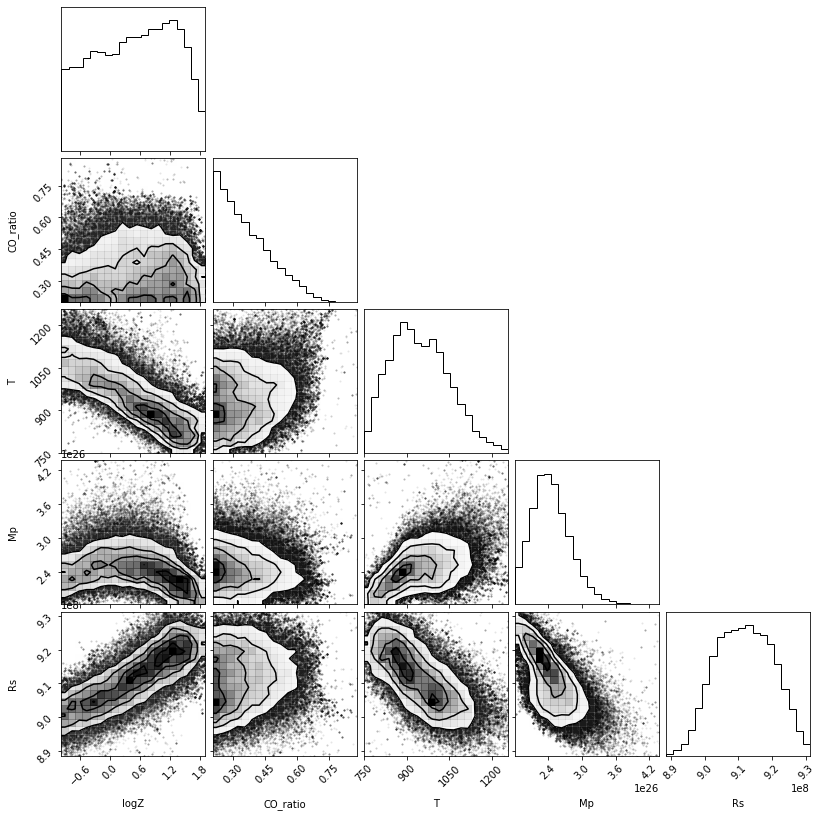

In [19]:
result.plot_corner()

In [39]:
samples=result.flatchain
samples1=samples[5000:]
for i in range(5):
    q=np.quantile(samples1[:,i],[0.16,0.5,0.84])
    print (q[1],q[0],q[2])
import pickle 
with open("/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_b_platon_retrieval_hst_only_rp_free_result.pkl", "wb") as f:
    pickle.dump(result, f)

0.47123480578859267 -0.51505666616393 1.4093584917019368
0.33589599228658856 0.23569182339801278 0.496620177470013
942.158445559053 831.4635054655566 1058.2710914492784
2.4125401924731495e+26 2.0261324226442703e+26 2.784466360077365e+26
53822180.77589838 53208165.862022474 54343116.71737696


In [45]:
q=np.quantile(samples1[:,3],[0.16,0.5,0.84])
print (q[1]/M_earth,(q[0])/M_earth,(q[2])/M_earth)
print ((5.5*10.27**(-3))*q[1]/M_earth,(5.5*10.27**(-3))*(q[0])/M_earth,(5.5*10.27**(-3))*(q[2])/M_earth)

q=np.quantile(samples1[:,4],[0.16,0.5,0.84])
print (q[1]/R_jup,(q[0])/R_jup,(q[2])/R_jup)

40.35109281224985 33.86832828470791 46.55853058626368
0.20488334677988151 0.17196700176368235 0.23640171561279985
0.7527691480016827 0.7442088162588967 0.7601150528991114


In [7]:
import pickle
with open('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_b_platon_retrieval_hst_only_rp_free_result.pkl', 'rb') as f:
    result = pickle.load(f)
samples=result.flatchain
samples1=samples[5000:]
import numpy as np
wave,wave_err,Rad,Rad_err=np.loadtxt('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/v1298_spectra_emcee_new.txt',skiprows=0,unpack=True)

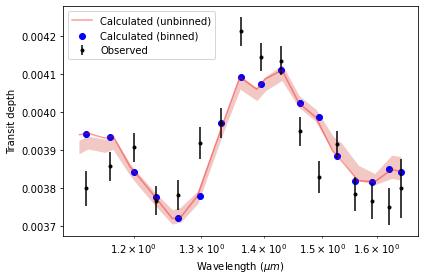

In [8]:
result.plot_spectrum()

"'\n\n\nfrom scipy.ndimage import gaussian_filter as gauss\ntemperature = 615.32 * np.ones_like(pressures)\nfac=(1.0-10**(-3.62)-10**(-9))\n#    fac=1.0\n#    fac_mmw=2.33\nfac_mmw=(2.0*fac*0.74+4.0*fac*0.24+18*10**(-3.15)+16*10**(-9))\nmass_fractions = {}\nmass_fractions['H2'] = 0.74*fac * np.ones_like(temperature)\nmass_fractions['He'] = 0.24 *fac *np.ones_like(temperature)\nmass_fractions['H2O_HITEMP'] = (10**-3.48) * np.ones_like(temperature)\n#mass_fractions['CO_all_iso_HITEMP'] = 0.01 * np.ones_like(temperature)\n#mass_fractions['CO2'] = 0.00001 * np.ones_like(temperature)\nmass_fractions['CH4'] = (10**(-9.0)) * np.ones_like(temperature)\n#mass_fractions['Na_allard'] = 0.00001 * np.ones_like(temperature)\n#mass_fractions['K_allard'] = 0.000001 * np.ones_like(temperature)\n\nMMW = 2.33 * np.ones_like(temperature)\nprint(fac,fac_mmw)\nfrom petitRADTRANS import nat_cst as nc\nR_pl = 0.78479*nc.r_jup_mean\ngravity = 10**2.4267\nP0 = 1.0 # bar\n\n\natmosphere.calc_transm(temperature, 

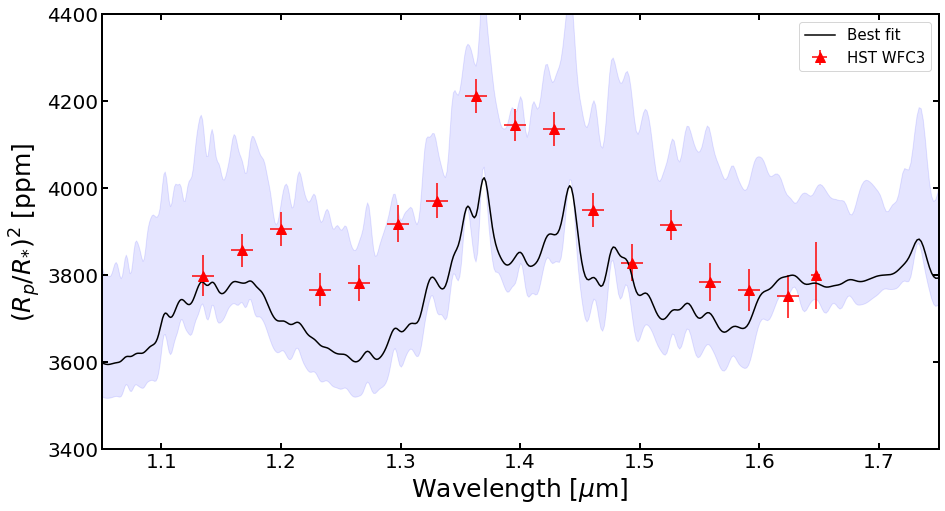

In [17]:
from platon.transit_depth_calculator import TransitDepthCalculator
from platon.constants import M_jup, R_jup, R_sun, M_earth
import matplotlib.pyplot as plt
# All inputs and outputs for PLATON are in SI
import numpy as np
Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.5) #* M_earth
Rp = np.quantile(samples[5000:][:,4],0.5)#0.7529*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.5)
Z= np.quantile(samples[5000:][:,0],0.5)
CO= np.quantile(samples[5000:][:,1],0.5)
#alpha= np.quantile(samples[2000:][:,6],0.5)
#z,mp,rp,
# The initializer loads all data files.  Create a TransitDepthCalculator
# object and hold on to it
calculator = TransitDepthCalculator(method="xsec") #"ktables" for correlated k

# compute_depths is fast once data files are loaded
wavelengths, depths, info_dict_best = calculator.compute_depths(Rs, Mp, Rp, T, logZ=-1.0, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
from scipy.ndimage import gaussian_filter
fig,ax=plt.subplots(1,1,figsize=(15,8))
#plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,4),label='logZ=0.0, C/O=0.53')

#wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=-1.0, CO_ratio=0.53, full_output=True)
from scipy.ndimage import gaussian_filter
#fig,ax=plt.subplots(1,1)
plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,3),label='Best fit',color='black',ls='-')


from platon.abundance_getter import AbundanceGetter
getter = AbundanceGetter()
abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["H2O"] *= 0
#abundances["NH3"]*=0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,cloudtop_pressure=np.inf)
#plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,3),label='H2O supressed',ls='dotted',color='green',lw=2.5)

abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["CH4"] *= 0
#abundances["CO2"] *= 0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,cloudtop_pressure=np.inf)
#plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,5),label='CH4 supressed',ls='dotted',color='orange',lw=2.5)
#abundances["CO"]=*0
ax.set_xlim(1.05,1.75)

wfc3_offset=np.ones_like(wave)
wfc3=0.0
wfc3_offset=wfc3_offset*wfc3
wfc3_offset[0]=0.0
wfc3_offset[-1]=0
wfc3_offset[-2]=0.0
plt.errorbar(wave,(Rad)*1e6+wfc3_offset,yerr=(Rad_err)*1e6,xerr=wave_err,ls='none',marker='^',color='red',ms=10,label='HST WFC3')


Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.84) #* M_earth
Rp = np.quantile(samples[5000:][:,4],0.84)#0.7529*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.84)
Z= np.quantile(samples[5000:][:,0],0.84)
CO= np.quantile(samples[5000:][:,1],0.84)
#alpha= np.quantile(samples[2000:][:,6],0.84)
wavelengths, depths1, info_dict = calculator.compute_depths(1.31*R_sun, Mp, Rp, T, logZ=Z, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
#plt.semilogx(wavelengths*1e6,gaussian_filter(depths1*1e6,5),ls='--',color='black')

Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.16) #* M_earth
Rp = np.quantile(samples[5000:][:,4],0.16)#0.75298*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.16)
Z= np.quantile(samples[5000:][:,0],0.16)
CO= np.quantile(samples[5000:][:,1],0.16)
#alpha= np.quantile(samples[2000:][:,6],0.16)
wavelengths, depths2, info_dict = calculator.compute_depths(1.31*R_sun, Mp, Rp, T, logZ=-1.0, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
ax.fill_between(wavelengths*1e6,y1=gaussian_filter(depths2*1e6,2),y2=gaussian_filter(depths1*1e6,2),color='blue',alpha=0.1)
ax.set_ylim(3400,4400)
ax.tick_params(which='major',direction='in',labelsize=20,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2.0)
ax.set_ylabel(r'$(R_{p}/R_{*})^{2}$ [ppm]',fontsize=25)
ax.set_xlabel(r'Wavelength [$\mu$m]',fontsize=25)


#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model.pdf',format='pdf')

#plt.errorbar(w_spit,(rp_spit**2)*1e6,xerr=w_err_spit,yerr=2*rp_spit*rp_err_spit*1e6,ls='none',marker='s',ms=12,color='olive',label='Spitzer/Kepler')
#plt.errorbar(kepler[0],kepler[2]*1e6,xerr=kepler[1],yerr=kepler[3]*1e6,ls='none',marker='s',ms=12,color='olive')
ax.legend(loc='upper right',fontsize=15)

#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model_hst_only_rp_free.pdf',format='pdf')







############################################################################################################



''''


from scipy.ndimage import gaussian_filter as gauss
temperature = 615.32 * np.ones_like(pressures)
fac=(1.0-10**(-3.62)-10**(-9))
#    fac=1.0
#    fac_mmw=2.33
fac_mmw=(2.0*fac*0.74+4.0*fac*0.24+18*10**(-3.15)+16*10**(-9))
mass_fractions = {}
mass_fractions['H2'] = 0.74*fac * np.ones_like(temperature)
mass_fractions['He'] = 0.24 *fac *np.ones_like(temperature)
mass_fractions['H2O_HITEMP'] = (10**-3.48) * np.ones_like(temperature)
#mass_fractions['CO_all_iso_HITEMP'] = 0.01 * np.ones_like(temperature)
#mass_fractions['CO2'] = 0.00001 * np.ones_like(temperature)
mass_fractions['CH4'] = (10**(-9.0)) * np.ones_like(temperature)
#mass_fractions['Na_allard'] = 0.00001 * np.ones_like(temperature)
#mass_fractions['K_allard'] = 0.000001 * np.ones_like(temperature)

MMW = 2.33 * np.ones_like(temperature)
print(fac,fac_mmw)
from petitRADTRANS import nat_cst as nc
R_pl = 0.78479*nc.r_jup_mean
gravity = 10**2.4267
P0 = 1.0 # bar


atmosphere.calc_transm(temperature, mass_fractions, gravity, MMW, R_pl=R_pl, P0_bar=P0)
rad_binned=rebin(wave,wavebins,nc.c/atmosphere.freq/1e-4,(atmosphere.transm_rad/(1.31*nc.r_sun))**2)
print (sum(((rad_binned-Rad)/Rad_err)**2)/(len(Rad)))
#print (((rad_binned-Rad)/Rad_err)**2)
#plt.errorbar(wave,rad_binned*1e6,yerr=Rad_err*1e6,ls='none',marker='o')
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10, 6)

plt.plot(nc.c/atmosphere.freq/1e-4, gauss((atmosphere.transm_rad/(1.31*nc.r_sun))**2*1e6,3),color='black')

#plt.xscale('log')
plt.xlabel('Wavelength (microns)')
plt.ylabel(r'Transit radius ($\rm R_{Jup}$)')
plt.errorbar(wave,Rad*1e6,yerr=Rad_err*1e6,xerr=wave_err,ls='none',marker='o',color='red')
#plt.show()
#plt.clf()


atmosphere_1 = Radtrans(line_species = ['H2O_HITEMP',
                                      #'CO_all_iso_HITEMP',
                                      'CH4'],
                                     # 'CO2',
                                     # 'Na_allard',
                                     # 'K_allard'],
                      rayleigh_species = ['H2', 'He'],
                      continuum_opacities = ['H2-H2', 'H2-He'],
                      wlen_bords_micron = [1.1, 1.7])

pressures = np.logspace(-6, 2, 50)

atmosphere_1.setup_opa_structure(pressures)
temperature = 514.32 * np.ones_like(pressures)
fac_mmw=(2.0*fac*0.74+4.0*fac*0.24+18*10**(-3.66)+16*10**(-9))
mass_fractions = {}
mass_fractions['H2'] = 0.74 *fac* np.ones_like(temperature)
mass_fractions['He'] = 0.24 *fac* np.ones_like(temperature)
mass_fractions['H2O_HITEMP'] = (10**-4.06) * np.ones_like(temperature)
#mass_fractions['CO_all_iso_HITEMP'] = 0.01 * np.ones_like(temperature)
#mass_fractions['CO2'] = 0.00001 * np.ones_like(temperature)
mass_fractions['CH4'] = (10**(-11)) * np.ones_like(temperature)
#mass_fractions['Na_allard'] = 0.00001 * np.ones_like(temperature)
#mass_fractions['K_allard'] = 0.000001 * np.ones_like(temperature)

MMW = 2.33 * np.ones_like(temperature)

from petitRADTRANS import nat_cst as nc
R_pl = 0.78106*nc.r_jup_mean
gravity = 10**2.3563
P0 = 1.0

atmosphere_1.calc_transm(temperature, mass_fractions, gravity, MMW, R_pl=R_pl, P0_bar=P0)




atmosphere_2 = Radtrans(line_species = ['H2O_HITEMP',
                                      #'CO_all_iso_HITEMP',
                                      'CH4'],
                                     # 'CO2',
                                     # 'Na_allard',
                                     # 'K_allard'],
                      rayleigh_species = ['H2', 'He'],
                      continuum_opacities = ['H2-H2', 'H2-He'],
                      wlen_bords_micron = [1.1, 1.7])

pressures = np.logspace(-6, 2, 50)

atmosphere_2.setup_opa_structure(pressures)
temperature = 720.32 * np.ones_like(pressures)
fac_mmw=(2.0*fac*0.74+4.0*fac*0.24+18*10**(-3.0)+16*10**(-9))
mass_fractions = {}
mass_fractions['H2'] = 0.74 * np.ones_like(temperature)
mass_fractions['He'] = 0.24 * np.ones_like(temperature)
mass_fractions['H2O_HITEMP'] = (10**-3.0) * np.ones_like(temperature)
#mass_fractions['CO_all_iso_HITEMP'] = 0.01 * np.ones_like(temperature)
#mass_fractions['CO2'] = 0.00001 * np.ones_like(temperature)
mass_fractions['CH4'] = (10**(-6.178)) * np.ones_like(temperature)
#mass_fractions['Na_allard'] = 0.00001 * np.ones_like(temperature)
#mass_fractions['K_allard'] = 0.000001 * np.ones_like(temperature)

MMW = 2.33 * np.ones_like(temperature)

from petitRADTRANS import nat_cst as nc
R_pl = 0.78802*nc.r_jup_mean
gravity = 10**2.4982
P0 = 1.0

atmosphere_2.calc_transm(temperature, mass_fractions, gravity, MMW, R_pl=R_pl, P0_bar=P0)

plt.fill_between(nc.c/atmosphere.freq/1e-4, gauss((atmosphere_1.transm_rad/(1.31*nc.r_sun))**2*1e6,3),gauss((atmosphere_2.transm_rad/(1.31*nc.r_sun))**2*1e6,3),color='blue',alpha=0.3)

'''


In [44]:
samples1=samples[14000:]
vol=4*np.pi*R_earth**3/3.0
print((5.5*10.27**(-3))*min(samples1[:,3])/M_earth,(5.5*10.27**(-3))*max(samples1[:,3]/M_earth))
print (min(samples1[:,3])/M_earth,max(samples1[:,3]/M_earth))

0.10166820664169797 0.37860104900769087
20.02321470598404 74.56421572289841


In [52]:
retriever=CombinedRetriever()
R_guess=0.7529*R_jup
T_star=4962
fit_info=retriever.get_default_fit_info(Rs=1.31*R_sun,Rp=R_guess,logZ=0.16,CO_ratio=0.53,T=677,Mp=40*M_earth,profile_type='isothermal')
fit_info.add_uniform_fit_param("logZ",-1.0,2.5)
fit_info.add_uniform_fit_param("CO_ratio",0.2,1.5)
#fit_info.add_uniform_fit_param("T",700,1500)
fit_info.add_uniform_fit_param("Mp",20*M_earth,0.4*M_jup)
#fit_info.add_gaussian_fit_param("Rp",0.1*R_jup)
fit_info.add_uniform_fit_param("Rp",0.5*R_jup,1.5*R_jup)
#fit_info.add_uniform_fit_param("Rs",1.1*R_sun,1.5*R_sun)
#fit_info.add_gaussian_fit_param('Rs', 0.06*R_sun)
#fit_info.add_uniform_fit_param("wfc3_offset_transit",-0.002,0.0)

#fit_info.add_uniform_fit_param("log_scatt_factor",0.0,4.0)

#fit_info.add_uniform_fit_param("log_cloudtop_P",0.0,5.0)

In [53]:
result=retriever.run_emcee(wavebins,Rad,Rad_err,None,None,None,fit_info,nwalkers=20,nsteps=5000,rad_method='ktables',include_condensation=True)


Step 10: ln_prob=-8.05e+04	logZ=1.23 	CO_ratio=0.70 	Mp=0.31 M_jup	Rp=1.10 R_jup	
Step 20: ln_prob=-4.46e+02	logZ=0.86 	CO_ratio=0.21 	Mp=0.22 M_jup	Rp=0.74 R_jup	
Step 30: ln_prob=8.59e+01	logZ=0.79 	CO_ratio=0.67 	Mp=0.20 M_jup	Rp=0.77 R_jup	
Step 40: ln_prob=6.49e+01	logZ=0.96 	CO_ratio=0.63 	Mp=0.22 M_jup	Rp=0.78 R_jup	
Step 50: ln_prob=9.59e+01	logZ=0.69 	CO_ratio=0.49 	Mp=0.17 M_jup	Rp=0.77 R_jup	
Step 60: ln_prob=9.14e+01	logZ=0.79 	CO_ratio=0.66 	Mp=0.17 M_jup	Rp=0.77 R_jup	
Step 70: ln_prob=-2.74e+01	logZ=2.02 	CO_ratio=0.38 	Mp=0.13 M_jup	Rp=0.75 R_jup	
Step 80: ln_prob=1.04e+02	logZ=-0.11 	CO_ratio=0.28 	Mp=0.11 M_jup	Rp=0.76 R_jup	
Step 90: ln_prob=1.06e+02	logZ=1.24 	CO_ratio=0.41 	Mp=0.12 M_jup	Rp=0.76 R_jup	
Step 100: ln_prob=1.09e+02	logZ=0.81 	CO_ratio=0.28 	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 110: ln_prob=6.93e+01	logZ=1.34 	CO_ratio=0.21 	Mp=0.07 M_jup	Rp=0.73 R_jup	
Step 120: ln_prob=1.12e+02	logZ=1.16 	CO_ratio=0.27 	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 130: ln_prob=1.0

Step 1010: ln_prob=1.15e+02	logZ=2.03 	CO_ratio=0.27 	Mp=0.07 M_jup	Rp=0.75 R_jup	
Step 1020: ln_prob=1.19e+02	logZ=1.87 	CO_ratio=0.23 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 1030: ln_prob=1.19e+02	logZ=1.95 	CO_ratio=0.21 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 1040: ln_prob=1.18e+02	logZ=1.77 	CO_ratio=0.22 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 1050: ln_prob=1.12e+02	logZ=2.02 	CO_ratio=0.34 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 1060: ln_prob=1.16e+02	logZ=2.14 	CO_ratio=0.33 	Mp=0.07 M_jup	Rp=0.75 R_jup	
Step 1070: ln_prob=1.18e+02	logZ=1.93 	CO_ratio=0.29 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 1080: ln_prob=1.15e+02	logZ=1.76 	CO_ratio=0.39 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 1090: ln_prob=1.16e+02	logZ=1.87 	CO_ratio=0.37 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 1100: ln_prob=1.14e+02	logZ=1.71 	CO_ratio=0.20 	Mp=0.07 M_jup	Rp=0.73 R_jup	
Step 1110: ln_prob=1.10e+02	logZ=1.66 	CO_ratio=0.52 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 1120: ln_prob=6.73e+01	logZ=0.54 	CO_ratio=0.26 	Mp=0.08 M_jup	Rp=0.75 R_jup	
Step

Step 2000: ln_prob=1.17e+02	logZ=1.63 	CO_ratio=0.20 	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 2010: ln_prob=1.17e+02	logZ=2.00 	CO_ratio=0.21 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 2020: ln_prob=1.16e+02	logZ=1.97 	CO_ratio=0.22 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 2030: ln_prob=1.17e+02	logZ=2.13 	CO_ratio=0.20 	Mp=0.08 M_jup	Rp=0.75 R_jup	
Step 2040: ln_prob=1.19e+02	logZ=1.93 	CO_ratio=0.22 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 2050: ln_prob=1.17e+02	logZ=1.97 	CO_ratio=0.26 	Mp=0.08 M_jup	Rp=0.75 R_jup	
Step 2060: ln_prob=1.19e+02	logZ=1.87 	CO_ratio=0.22 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 2070: ln_prob=1.18e+02	logZ=1.91 	CO_ratio=0.28 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 2080: ln_prob=1.18e+02	logZ=1.90 	CO_ratio=0.25 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 2090: ln_prob=1.16e+02	logZ=1.75 	CO_ratio=0.27 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 2100: ln_prob=1.17e+02	logZ=1.69 	CO_ratio=0.26 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 2110: ln_prob=1.20e+02	logZ=2.01 	CO_ratio=0.20 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step

Step 2990: ln_prob=1.17e+02	logZ=1.72 	CO_ratio=0.22 	Mp=0.09 M_jup	Rp=0.75 R_jup	
Step 3000: ln_prob=1.09e+02	logZ=2.29 	CO_ratio=0.28 	Mp=0.08 M_jup	Rp=0.76 R_jup	
Step 3010: ln_prob=1.18e+02	logZ=1.70 	CO_ratio=0.23 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 3020: ln_prob=1.14e+02	logZ=1.37 	CO_ratio=0.21 	Mp=0.10 M_jup	Rp=0.75 R_jup	
Step 3030: ln_prob=1.19e+02	logZ=1.91 	CO_ratio=0.23 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 3040: ln_prob=1.19e+02	logZ=1.82 	CO_ratio=0.21 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 3050: ln_prob=1.19e+02	logZ=2.02 	CO_ratio=0.24 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 3060: ln_prob=1.15e+02	logZ=2.04 	CO_ratio=0.33 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 3070: ln_prob=1.19e+02	logZ=1.80 	CO_ratio=0.21 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 3080: ln_prob=1.18e+02	logZ=1.92 	CO_ratio=0.25 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 3090: ln_prob=1.18e+02	logZ=2.12 	CO_ratio=0.24 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 3100: ln_prob=1.14e+02	logZ=1.69 	CO_ratio=0.24 	Mp=0.09 M_jup	Rp=0.75 R_jup	
Step

Step 3980: ln_prob=1.17e+02	logZ=1.57 	CO_ratio=0.21 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 3990: ln_prob=-2.88e+01	logZ=2.07 	CO_ratio=0.21 	Mp=0.09 M_jup	Rp=0.74 R_jup	
Step 4000: ln_prob=1.19e+02	logZ=1.88 	CO_ratio=0.23 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 4010: ln_prob=1.17e+02	logZ=1.70 	CO_ratio=0.28 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 4020: ln_prob=1.10e+02	logZ=1.73 	CO_ratio=0.55 	Mp=0.07 M_jup	Rp=0.73 R_jup	
Step 4030: ln_prob=1.18e+02	logZ=1.85 	CO_ratio=0.22 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 4040: ln_prob=1.07e+02	logZ=1.62 	CO_ratio=0.25 	Mp=0.09 M_jup	Rp=0.75 R_jup	
Step 4050: ln_prob=1.15e+02	logZ=2.05 	CO_ratio=0.39 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 4060: ln_prob=1.18e+02	logZ=1.73 	CO_ratio=0.21 	Mp=0.08 M_jup	Rp=0.74 R_jup	
Step 4070: ln_prob=1.18e+02	logZ=1.79 	CO_ratio=0.20 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 4080: ln_prob=1.17e+02	logZ=1.99 	CO_ratio=0.23 	Mp=0.08 M_jup	Rp=0.75 R_jup	
Step 4090: ln_prob=1.18e+02	logZ=1.86 	CO_ratio=0.21 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Ste

Step 4970: ln_prob=1.19e+02	logZ=2.09 	CO_ratio=0.21 	Mp=0.07 M_jup	Rp=0.74 R_jup	
Step 4980: ln_prob=1.18e+02	logZ=2.22 	CO_ratio=0.24 	Mp=0.07 M_jup	Rp=0.75 R_jup	
Step 4990: ln_prob=-4.63e+02	logZ=0.99 	CO_ratio=0.23 	Mp=0.07 M_jup	Rp=0.75 R_jup	
Step 5000: ln_prob=1.18e+02	logZ=1.93 	CO_ratio=0.25 	Mp=0.08 M_jup	Rp=0.74 R_jup	
#Parameter Lower_error Median Upper_error Best_fit
Max_lnprob 120.4889714826217
logZ 0.4885411034464555 1.9052423521777615 0.17149787740573474 2.132756864454664
CO_ratio 0.024582904366270225 0.23244859556994402 0.05544046507702044 0.2000273927648838
Mp 1.557485548639827e+25 1.402725110493245e+26 2.6565582354081497e+25 1.1987664772986352e+26
Rp 365018.6391450092 53117686.14794353 676519.6182178482 52955008.72169592

equal_samples.shape: (100000, 4), num_final_samples: 100
[[ 1.60000000e-01  5.30000000e-01  2.38894400e+26  5.38263268e+07]
 [-2.20292022e-01  7.64316485e-01  4.09040005e+26  4.15948880e+07]
 [ 1.21179960e+00  5.48072274e-01  1.70022001e+26  7.4540

<Figure size 432x288 with 0 Axes>

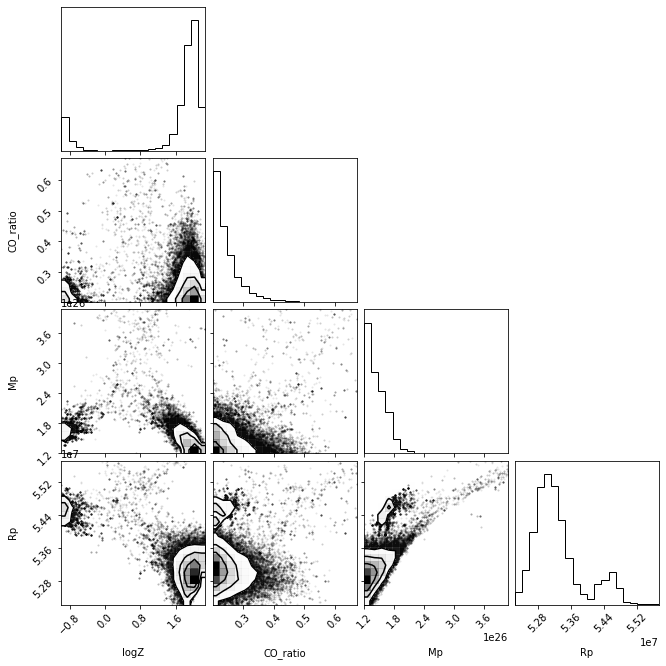

In [54]:
result.plot_corner()

In [61]:
retriever=CombinedRetriever()
R_guess=0.7529*R_jup
T_star=4962
fit_info=retriever.get_default_fit_info(Rs=1.31*R_sun,Rp=R_guess,logZ=0.16,CO_ratio=0.53,T=750,Mp=40*M_earth,profile_type='isothermal',T_spot=5000,spot_cov_frac=0.2)
fit_info.add_uniform_fit_param("logZ",-1.0,2.5)
fit_info.add_uniform_fit_param("CO_ratio",0.2,1.5)
fit_info.add_uniform_fit_param("T",700,1500)
fit_info.add_uniform_fit_param("Mp",20*M_earth,0.4*M_jup)
#fit_info.add_gaussian_fit_param("Rp",0.1*R_jup)
fit_info.add_uniform_fit_param("T_spot",T_star-1000,T_star+1000)
fit_info.add_uniform_fit_param("spot_cov_frac",0.0,0.8)
#fit_info.add_uniform_fit_param("Rs",1.1*R_sun,1.5*R_sun)
#fit_info.add_gaussian_fit_param('Rs', 0.06*R_sun)
#fit_info.add_uniform_fit_param("wfc3_offset_transit",-0.002,0.0)

#fit_info.add_uniform_fit_param("log_scatt_factor",0.0,4.0)

#fit_info.add_uniform_fit_param("log_cloudtop_P",0.0,5.0)

In [62]:
result=retriever.run_emcee(wavebins,Rad,Rad_err,None,None,None,fit_info,nwalkers=20,nsteps=12000,rad_method='ktables',include_condensation=True)

Step 10: ln_prob=5.39e+01	logZ=2.06 	CO_ratio=1.30 	T= 940 K	Mp=0.07 M_jup	T_spot=4307.61 	spot_cov_frac=0.05 	
Step 20: ln_prob=7.42e+01	logZ=0.87 	CO_ratio=1.34 	T=1202 K	Mp=0.13 M_jup	T_spot=4327.57 	spot_cov_frac=0.38 	
Step 30: ln_prob=6.84e+01	logZ=1.06 	CO_ratio=1.40 	T=1204 K	Mp=0.13 M_jup	T_spot=4027.85 	spot_cov_frac=0.37 	
Step 40: ln_prob=-2.55e+01	logZ=1.14 	CO_ratio=0.96 	T=1229 K	Mp=0.17 M_jup	T_spot=5286.40 	spot_cov_frac=0.41 	
Step 50: ln_prob=8.21e+01	logZ=1.60 	CO_ratio=0.48 	T=1317 K	Mp=0.26 M_jup	T_spot=5256.86 	spot_cov_frac=0.44 	
Step 60: ln_prob=6.61e+01	logZ=1.77 	CO_ratio=1.28 	T=1079 K	Mp=0.10 M_jup	T_spot=4281.80 	spot_cov_frac=0.05 	
Step 70: ln_prob=4.71e+01	logZ=1.20 	CO_ratio=0.91 	T=1041 K	Mp=0.14 M_jup	T_spot=5312.07 	spot_cov_frac=0.32 	
Step 80: ln_prob=5.20e+01	logZ=1.29 	CO_ratio=1.02 	T=1310 K	Mp=0.14 M_jup	T_spot=4429.73 	spot_cov_frac=0.42 	
Step 90: ln_prob=-8.64e+00	logZ=0.95 	CO_ratio=0.63 	T=1224 K	Mp=0.15 M_jup	T_spot=4715.66 	spot_cov_fr

Step 740: ln_prob=1.19e+02	logZ=-0.57 	CO_ratio=0.36 	T=1033 K	Mp=0.11 M_jup	T_spot=4228.87 	spot_cov_frac=0.40 	
Step 750: ln_prob=1.19e+02	logZ=-0.21 	CO_ratio=0.27 	T= 994 K	Mp=0.12 M_jup	T_spot=5311.98 	spot_cov_frac=0.36 	
Step 760: ln_prob=1.19e+02	logZ=-0.23 	CO_ratio=0.33 	T=1002 K	Mp=0.12 M_jup	T_spot=4882.86 	spot_cov_frac=0.46 	
Step 770: ln_prob=1.19e+02	logZ=-0.37 	CO_ratio=0.28 	T= 995 K	Mp=0.12 M_jup	T_spot=4640.60 	spot_cov_frac=0.42 	
Step 780: ln_prob=1.21e+02	logZ=0.98 	CO_ratio=0.29 	T= 881 K	Mp=0.14 M_jup	T_spot=4486.05 	spot_cov_frac=0.16 	
Step 790: ln_prob=1.20e+02	logZ=-0.38 	CO_ratio=0.43 	T= 994 K	Mp=0.11 M_jup	T_spot=4553.00 	spot_cov_frac=0.66 	
Step 800: ln_prob=1.20e+02	logZ=-0.29 	CO_ratio=0.33 	T=1000 K	Mp=0.12 M_jup	T_spot=5228.51 	spot_cov_frac=0.66 	
Step 810: ln_prob=1.21e+02	logZ=0.51 	CO_ratio=0.21 	T= 926 K	Mp=0.14 M_jup	T_spot=4539.23 	spot_cov_frac=0.11 	
Step 820: ln_prob=1.20e+02	logZ=0.11 	CO_ratio=0.43 	T= 971 K	Mp=0.12 M_jup	T_spot=5678.15

Step 1460: ln_prob=1.21e+02	logZ=0.17 	CO_ratio=0.24 	T= 939 K	Mp=0.13 M_jup	T_spot=5367.47 	spot_cov_frac=0.79 	
Step 1470: ln_prob=1.20e+02	logZ=0.04 	CO_ratio=0.36 	T= 937 K	Mp=0.12 M_jup	T_spot=4704.92 	spot_cov_frac=0.56 	
Step 1480: ln_prob=1.21e+02	logZ=0.78 	CO_ratio=0.28 	T= 907 K	Mp=0.14 M_jup	T_spot=4675.04 	spot_cov_frac=0.29 	
Step 1490: ln_prob=1.20e+02	logZ=0.04 	CO_ratio=0.35 	T= 941 K	Mp=0.12 M_jup	T_spot=4440.34 	spot_cov_frac=0.31 	
Step 1500: ln_prob=1.21e+02	logZ=0.40 	CO_ratio=0.26 	T= 927 K	Mp=0.14 M_jup	T_spot=5078.94 	spot_cov_frac=0.24 	
Step 1510: ln_prob=1.14e+02	logZ=0.14 	CO_ratio=0.50 	T=1086 K	Mp=0.13 M_jup	T_spot=5591.19 	spot_cov_frac=0.19 	
Step 1520: ln_prob=1.21e+02	logZ=0.52 	CO_ratio=0.26 	T= 925 K	Mp=0.14 M_jup	T_spot=5069.13 	spot_cov_frac=0.19 	
Step 1530: ln_prob=1.21e+02	logZ=0.83 	CO_ratio=0.23 	T= 886 K	Mp=0.14 M_jup	T_spot=5251.48 	spot_cov_frac=0.42 	
Step 1540: ln_prob=1.21e+02	logZ=0.61 	CO_ratio=0.22 	T= 874 K	Mp=0.13 M_jup	T_spot=5272

Step 2180: ln_prob=1.21e+02	logZ=0.52 	CO_ratio=0.22 	T= 922 K	Mp=0.14 M_jup	T_spot=5603.56 	spot_cov_frac=0.23 	
Step 2190: ln_prob=1.17e+02	logZ=-0.10 	CO_ratio=0.57 	T=1062 K	Mp=0.12 M_jup	T_spot=4793.08 	spot_cov_frac=0.20 	
Step 2200: ln_prob=1.00e+02	logZ=-0.46 	CO_ratio=0.76 	T=1065 K	Mp=0.11 M_jup	T_spot=4508.31 	spot_cov_frac=0.51 	
Step 2210: ln_prob=1.20e+02	logZ=0.14 	CO_ratio=0.47 	T= 991 K	Mp=0.13 M_jup	T_spot=5287.75 	spot_cov_frac=0.28 	
Step 2220: ln_prob=1.14e+02	logZ=0.64 	CO_ratio=0.38 	T= 994 K	Mp=0.14 M_jup	T_spot=4942.84 	spot_cov_frac=0.54 	
Step 2230: ln_prob=1.14e+02	logZ=0.95 	CO_ratio=0.30 	T= 904 K	Mp=0.15 M_jup	T_spot=5720.24 	spot_cov_frac=0.76 	
Step 2240: ln_prob=1.20e+02	logZ=-0.24 	CO_ratio=0.45 	T=1026 K	Mp=0.12 M_jup	T_spot=4988.85 	spot_cov_frac=0.28 	
Step 2250: ln_prob=1.13e+02	logZ=0.16 	CO_ratio=0.26 	T= 857 K	Mp=0.11 M_jup	T_spot=5912.08 	spot_cov_frac=0.00 	
Step 2260: ln_prob=1.21e+02	logZ=0.53 	CO_ratio=0.26 	T= 943 K	Mp=0.14 M_jup	T_spot=5

Step 2900: ln_prob=1.21e+02	logZ=0.60 	CO_ratio=0.30 	T= 911 K	Mp=0.14 M_jup	T_spot=4065.66 	spot_cov_frac=0.71 	
Step 2910: ln_prob=1.03e+02	logZ=0.81 	CO_ratio=0.71 	T= 942 K	Mp=0.13 M_jup	T_spot=4089.92 	spot_cov_frac=0.27 	
Step 2920: ln_prob=1.17e+02	logZ=-0.21 	CO_ratio=0.37 	T= 960 K	Mp=0.11 M_jup	T_spot=4384.47 	spot_cov_frac=0.24 	
Step 2930: ln_prob=1.11e+02	logZ=0.88 	CO_ratio=0.61 	T= 970 K	Mp=0.15 M_jup	T_spot=4070.63 	spot_cov_frac=0.70 	
Step 2940: ln_prob=1.20e+02	logZ=-0.02 	CO_ratio=0.39 	T= 944 K	Mp=0.12 M_jup	T_spot=4846.95 	spot_cov_frac=0.13 	
Step 2950: ln_prob=1.21e+02	logZ=0.38 	CO_ratio=0.30 	T= 903 K	Mp=0.13 M_jup	T_spot=4218.77 	spot_cov_frac=0.32 	
Step 2960: ln_prob=1.21e+02	logZ=0.93 	CO_ratio=0.30 	T= 894 K	Mp=0.14 M_jup	T_spot=4344.53 	spot_cov_frac=0.56 	
Step 2970: ln_prob=1.06e+02	logZ=0.26 	CO_ratio=0.68 	T=1109 K	Mp=0.15 M_jup	T_spot=5073.66 	spot_cov_frac=0.65 	
Step 2980: ln_prob=1.14e+02	logZ=0.07 	CO_ratio=0.59 	T=1143 K	Mp=0.15 M_jup	T_spot=55

Step 3620: ln_prob=1.19e+02	logZ=0.27 	CO_ratio=0.28 	T=1036 K	Mp=0.15 M_jup	T_spot=5428.77 	spot_cov_frac=0.52 	
Step 3630: ln_prob=1.15e+02	logZ=1.38 	CO_ratio=0.36 	T= 930 K	Mp=0.16 M_jup	T_spot=4475.91 	spot_cov_frac=0.49 	
Step 3640: ln_prob=1.19e+02	logZ=0.73 	CO_ratio=0.38 	T=1017 K	Mp=0.16 M_jup	T_spot=5538.43 	spot_cov_frac=0.58 	
Step 3650: ln_prob=1.18e+02	logZ=0.72 	CO_ratio=0.36 	T= 901 K	Mp=0.13 M_jup	T_spot=4418.27 	spot_cov_frac=0.25 	
Step 3660: ln_prob=1.20e+02	logZ=0.33 	CO_ratio=0.46 	T= 986 K	Mp=0.13 M_jup	T_spot=4842.42 	spot_cov_frac=0.52 	
Step 3670: ln_prob=1.19e+02	logZ=1.03 	CO_ratio=0.46 	T= 945 K	Mp=0.15 M_jup	T_spot=5800.17 	spot_cov_frac=0.39 	
Step 3680: ln_prob=1.17e+02	logZ=0.63 	CO_ratio=0.45 	T=1017 K	Mp=0.15 M_jup	T_spot=4889.25 	spot_cov_frac=0.23 	
Step 3690: ln_prob=-1.43e+01	logZ=1.83 	CO_ratio=0.39 	T= 772 K	Mp=0.16 M_jup	T_spot=5390.42 	spot_cov_frac=0.34 	
Step 3700: ln_prob=1.19e+02	logZ=0.96 	CO_ratio=0.47 	T= 964 K	Mp=0.15 M_jup	T_spot=528

Step 4340: ln_prob=1.21e+02	logZ=0.74 	CO_ratio=0.30 	T= 875 K	Mp=0.14 M_jup	T_spot=5599.36 	spot_cov_frac=0.09 	
Step 4350: ln_prob=1.21e+02	logZ=0.35 	CO_ratio=0.31 	T= 932 K	Mp=0.13 M_jup	T_spot=4694.20 	spot_cov_frac=0.69 	
Step 4360: ln_prob=1.19e+02	logZ=0.47 	CO_ratio=0.30 	T= 846 K	Mp=0.13 M_jup	T_spot=4159.60 	spot_cov_frac=0.21 	
Step 4370: ln_prob=1.21e+02	logZ=1.01 	CO_ratio=0.24 	T= 868 K	Mp=0.14 M_jup	T_spot=5361.11 	spot_cov_frac=0.13 	
Step 4380: ln_prob=1.21e+02	logZ=0.57 	CO_ratio=0.26 	T= 865 K	Mp=0.13 M_jup	T_spot=5656.27 	spot_cov_frac=0.15 	
Step 4390: ln_prob=1.20e+02	logZ=0.52 	CO_ratio=0.49 	T= 918 K	Mp=0.13 M_jup	T_spot=5322.00 	spot_cov_frac=0.49 	
Step 4400: ln_prob=1.21e+02	logZ=0.09 	CO_ratio=0.21 	T= 905 K	Mp=0.12 M_jup	T_spot=5178.95 	spot_cov_frac=0.36 	
Step 4410: ln_prob=1.11e+02	logZ=0.99 	CO_ratio=0.44 	T= 908 K	Mp=0.15 M_jup	T_spot=5950.43 	spot_cov_frac=0.53 	
Step 4420: ln_prob=1.20e+02	logZ=0.51 	CO_ratio=0.43 	T= 966 K	Mp=0.14 M_jup	T_spot=5351

Step 5060: ln_prob=1.19e+02	logZ=0.62 	CO_ratio=0.47 	T=1018 K	Mp=0.15 M_jup	T_spot=5824.98 	spot_cov_frac=0.55 	
Step 5070: ln_prob=1.19e+02	logZ=0.65 	CO_ratio=0.21 	T= 820 K	Mp=0.13 M_jup	T_spot=4788.13 	spot_cov_frac=0.59 	
Step 5080: ln_prob=1.20e+02	logZ=0.40 	CO_ratio=0.43 	T= 929 K	Mp=0.13 M_jup	T_spot=4489.35 	spot_cov_frac=0.22 	
Step 5090: ln_prob=1.19e+02	logZ=-0.78 	CO_ratio=0.28 	T=1001 K	Mp=0.10 M_jup	T_spot=5949.18 	spot_cov_frac=0.46 	
Step 5100: ln_prob=1.21e+02	logZ=0.04 	CO_ratio=0.30 	T= 935 K	Mp=0.12 M_jup	T_spot=4993.35 	spot_cov_frac=0.07 	
Step 5110: ln_prob=1.19e+02	logZ=-0.05 	CO_ratio=0.59 	T=1080 K	Mp=0.13 M_jup	T_spot=5914.75 	spot_cov_frac=0.03 	
Step 5120: ln_prob=1.19e+02	logZ=0.42 	CO_ratio=0.45 	T= 898 K	Mp=0.12 M_jup	T_spot=4194.27 	spot_cov_frac=0.03 	
Step 5130: ln_prob=1.01e+02	logZ=1.08 	CO_ratio=0.45 	T= 847 K	Mp=0.12 M_jup	T_spot=4762.16 	spot_cov_frac=0.09 	
Step 5140: ln_prob=1.20e+02	logZ=0.05 	CO_ratio=0.53 	T=1000 K	Mp=0.12 M_jup	T_spot=51

Step 5780: ln_prob=1.21e+02	logZ=0.09 	CO_ratio=0.30 	T= 930 K	Mp=0.12 M_jup	T_spot=5331.69 	spot_cov_frac=0.06 	
Step 5790: ln_prob=1.20e+02	logZ=0.26 	CO_ratio=0.33 	T= 921 K	Mp=0.12 M_jup	T_spot=5180.34 	spot_cov_frac=0.10 	
Step 5800: ln_prob=-9.51e-01	logZ=-0.60 	CO_ratio=0.79 	T=1158 K	Mp=0.14 M_jup	T_spot=5214.01 	spot_cov_frac=0.54 	
Step 5810: ln_prob=1.20e+02	logZ=0.58 	CO_ratio=0.37 	T= 854 K	Mp=0.13 M_jup	T_spot=5333.45 	spot_cov_frac=0.39 	
Step 5820: ln_prob=1.21e+02	logZ=0.38 	CO_ratio=0.35 	T= 893 K	Mp=0.13 M_jup	T_spot=5235.42 	spot_cov_frac=0.13 	
Step 5830: ln_prob=1.19e+02	logZ=0.43 	CO_ratio=0.58 	T= 988 K	Mp=0.13 M_jup	T_spot=4687.27 	spot_cov_frac=0.21 	
Step 5840: ln_prob=1.19e+02	logZ=0.67 	CO_ratio=0.33 	T= 856 K	Mp=0.12 M_jup	T_spot=5244.56 	spot_cov_frac=0.12 	
Step 5850: ln_prob=1.20e+02	logZ=-0.43 	CO_ratio=0.35 	T= 969 K	Mp=0.11 M_jup	T_spot=5314.46 	spot_cov_frac=0.12 	
Step 5860: ln_prob=1.02e+02	logZ=0.73 	CO_ratio=0.33 	T= 859 K	Mp=0.12 M_jup	T_spot=5

Step 6500: ln_prob=1.02e+02	logZ=2.06 	CO_ratio=0.25 	T= 771 K	Mp=0.11 M_jup	T_spot=4734.15 	spot_cov_frac=0.22 	
Step 6510: ln_prob=7.68e+01	logZ=1.85 	CO_ratio=0.46 	T= 891 K	Mp=0.15 M_jup	T_spot=4428.42 	spot_cov_frac=0.25 	
Step 6520: ln_prob=1.09e+02	logZ=1.60 	CO_ratio=0.44 	T= 889 K	Mp=0.15 M_jup	T_spot=4240.94 	spot_cov_frac=0.45 	
Step 6530: ln_prob=-2.22e+02	logZ=2.34 	CO_ratio=0.67 	T= 833 K	Mp=0.14 M_jup	T_spot=4165.52 	spot_cov_frac=0.42 	
Step 6540: ln_prob=1.17e+02	logZ=0.96 	CO_ratio=0.52 	T= 910 K	Mp=0.13 M_jup	T_spot=4776.82 	spot_cov_frac=0.36 	
Step 6550: ln_prob=1.12e+02	logZ=1.31 	CO_ratio=0.55 	T= 865 K	Mp=0.12 M_jup	T_spot=5100.53 	spot_cov_frac=0.11 	
Step 6560: ln_prob=1.20e+02	logZ=-0.25 	CO_ratio=0.48 	T= 977 K	Mp=0.11 M_jup	T_spot=5641.08 	spot_cov_frac=0.80 	
Step 6570: ln_prob=1.14e+02	logZ=1.58 	CO_ratio=0.54 	T= 861 K	Mp=0.13 M_jup	T_spot=5291.34 	spot_cov_frac=0.28 	
Step 6580: ln_prob=1.19e+02	logZ=0.58 	CO_ratio=0.55 	T= 928 K	Mp=0.13 M_jup	T_spot=53

Step 7220: ln_prob=1.20e+02	logZ=0.50 	CO_ratio=0.46 	T= 994 K	Mp=0.14 M_jup	T_spot=4459.30 	spot_cov_frac=0.20 	
Step 7230: ln_prob=9.73e+01	logZ=1.66 	CO_ratio=0.38 	T= 927 K	Mp=0.16 M_jup	T_spot=4090.44 	spot_cov_frac=0.20 	
Step 7240: ln_prob=5.52e+01	logZ=1.15 	CO_ratio=0.28 	T= 815 K	Mp=0.11 M_jup	T_spot=5725.97 	spot_cov_frac=0.18 	
Step 7250: ln_prob=1.12e+02	logZ=-0.30 	CO_ratio=0.61 	T= 997 K	Mp=0.10 M_jup	T_spot=5080.58 	spot_cov_frac=0.40 	
Step 7260: ln_prob=1.19e+02	logZ=-0.84 	CO_ratio=0.42 	T=1073 K	Mp=0.11 M_jup	T_spot=4978.09 	spot_cov_frac=0.41 	
Step 7270: ln_prob=1.16e+02	logZ=2.02 	CO_ratio=0.24 	T= 749 K	Mp=0.10 M_jup	T_spot=5442.78 	spot_cov_frac=0.25 	
Step 7280: ln_prob=1.17e+02	logZ=0.23 	CO_ratio=0.50 	T= 878 K	Mp=0.12 M_jup	T_spot=4662.95 	spot_cov_frac=0.63 	
Step 7290: ln_prob=1.20e+02	logZ=0.34 	CO_ratio=0.40 	T= 905 K	Mp=0.12 M_jup	T_spot=4492.90 	spot_cov_frac=0.40 	
Step 7300: ln_prob=1.20e+02	logZ=0.57 	CO_ratio=0.36 	T= 989 K	Mp=0.15 M_jup	T_spot=46

Step 7940: ln_prob=1.20e+02	logZ=0.82 	CO_ratio=0.33 	T= 957 K	Mp=0.15 M_jup	T_spot=5553.59 	spot_cov_frac=0.21 	
Step 7950: ln_prob=1.16e+02	logZ=0.55 	CO_ratio=0.41 	T=1033 K	Mp=0.16 M_jup	T_spot=5858.67 	spot_cov_frac=0.00 	
Step 7960: ln_prob=1.19e+02	logZ=0.67 	CO_ratio=0.34 	T= 873 K	Mp=0.13 M_jup	T_spot=5274.79 	spot_cov_frac=0.39 	
Step 7970: ln_prob=1.19e+02	logZ=-0.25 	CO_ratio=0.48 	T=1070 K	Mp=0.13 M_jup	T_spot=4640.74 	spot_cov_frac=0.27 	
Step 7980: ln_prob=1.19e+02	logZ=-0.31 	CO_ratio=0.51 	T=1077 K	Mp=0.12 M_jup	T_spot=4765.92 	spot_cov_frac=0.27 	
Step 7990: ln_prob=1.20e+02	logZ=0.03 	CO_ratio=0.61 	T=1064 K	Mp=0.13 M_jup	T_spot=5514.39 	spot_cov_frac=0.56 	
Step 8000: ln_prob=1.19e+02	logZ=-0.09 	CO_ratio=0.56 	T=1081 K	Mp=0.13 M_jup	T_spot=4481.24 	spot_cov_frac=0.06 	
Step 8010: ln_prob=8.68e+01	logZ=0.72 	CO_ratio=0.43 	T= 968 K	Mp=0.13 M_jup	T_spot=4549.66 	spot_cov_frac=0.26 	
Step 8020: ln_prob=1.21e+02	logZ=0.15 	CO_ratio=0.26 	T= 950 K	Mp=0.13 M_jup	T_spot=5

Step 8660: ln_prob=1.20e+02	logZ=0.68 	CO_ratio=0.32 	T= 946 K	Mp=0.15 M_jup	T_spot=4743.07 	spot_cov_frac=0.23 	
Step 8670: ln_prob=1.19e+02	logZ=0.98 	CO_ratio=0.46 	T= 949 K	Mp=0.15 M_jup	T_spot=5270.46 	spot_cov_frac=0.20 	
Step 8680: ln_prob=1.21e+02	logZ=0.57 	CO_ratio=0.25 	T= 882 K	Mp=0.13 M_jup	T_spot=4734.11 	spot_cov_frac=0.20 	
Step 8690: ln_prob=1.21e+02	logZ=0.18 	CO_ratio=0.20 	T= 961 K	Mp=0.13 M_jup	T_spot=5623.27 	spot_cov_frac=0.14 	
Step 8700: ln_prob=1.04e+02	logZ=0.71 	CO_ratio=0.40 	T= 915 K	Mp=0.12 M_jup	T_spot=4693.15 	spot_cov_frac=0.35 	
Step 8710: ln_prob=1.20e+02	logZ=0.62 	CO_ratio=0.40 	T= 914 K	Mp=0.13 M_jup	T_spot=5025.16 	spot_cov_frac=0.42 	
Step 8720: ln_prob=1.21e+02	logZ=0.42 	CO_ratio=0.43 	T= 927 K	Mp=0.13 M_jup	T_spot=5141.72 	spot_cov_frac=0.35 	
Step 8730: ln_prob=1.20e+02	logZ=0.42 	CO_ratio=0.47 	T= 993 K	Mp=0.14 M_jup	T_spot=5807.48 	spot_cov_frac=0.43 	
Step 8740: ln_prob=1.20e+02	logZ=-0.24 	CO_ratio=0.38 	T= 978 K	Mp=0.12 M_jup	T_spot=469

Step 9380: ln_prob=1.20e+02	logZ=0.45 	CO_ratio=0.41 	T= 962 K	Mp=0.14 M_jup	T_spot=4179.55 	spot_cov_frac=0.54 	
Step 9390: ln_prob=1.21e+02	logZ=0.54 	CO_ratio=0.21 	T= 920 K	Mp=0.14 M_jup	T_spot=5206.52 	spot_cov_frac=0.50 	
Step 9400: ln_prob=1.13e+02	logZ=0.74 	CO_ratio=0.25 	T= 732 K	Mp=0.11 M_jup	T_spot=4117.45 	spot_cov_frac=0.66 	
Step 9410: ln_prob=1.21e+02	logZ=0.53 	CO_ratio=0.31 	T= 874 K	Mp=0.13 M_jup	T_spot=4657.76 	spot_cov_frac=0.33 	
Step 9420: ln_prob=1.21e+02	logZ=0.48 	CO_ratio=0.35 	T= 889 K	Mp=0.13 M_jup	T_spot=4943.76 	spot_cov_frac=0.38 	
Step 9430: ln_prob=1.20e+02	logZ=0.18 	CO_ratio=0.26 	T= 998 K	Mp=0.14 M_jup	T_spot=4523.21 	spot_cov_frac=0.24 	
Step 9440: ln_prob=1.20e+02	logZ=0.07 	CO_ratio=0.38 	T=1035 K	Mp=0.14 M_jup	T_spot=4697.32 	spot_cov_frac=0.30 	
Step 9450: ln_prob=1.20e+02	logZ=0.33 	CO_ratio=0.21 	T= 992 K	Mp=0.14 M_jup	T_spot=4124.14 	spot_cov_frac=0.21 	
Step 9460: ln_prob=1.20e+02	logZ=0.50 	CO_ratio=0.44 	T= 922 K	Mp=0.13 M_jup	T_spot=4557

Step 10100: ln_prob=1.20e+02	logZ=0.64 	CO_ratio=0.21 	T= 844 K	Mp=0.13 M_jup	T_spot=5301.89 	spot_cov_frac=0.26 	
Step 10110: ln_prob=1.10e+02	logZ=-0.58 	CO_ratio=0.33 	T=1082 K	Mp=0.13 M_jup	T_spot=5829.03 	spot_cov_frac=0.79 	
Step 10120: ln_prob=1.20e+02	logZ=0.06 	CO_ratio=0.27 	T= 927 K	Mp=0.12 M_jup	T_spot=5408.16 	spot_cov_frac=0.51 	
Step 10130: ln_prob=1.17e+02	logZ=-0.28 	CO_ratio=0.43 	T=1073 K	Mp=0.13 M_jup	T_spot=5756.26 	spot_cov_frac=0.73 	
Step 10140: ln_prob=1.18e+02	logZ=-0.17 	CO_ratio=0.44 	T=1084 K	Mp=0.13 M_jup	T_spot=5553.68 	spot_cov_frac=0.59 	
Step 10150: ln_prob=1.19e+02	logZ=-0.26 	CO_ratio=0.42 	T=1057 K	Mp=0.13 M_jup	T_spot=5532.20 	spot_cov_frac=0.66 	
Step 10160: ln_prob=1.20e+02	logZ=-0.15 	CO_ratio=0.39 	T= 955 K	Mp=0.12 M_jup	T_spot=5464.03 	spot_cov_frac=0.12 	
Step 10170: ln_prob=1.18e+02	logZ=0.19 	CO_ratio=0.50 	T=1040 K	Mp=0.13 M_jup	T_spot=5299.42 	spot_cov_frac=0.54 	
Step 10180: ln_prob=5.37e+01	logZ=1.82 	CO_ratio=0.41 	T= 819 K	Mp=0.15 M_j

Step 10820: ln_prob=1.21e+02	logZ=0.26 	CO_ratio=0.31 	T= 903 K	Mp=0.12 M_jup	T_spot=5222.58 	spot_cov_frac=0.18 	
Step 10830: ln_prob=1.20e+02	logZ=-0.14 	CO_ratio=0.54 	T=1054 K	Mp=0.12 M_jup	T_spot=4695.92 	spot_cov_frac=0.60 	
Step 10840: ln_prob=1.20e+02	logZ=0.23 	CO_ratio=0.45 	T= 950 K	Mp=0.13 M_jup	T_spot=5296.56 	spot_cov_frac=0.52 	
Step 10850: ln_prob=1.19e+02	logZ=-0.60 	CO_ratio=0.33 	T=1043 K	Mp=0.11 M_jup	T_spot=4765.73 	spot_cov_frac=0.44 	
Step 10860: ln_prob=1.19e+02	logZ=-0.42 	CO_ratio=0.47 	T= 971 K	Mp=0.11 M_jup	T_spot=4837.10 	spot_cov_frac=0.58 	
Step 10870: ln_prob=1.16e+02	logZ=-0.87 	CO_ratio=0.56 	T=1014 K	Mp=0.10 M_jup	T_spot=5541.29 	spot_cov_frac=0.56 	
Step 10880: ln_prob=1.20e+02	logZ=0.23 	CO_ratio=0.31 	T= 926 K	Mp=0.13 M_jup	T_spot=4650.47 	spot_cov_frac=0.74 	
Step 10890: ln_prob=1.18e+02	logZ=0.61 	CO_ratio=0.25 	T= 846 K	Mp=0.13 M_jup	T_spot=4319.61 	spot_cov_frac=0.79 	
Step 10900: ln_prob=1.20e+02	logZ=0.40 	CO_ratio=0.44 	T= 975 K	Mp=0.13 M_ju

Step 11540: ln_prob=1.20e+02	logZ=-0.02 	CO_ratio=0.25 	T=1006 K	Mp=0.13 M_jup	T_spot=5809.90 	spot_cov_frac=0.13 	
Step 11550: ln_prob=1.19e+02	logZ=0.34 	CO_ratio=0.51 	T= 896 K	Mp=0.12 M_jup	T_spot=4992.44 	spot_cov_frac=0.24 	
Step 11560: ln_prob=1.19e+02	logZ=0.60 	CO_ratio=0.60 	T= 995 K	Mp=0.14 M_jup	T_spot=5698.66 	spot_cov_frac=0.33 	
Step 11570: ln_prob=1.19e+02	logZ=-0.69 	CO_ratio=0.38 	T=1039 K	Mp=0.11 M_jup	T_spot=4672.74 	spot_cov_frac=0.66 	
Step 11580: ln_prob=1.11e+02	logZ=1.22 	CO_ratio=0.62 	T= 991 K	Mp=0.16 M_jup	T_spot=5955.30 	spot_cov_frac=0.32 	
Step 11590: ln_prob=1.19e+02	logZ=0.71 	CO_ratio=0.51 	T= 977 K	Mp=0.14 M_jup	T_spot=5916.82 	spot_cov_frac=0.31 	
Step 11600: ln_prob=9.88e+01	logZ=-0.98 	CO_ratio=0.77 	T=1202 K	Mp=0.10 M_jup	T_spot=5187.85 	spot_cov_frac=0.71 	
Step 11610: ln_prob=1.17e+02	logZ=1.22 	CO_ratio=0.48 	T=1009 K	Mp=0.16 M_jup	T_spot=5930.67 	spot_cov_frac=0.12 	
Step 11620: ln_prob=1.19e+02	logZ=-0.33 	CO_ratio=0.51 	T=1056 K	Mp=0.12 M_ju

<Figure size 432x288 with 0 Axes>

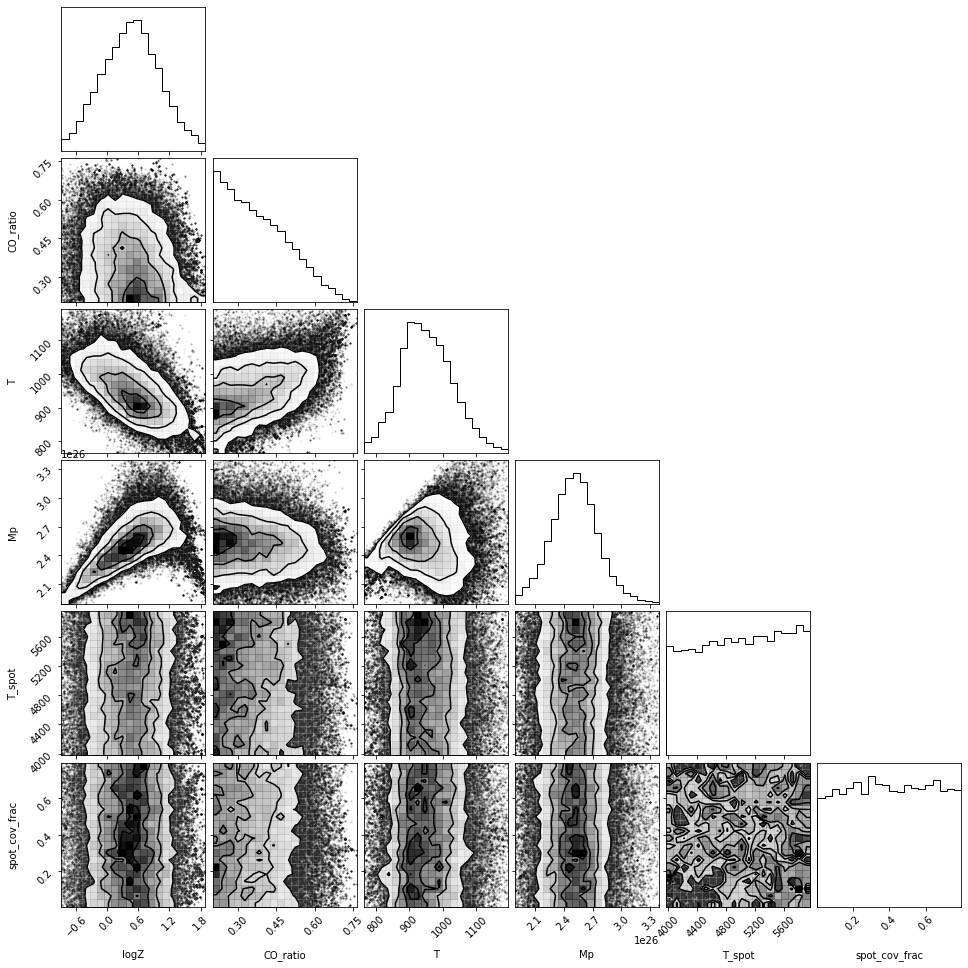

In [63]:
result.plot_corner()

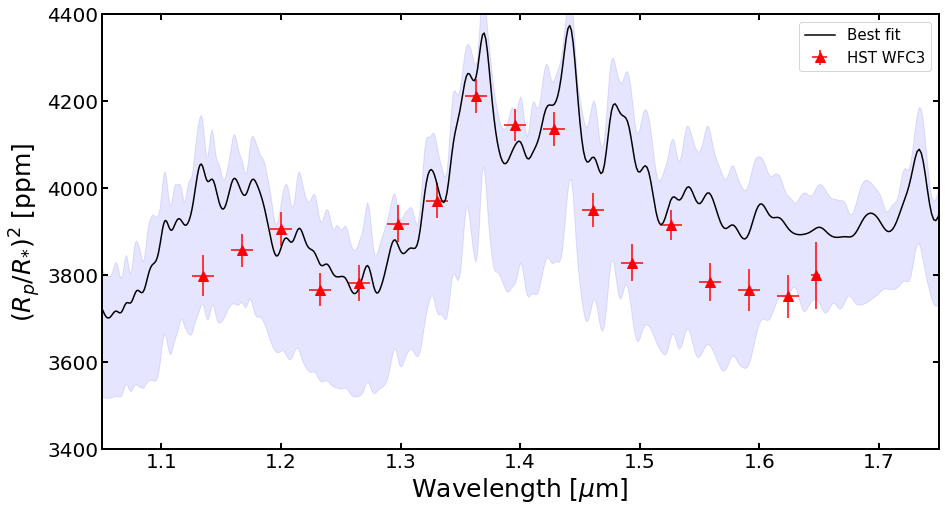

In [20]:
from platon.transit_depth_calculator import TransitDepthCalculator
from platon.constants import M_jup, R_jup, R_sun, M_earth
import matplotlib.pyplot as plt
# All inputs and outputs for PLATON are in SI
import numpy as np
Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.5) #* M_earth
Rp = np.quantile(samples[5000:][:,4],0.5)#0.7529*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.5)
Z= np.quantile(samples[5000:][:,0],0.5)
CO= np.quantile(samples[5000:][:,1],0.5)
#alpha= np.quantile(samples[2000:][:,6],0.5)
#z,mp,rp,
# The initializer loads all data files.  Create a TransitDepthCalculator
# object and hold on to it
calculator = TransitDepthCalculator(method="xsec") #"ktables" for correlated k

# compute_depths is fast once data files are loaded
wavelengths, depths, info_dict_best = calculator.compute_depths(Rs, Mp, Rp, T, logZ=0.8, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
from scipy.ndimage import gaussian_filter
fig,ax=plt.subplots(1,1,figsize=(15,8))
#plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,4),label='logZ=0.0, C/O=0.53')

#wavelengths, depths, info_dict = calculator.compute_depths(Rs, Mp, Rp, T, logZ=-1.0, CO_ratio=0.53, full_output=True)
from scipy.ndimage import gaussian_filter
#fig,ax=plt.subplots(1,1)
plt.plot(wavelengths*1e6,gaussian_filter(depths*1e6,3),label='Best fit',color='black',ls='-')


from platon.abundance_getter import AbundanceGetter
getter = AbundanceGetter()
abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["H2O"] *= 0
#abundances["NH3"]*=0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,cloudtop_pressure=np.inf)
#plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,3),label='H2O supressed',ls='dotted',color='green',lw=2.5)

abundances = getter.get(Z, CO)

# Zero out CO.  (Note that if CO is a major component, you should probably
# renormalize the abundances of other species so that they add up to 1.)
#abundances["CO"] *= 0

# Set CH4 abundance to a constant throughout the atmosphere
#abundances["H2O"] *= 0
abundances["CH4"] *= 0
#abundances["CO2"] *= 0
wavelengths0,depths0=calculator.compute_depths(Rs,Mp,Rp, T,
logZ=None, CO_ratio=None, custom_abundances=abundances,cloudtop_pressure=np.inf)
#plt.plot(wavelengths0*1e6,gaussian_filter(depths0*1e6,5),label='CH4 supressed',ls='dotted',color='orange',lw=2.5)
#abundances["CO"]=*0
ax.set_xlim(1.05,1.75)

wfc3_offset=np.ones_like(wave)
wfc3=0.0
wfc3_offset=wfc3_offset*wfc3
wfc3_offset[0]=0.0
wfc3_offset[-1]=0
wfc3_offset[-2]=0.0
plt.errorbar(wave,(Rad)*1e6+wfc3_offset,yerr=(Rad_err)*1e6,xerr=wave_err,ls='none',marker='^',color='red',ms=10,label='HST WFC3')


Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.84) #* M_earth
Rp = np.quantile(samples[5000:][:,4],0.84)#0.7529*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.84)
Z= np.quantile(samples[5000:][:,0],0.84)
CO= np.quantile(samples[5000:][:,1],0.84)
#alpha= np.quantile(samples[2000:][:,6],0.84)
wavelengths, depths1, info_dict = calculator.compute_depths(1.31*R_sun, Mp, Rp, T, logZ=Z, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
#plt.semilogx(wavelengths*1e6,gaussian_filter(depths1*1e6,5),ls='--',color='black')

Rs = 1.31 * R_sun
Mp = np.quantile(samples[5000:][:,3],0.16) #* M_earth
Rp = np.quantile(samples[5000:][:,4],0.16)#0.75298*R_jup#0.76 * R_jup
T =   np.quantile(samples[5000:][:,2],0.16)
Z= np.quantile(samples[5000:][:,0],0.16)
CO= np.quantile(samples[5000:][:,1],0.16)
#alpha= np.quantile(samples[2000:][:,6],0.16)
wavelengths, depths2, info_dict = calculator.compute_depths(1.31*R_sun, Mp, Rp, T, logZ=-1.0, CO_ratio=CO,cloudtop_pressure=np.inf, full_output=True)
ax.fill_between(wavelengths*1e6,y1=gaussian_filter(depths2*1e6,2),y2=gaussian_filter(depths1*1e6,2),color='blue',alpha=0.1)
ax.set_ylim(3400,4400)
ax.tick_params(which='major',direction='in',labelsize=20,length=6,width=2,top=True,right=True)
#ax.tick_params(which='minor',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
#axs[1].tick_params('both',direction='in',labelsize=15,length=6,width=2,top=True,right=True)
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2.0)
ax.set_ylabel(r'$(R_{p}/R_{*})^{2}$ [ppm]',fontsize=25)
ax.set_xlabel(r'Wavelength [$\mu$m]',fontsize=25)


#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model.pdf',format='pdf')

#plt.errorbar(w_spit,(rp_spit**2)*1e6,xerr=w_err_spit,yerr=2*rp_spit*rp_err_spit*1e6,ls='none',marker='s',ms=12,color='olive',label='Spitzer/Kepler')
#plt.errorbar(kepler[0],kepler[2]*1e6,xerr=kepler[1],yerr=kepler[3]*1e6,ls='none',marker='s',ms=12,color='olive')
ax.legend(loc='upper right',fontsize=15)

#plt.savefig('/Users/s.baratuva.nl/Desktop/PhD/hst_data_analysis/v1298_taub/output/V1298_platon_model_hst_only_rp_free.pdf',format='pdf')




